Carolina Niewöhner | Master Thesis | 19.07.2024

# Agglomorative hierarchical clustering of the GESIS dataset
In this notebook I perfrom the clustering analysis on the GESIS dataset exploring weightings and distance cutoff values.

## Importing Packages

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import os

import scipy.cluster.hierarchy as sch
from scipy.cluster.hierarchy import linkage, dendrogram, inconsistent, fcluster

## Importing Data

In [2]:
# Get the current working directory
current_dir = os.getcwd()

In [3]:
#importing non standardized dataset
df_housing= pd.read_csv(f"{current_dir}/tables/20240326_GESIS_reduced.csv",index_col=[0])

In [4]:
#standardized dataset
df_housing_stand= pd.read_csv(f"{current_dir}/tables/20240326_GESIS_reduced_stand.csv",index_col=[0])

## Hierarchical Clustering without weighting

I decided to not perform an PCA as I wanted to assess the difference in all dimensions and not loose any variance.

### Functions

In [5]:
# This function performs an agglomorative hierarchical clustering and
# prints the last 10 merger values to decide on a cutoff value.
def hierarch_clustering_allmergers (df_stand,weighting):
    """
    Perform hierarchical clustering.

    Parameters:
    df_stand (DataFrame): Standardized data for clustering.
    weighting (str): A label for weighting of the main variable floor area per person, used in the filename of the saved plot.

    Returns:
    Z (ndarray): The linkage matrix containing the hierarchical clustering.
    """
    
    # Perform hierarchical/agglomerative clustering using the Ward method
    Z = linkage(df_stand, method='ward')
    
    def last_10_merger_values(Z):
        """
        Extract the last 10 merger values from the linkage matrix.

        Parameters:
        Z (ndarray): The linkage matrix from hierarchical clustering.

        Returns:
        last_10_levels (ndarray): The last 10 merger distances.
        """
        # Get the last 10 agglomeration levels
        last_10_levels = Z[-10:, 2]
        return last_10_levels

    # Get the last 10 merger values
    last_10_levels = last_10_merger_values(Z)

    # Display the last 10 merger values
    print("Merger values of the last 10 agglomeration levels:")
    for i, value in enumerate(last_10_levels, start=1):
        print(f"Level {i}: {value}")
        
    # Return the linkage matrix   
    return (Z)

In [6]:
# This function uses a distance cutoff value to form clusters,
# assigns cluster labels to the original DataFrame,
# and returns the DataFrame with cluster labels and the mean values of each cluster.
def hier_clustering (Z,df_housing,distance):
    """
    Perform hierarchical clustering for a specified distance
    and calculate the mean values of each feature for each cluster.

    Parameters:
    Z (ndarray): The linkage matrix from hierarchical clustering.
    df_housing (DataFrame): The original data to which clustering labels will be added.
    distance (float): The distance cutoff to form clusters.

    Returns:
    hier_cluster (DataFrame): The original DataFrame with an additional 'cluster' column.
    hier_cluster_means (DataFrame): The mean values of each feature for each cluster.
    """
    # find clusters for the predefined distance cutoff
    clusters_h = fcluster(Z, distance, criterion='distance')

    # Assign cluster labels to the original DataFrame
    df_housing_reduced_hier=df_housing
    df_housing_reduced_hier['cluster'] = clusters_h
    hier_cluster=df_housing_reduced_hier
    
    # Group by cluster and calculate the mean of each feature for each cluster
    hier_cluster_means=df_housing_reduced_hier.groupby('cluster').mean().T
    return (hier_cluster,hier_cluster_means)

In [7]:
# This function uses a distance cutoff value to form clusters,
# assigns cluster labels to the original DataFrame,
# and returns the DataFrame with cluster labels and the median values of each cluster.
def hier_clustering_median (Z,df_housing,distance):
    """
    Perform hierarchical clustering for a specified distance
    and calculate the median values of each feature for each cluster.

    Parameters:
    Z (ndarray): The linkage matrix from hierarchical clustering.
    df_housing (DataFrame): The original data to which clustering labels will be added.
    distance (float): The distance cutoff to form clusters.

    Returns:
    hier_cluster (DataFrame): The original DataFrame with an additional 'cluster' column.
    hier_cluster_median (DataFrame): The median values of each feature for each cluster.
    """
    # find clusters for the predefined distance cutoff
    clusters_h = fcluster(Z, distance, criterion='distance')

    # Assign cluster labels to the original DataFrame
    df_housing_reduced_hier=df_housing
    df_housing_reduced_hier['cluster'] = clusters_h
    hier_cluster=df_housing_reduced_hier
    
    # Group by cluster and calculate the median of each feature for each cluster
    hier_cluster_median=df_housing_reduced_hier.groupby('cluster').median().T
    return (hier_cluster,hier_cluster_median)

### Analysis

Agglomorative hierarchical clustering without weighting.

In [8]:
Z_w1=hierarch_clustering_allmergers(df_housing_stand,1)

Merger values of the last 10 agglomeration levels:
Level 1: 23.039000030519087
Level 2: 23.421153790303993
Level 3: 23.815568896489005
Level 4: 24.954480916168
Level 5: 25.12612889036315
Level 6: 25.661215933378987
Level 7: 26.11659589874709
Level 8: 34.92853585522011
Level 9: 35.17191812873549
Level 10: 63.63633242632738


In [9]:
#saving the linkage matrix Z as a dataframe
Z_w1=pd.DataFrame(Z_w1)
Z_w1

,0,1,2,3
0,1.0,14.0,0.000000,2.0
1,2.0,282.0,0.000000,2.0
2,4.0,9.0,0.000000,2.0
3,25.0,1766.0,0.000000,2.0
4,1199.0,1743.0,0.000000,2.0
...,...,...,...,...
3784,7563.0,7569.0,25.661216,877.0
3785,7559.0,7573.0,26.116596,1339.0
3786,7572.0,7574.0,34.928536,1778.0
3787,7570.0,7575.0,35.171918,2012.0


In [10]:
#Calculating the within difference of the vraince to decide for a suitable cutoff value to find the clusters
within_variance_weight1=pd.DataFrame(Z_w1.iloc[:,2])
within_variance_weight1.columns=["within_variance"]
within_variance_weight1["difference"]=within_variance_weight1['within_variance'].diff()
within_variance_weight1

,within_variance,difference
0,0.000000,NaN
1,0.000000,0.000000
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000000,0.000000
...,...,...
3784,25.661216,0.535087
3785,26.116596,0.455380
3786,34.928536,8.811940
3787,35.171918,0.243382


In [11]:
def difference_plot(df,cutoff,weighting):
    """
    Plot the difference in variance between each clustering step.
    
    Parameters:
    df (DataFrame): A matrix of within variance and difference between within variance for each clustering step.
    cutoff (integer): Cutoff value for x axis, only looking at clustering steps after cutoff value.
    weighting (integer): Weighting of main variable floor area per person.
    """
    # Filter the DataFrame to include only the desired range of x values
    filtered_df = df[(df.index >= cutoff) ]

    # Plot the 'difference' column
    plt.plot(filtered_df.index, filtered_df['difference'],color='black')
    plt.xlabel('Clustering Step')
    plt.ylabel('Within Cluster Variance')
    plt.savefig(("figures/difference_plot_from"+str(cutoff)+str(weighting)+".svg"), format='svg')
    plt.show()

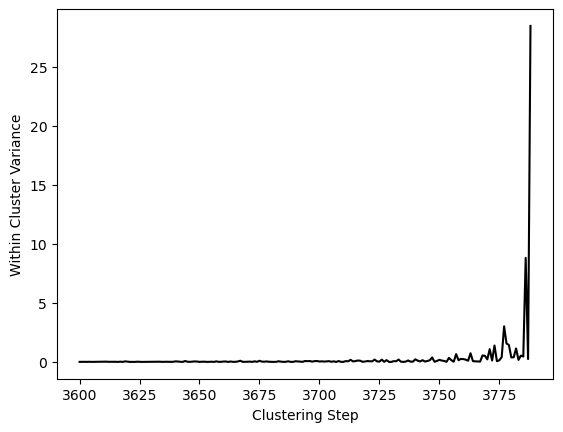

In [12]:
difference_plot(within_variance_weight1,3600,"weighting_1")

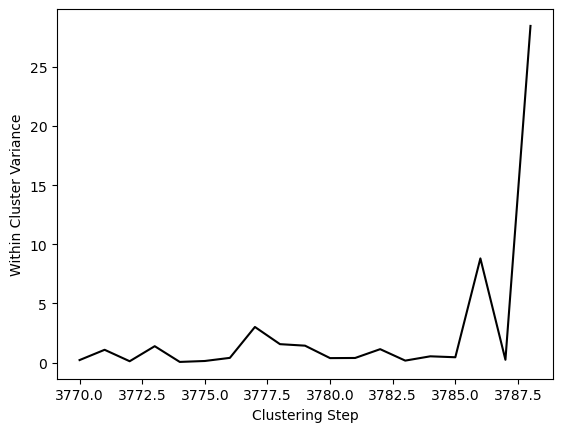

In [13]:
difference_plot(within_variance_weight1,3770,"weighting_1")

In [14]:
within_variance_weight1.iloc[-10:]

,within_variance,difference
3779,23.039000,1.434773
3780,23.421154,0.382154
3781,23.815569,0.394415
3782,24.954481,1.138912
3783,25.126129,0.171648
3784,25.661216,0.535087
3785,26.116596,0.455380
3786,34.928536,8.811940
3787,35.171918,0.243382
3788,63.636332,28.464414


Until clusterig step 3785, the within variance does not increase significantly, however after by 8. Thus, I set distance cutoff at 30.

In [15]:
#Clustering for a distance cutoff value of 30
hier_cluster_weight1,hier_cluster_means_weight1=hier_clustering(Z_w1,df_housing,30)

### KDE plot for floor area to see different weightings

#### functions

In [16]:
#Function to plot distributions of continous variables for each cluster.
def kde_plot (df,variable,x_title,clustering_type,weighting):
    # Setup the facets
    facets = sns.FacetGrid(data=df, hue='cluster', \
                  sharey=False, sharex=False, aspect=2)

    # Build the plot as a `sns.kdeplot`
    kdeplot_hier = facets.map(sns.kdeplot, variable, fill=True, warn_singular=False).add_legend()
    facets.set_axis_labels(x_title, "Density")
    plt.savefig(("figures/kdeplot_"+str(variable)+"_"+str(clustering_type)+"weight"+str(weighting)+".svg"), format='svg')

In [17]:
#Function to plot distributions of discrete variables for each cluster.
def bar_plot(df, variable, x_title, clustering_type, weighting):
    clusters = sorted(df['cluster'].unique())
    num_clusters = len(clusters)
    
    # Determine the number of rows and columns for subplots
    num_cols = min(num_clusters, 3)  # Maximum of 3 columns
    num_rows = (num_clusters + num_cols - 1) // num_cols
    max_variable_value = df[variable].max()
    # Create subplots
    fig, axes = plt.subplots(num_rows, num_cols, sharex=False, figsize=(4*num_cols, 4*num_rows))
    #max_num_bins = max(df[variable].nunique() for _, df in df.groupby('cluster'))
    
    # Plot each cluster's distribution
    for i, cluster in enumerate(clusters):
        row_idx = i // num_cols
        col_idx = i % num_cols
        subset = df[df['cluster'] == cluster]
        num_bins = len(subset[variable].unique())
        
        ax = axes[row_idx][col_idx] if num_rows > 1 else axes[col_idx]
        
        sns.histplot(data=subset, x=variable, bins=num_bins, alpha=0.5, ax=ax, color='C'+str(i))
        ax.set_title('Cluster ' + str(cluster))
        ax.set_ylabel('Frequency')
        max_frequency = subset[variable].value_counts().max()  # Calculate maximum frequency value for the current cluster
        ax.set_xlabel('')
        
        # Set y-axis limits based on the maximum frequency value for the current cluster
        ax.set_ylim(0, max_frequency * 1.1)  # Add a small margin to the top
        ax.set_xlim(0, max_variable_value)
    
    for i in range(num_clusters, num_rows*num_cols):
        if num_rows == 1:
            axes[i].remove()
        else:
            axes[i // num_cols][i % num_cols].remove()
    
    # Set common x-axis label
    fig.text(0.5, 0.1, x_title, ha='center', fontsize=14)
    
    plt.tight_layout(rect=[0, 0.15, 1, 1])
    plt.subplots_adjust(top=0.85)  # Adjust top margin for suptitle
    plt.savefig(("figures/barplot_" + str(variable) + "_" + str(clustering_type) + "weight" + str(weighting) + ".svg"), format='svg') 


In [18]:
#Function to plot distributions of categorical variables for each cluster.
def categorical_bar_plot(df, cluster_column, categorical_columns, figure_title, clustering_type, weighting):

    clusters = sorted(df['cluster'].unique())
    num_clusters = len(clusters)
    
    # Determine number of rows and columns for subplots
    num_cols = min(num_clusters, 2)  # Limit to 3 columns
    num_rows = (num_clusters + num_cols - 1) // num_cols
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 4*num_rows), sharey=False)
    axes = axes.flatten()  # Flatten the axes array for easier indexing
    
    for i, cluster in enumerate(clusters):
        subset = df[df[cluster_column] == cluster]
        counts = subset[categorical_columns].sum(axis=0)
        
        # Plotting
        ax = axes[i]
        sns.barplot(x=counts.index, y=counts.values, color='lightgrey', ax=ax)
        ax.set_xlabel(figure_title)
        ax.set_ylabel('Frequency')
        ax.set_title('Cluster ' + str(cluster))
        ax.tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability
        
        # Adjust y-axis limit to the maximum count within the cluster
        ax.set_ylim(0, counts.max() * 1.1)  # Add a small margin to the top
    
    # Remove extra empty subplots
    for j in range(num_clusters, num_rows*num_cols):
        fig.delaxes(axes[j])
    
    plt.tight_layout()
    plt.savefig(("figures/barplot_" + clustering_type + "_weight" + str(weighting) + ".svg"), format='svg')
    plt.show()


In [19]:
#Function to plot all variables with the predefined plotting functions for a certain clustering results with cutoff value and weighting of main floor area per person.
def plotting_weighting (df,clustering_details,weight):
    kde_plot(df,'area_per_person',"Floor area per person per household in $m^2$",clustering_details,weight)
    kde_plot(df,'floor_area',"Floor area per household in $m^2$",clustering_details,weight)
    kde_plot(df,'number_persons',"Number of persons per household",clustering_details,weight)
    bar_plot(df,'number_persons',"Number of persons per household",clustering_details,weight)
    bar_plot(df,'children',"Number of children per household",clustering_details,weight)
    bar_plot(df,'18y_65y',"Number of 18y-65y per household",clustering_details,weight)
    bar_plot(df,'over_66y',"Number of over 66y per household",clustering_details,weight)
    bar_plot(df,'with_partner',"Living with partner (yes=1, no=0)",clustering_details,weight)
    bar_plot(df,'west',"Household Location (west=1,east=0)",clustering_details,weight)
    bar_plot(df,'ownership',"Households owning (ownership=1)",clustering_details,weight)
    categorical_bar_plot(df, 'cluster',
                         ['detached_house', 'attached_house', 'multifamily_house', 'apartment_block', 'farm_house'],
                         'Housing Type', str('housing_type_'+str(clustering_details)), weight)
    categorical_bar_plot(df, 'cluster',
                         ['large_city','medium_city', 'large_small_town', 'small_small_town','rural_community'],
                         'City Type', str('city_type_'+str(clustering_details)), weight)
    categorical_bar_plot(df, 'cluster',
                         ['low_income_class', 'low_middle_income_class', 'middle_income_class','upper_middle_income_class', 'high_income_class'],
                         'Income Class', str('income_class_'+str(clustering_details)), weight)

##### Plots for clustering with no weight and distance cutoff value of 30

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. 

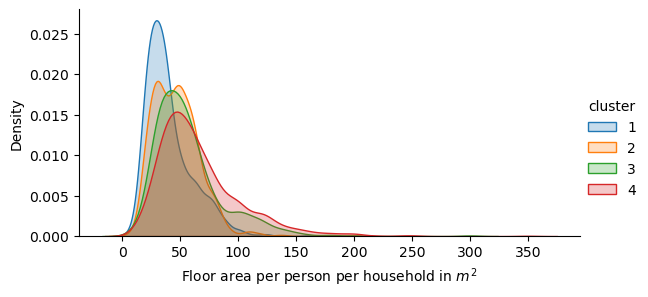

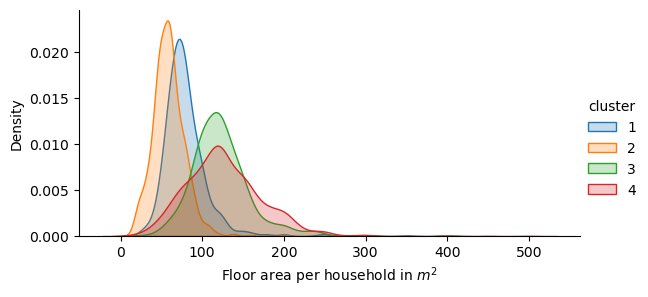

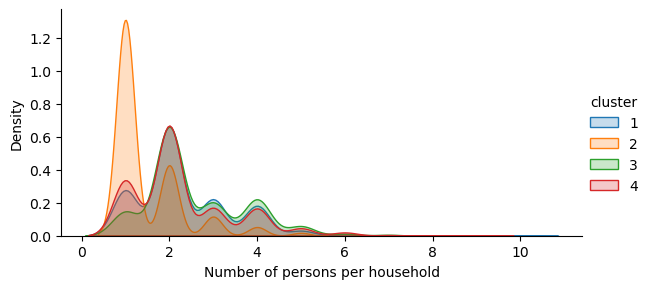

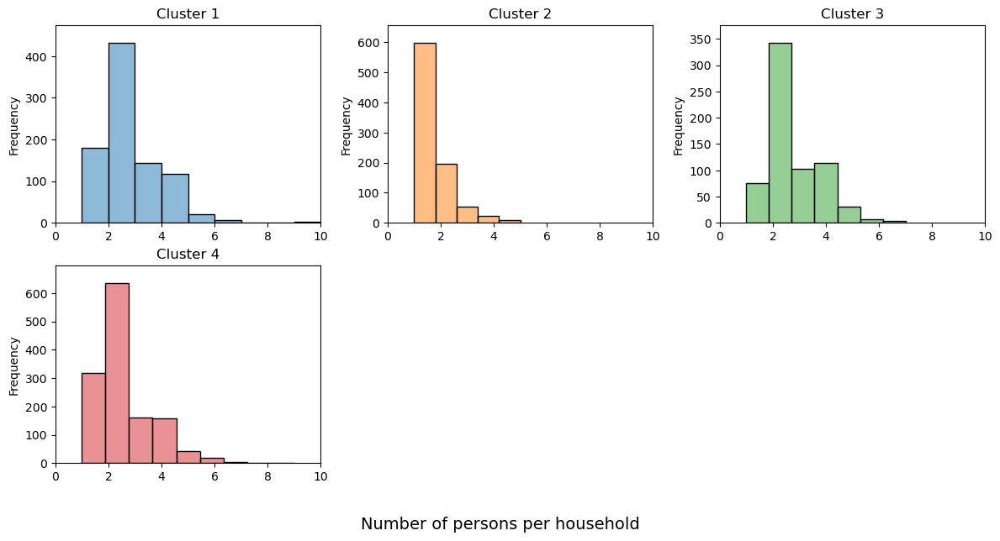

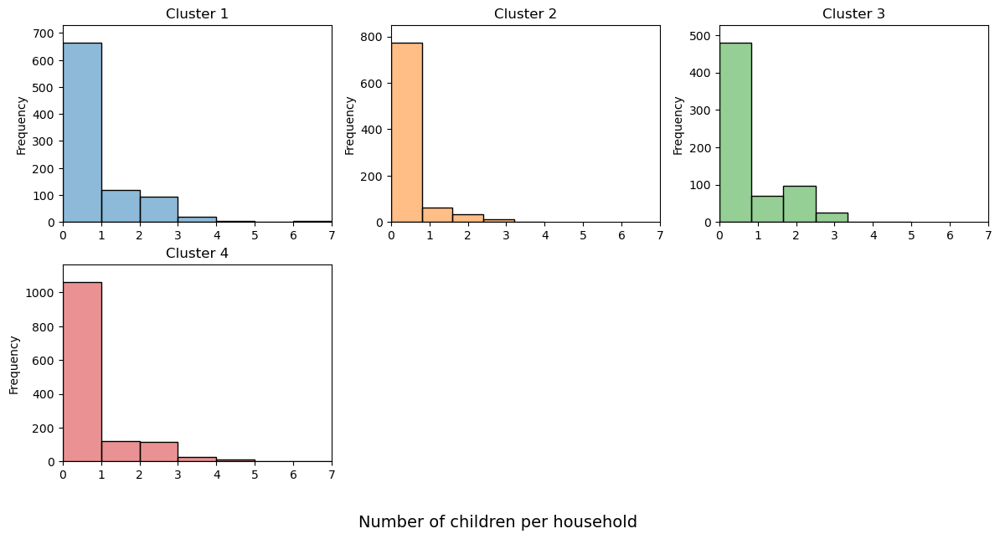

...

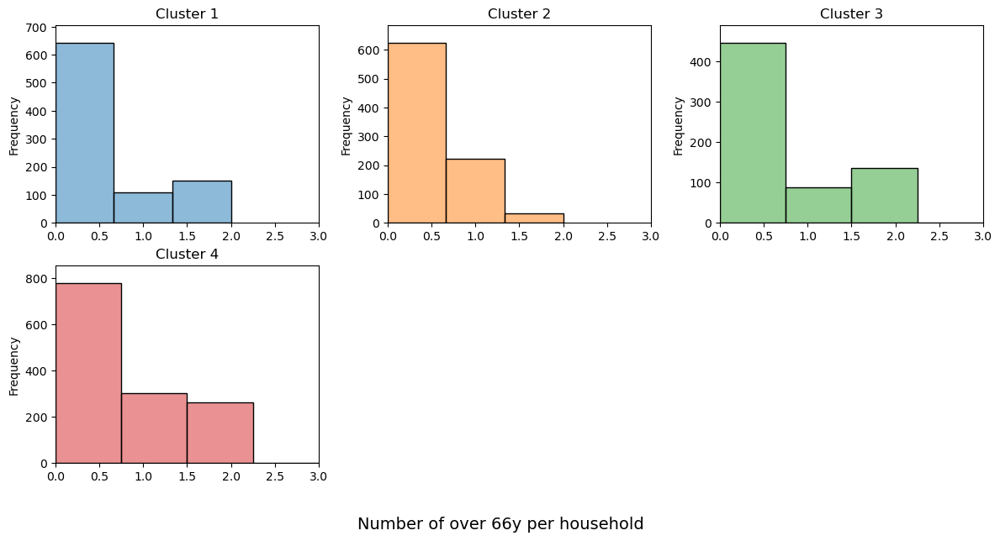

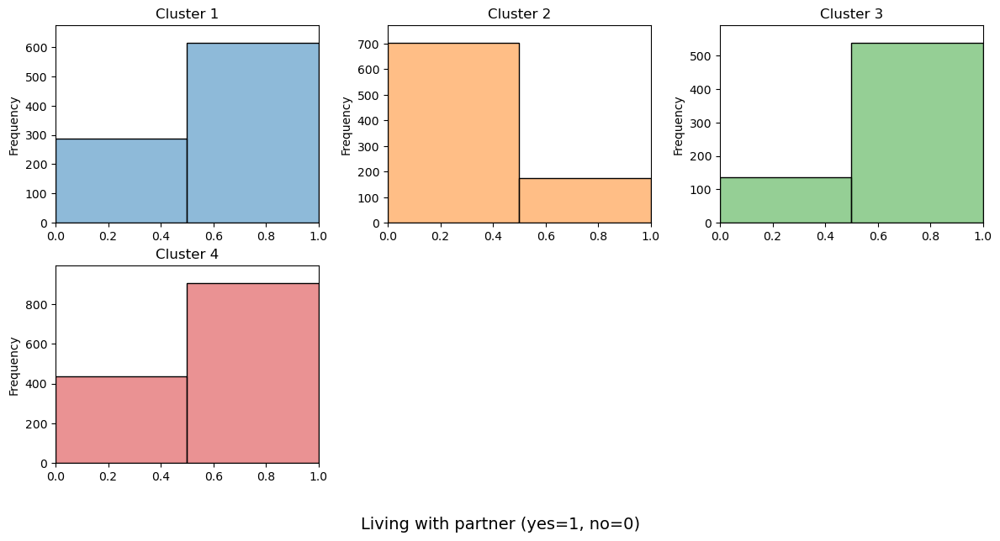

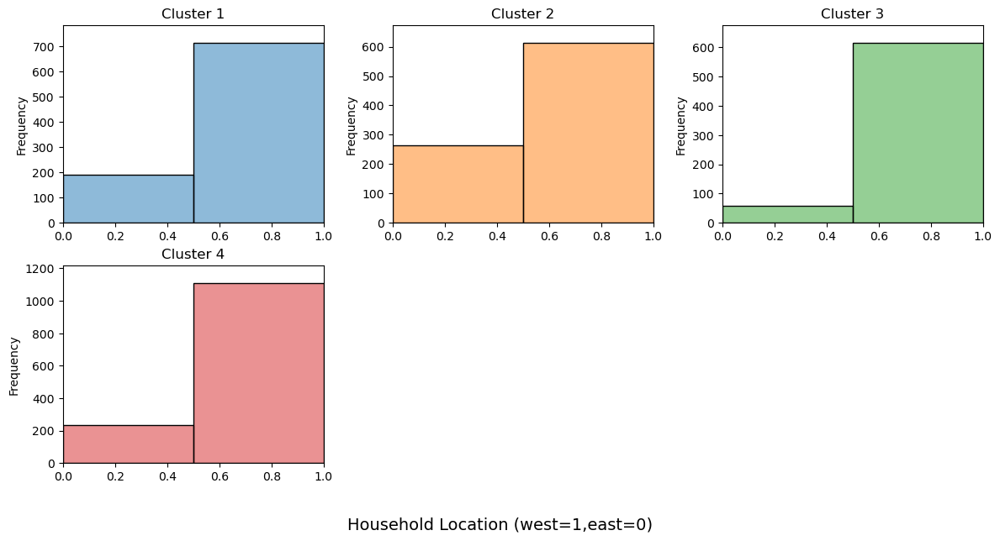

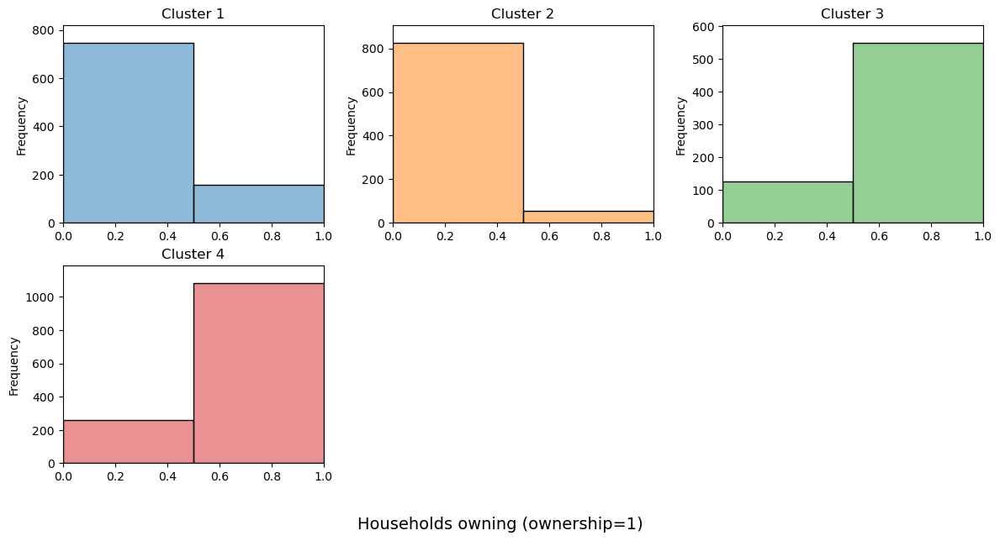

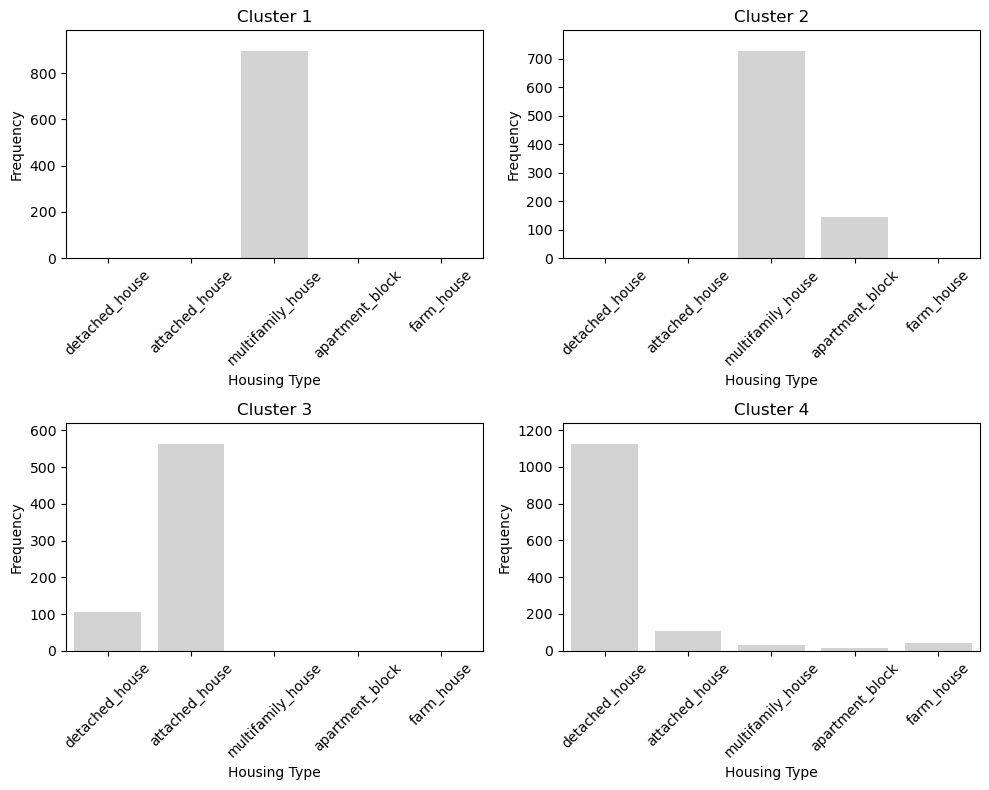

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

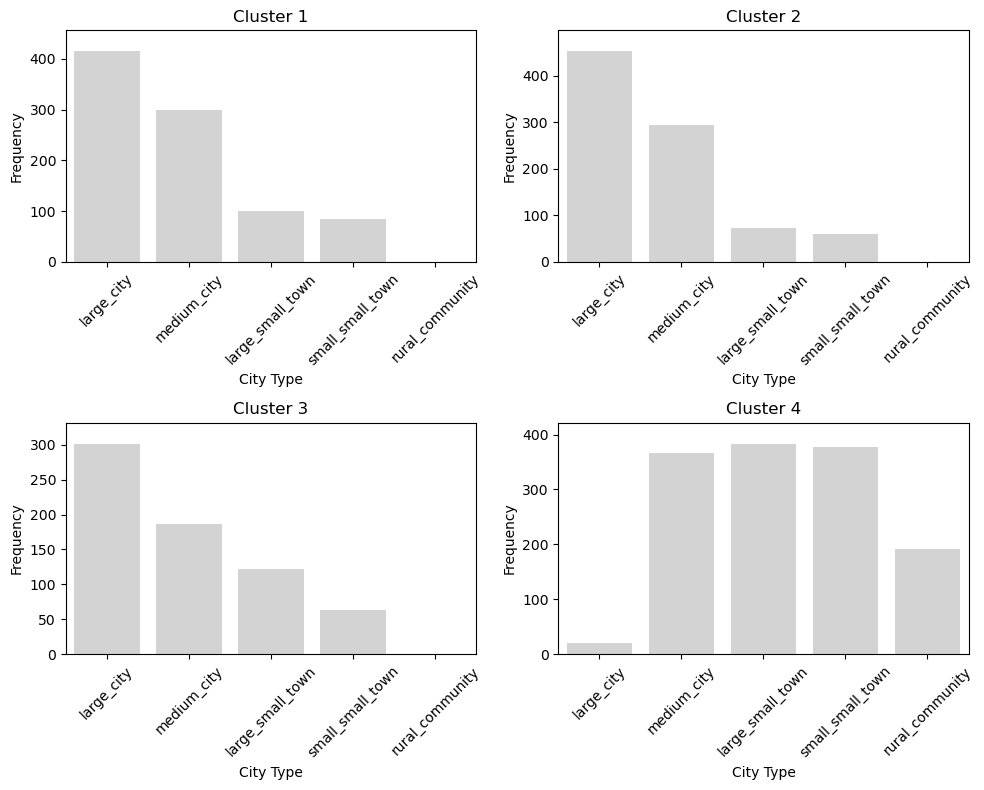

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

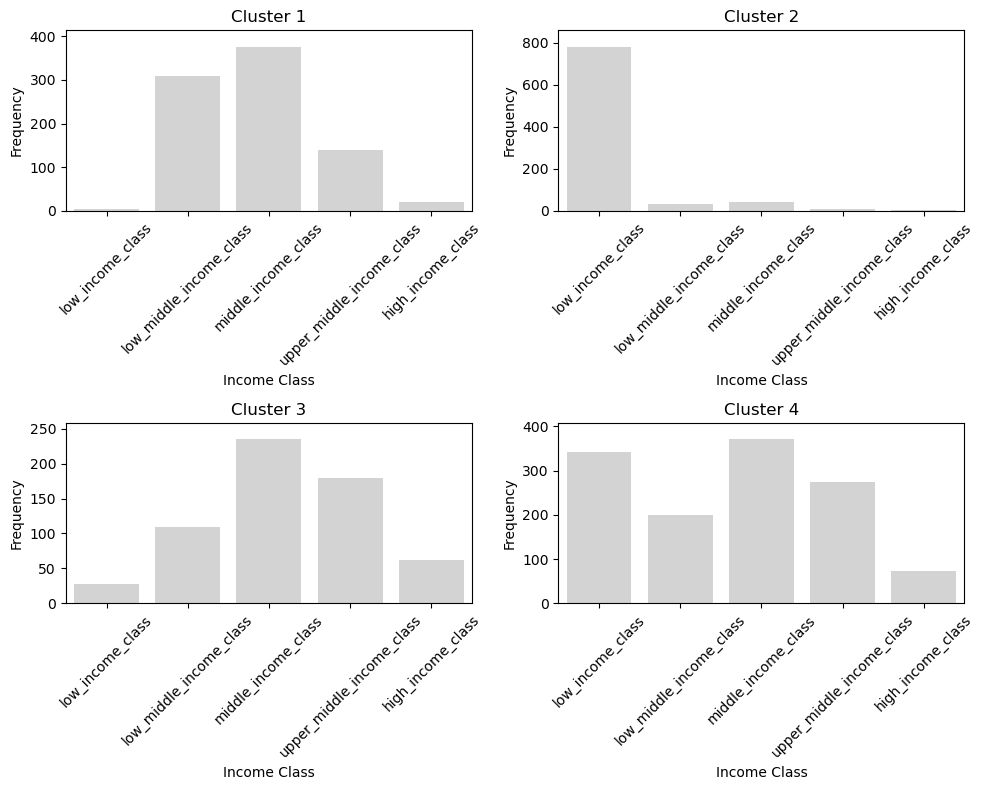

In [20]:
plotting_weighting(hier_cluster_weight1,"hier_distance30",1)

It is visible that the clusters are not different enough for the main variable floor area per person. Thus, I experimented witht he weighting to get more distinct results, however, at the same time not lose variance in the other variables.

### Now I will change the weighting to explore the distributions for different variables with different weighting

In [21]:
def df_weighting_change (df_housing_stand,weighting):
    df_housing_stand_weight = df_housing_stand.copy()
    df_housing_stand_weight['area_per_person_weight'] = df_housing_stand_weight['area_per_person'] * weighting
    df_housing_stand_weight.drop('area_per_person', axis=1, inplace=True)
    df_housing_stand_weight
    return (df_housing_stand_weight)

#### Analysis with a weighting of 2

In [22]:
#Applying weighting of 2
df_housing_stand_weight2=df_weighting_change(df_housing_stand,2)

In [23]:
#Creating Z linkage matrix 
Z_w2=hierarch_clustering_allmergers(df_housing_stand_weight2,2)

Merger values of the last 10 agglomeration levels:
Level 1: 22.77913548176083
Level 2: 23.908583917275113
Level 3: 24.178595114364896
Level 4: 24.54824106421952
Level 5: 24.955823135102335
Level 6: 25.34482074385293
Level 7: 26.25240249366929
Level 8: 34.657863849373456
Level 9: 35.43299098349167
Level 10: 63.769374260281126


In [24]:
#Create difference matrix
Z_w2=pd.DataFrame(Z_w2)
within_variance_weight2=pd.DataFrame(Z_w2.iloc[:,2])
within_variance_weight2.columns=["within_variance"]
within_variance_weight2["difference"]=within_variance_weight2['within_variance'].diff()

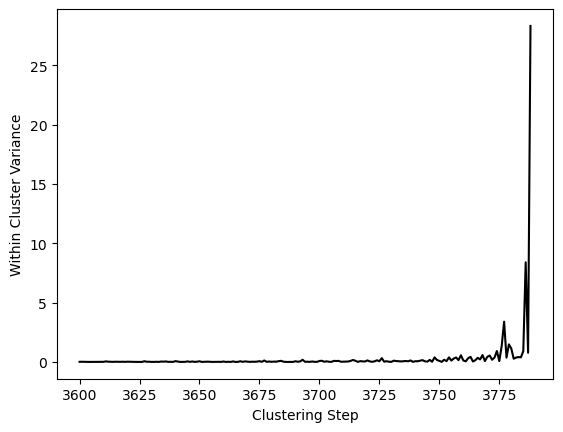

In [25]:
#Plotting difference in variance between clustering steps
difference_plot(within_variance_weight2,3600,"weighting_2")

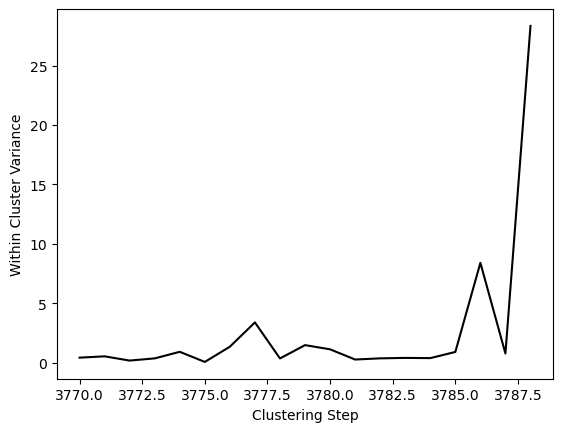

In [26]:
#More zoomed in plot
difference_plot(within_variance_weight2,3770,"weighting_2")

Performing a clustering for a weighting of 2 with a distance cutoff of 30.

In [27]:
hier_cluster_weight2,hier_cluster_means_weight2=hier_clustering(Z_w2,df_housing,30)

##### plots

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. 

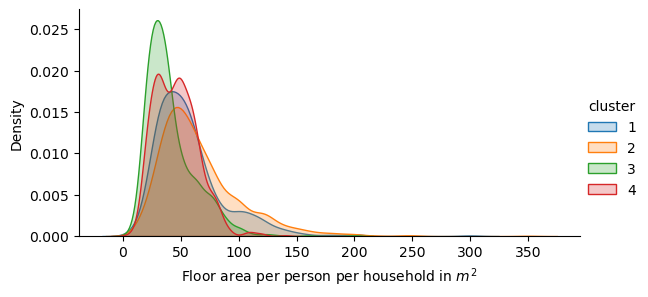

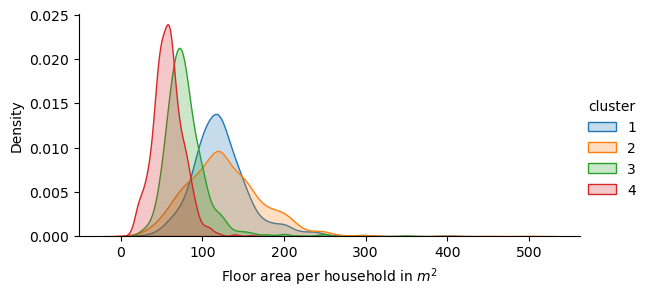

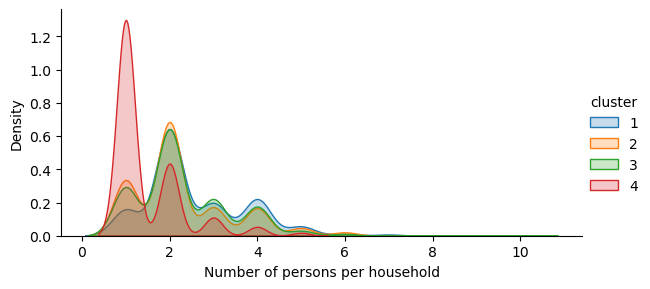

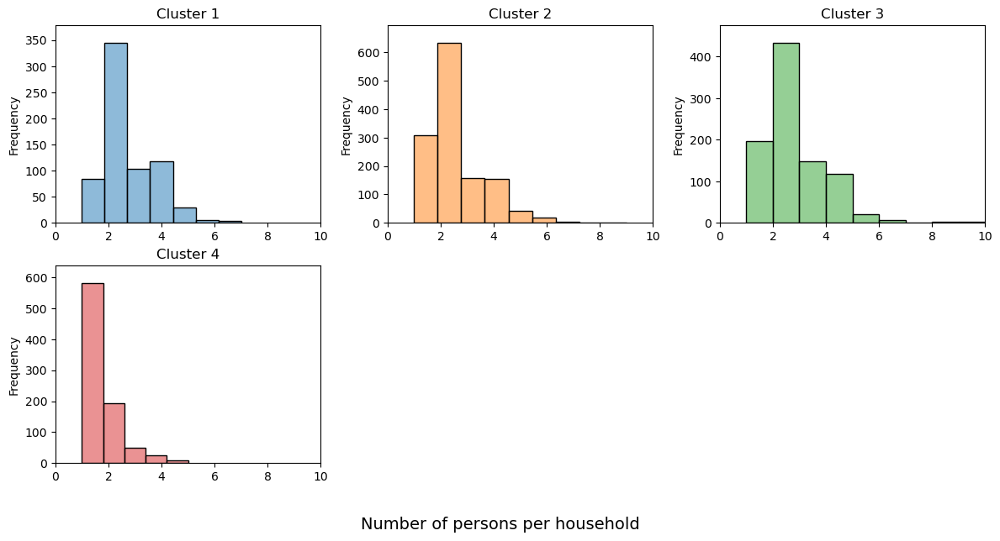

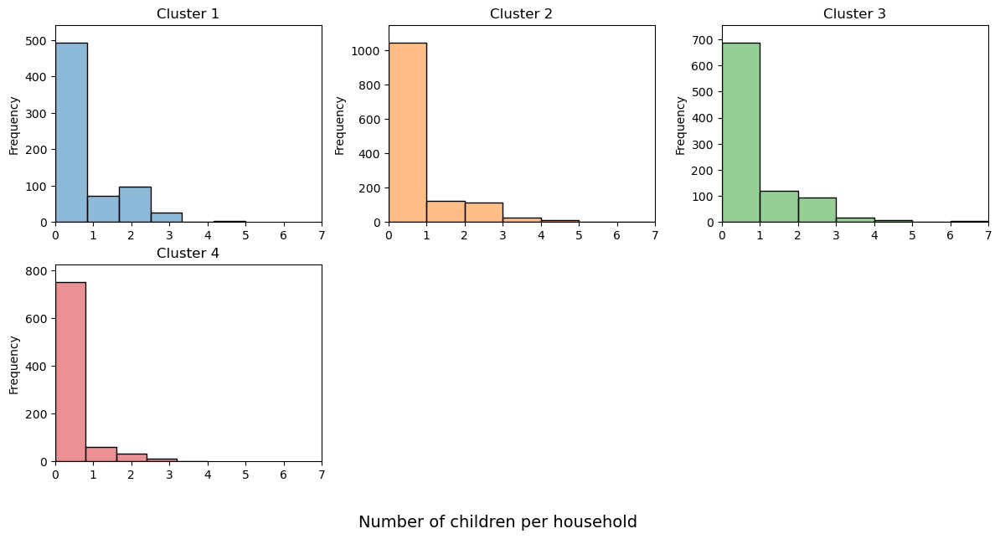

...

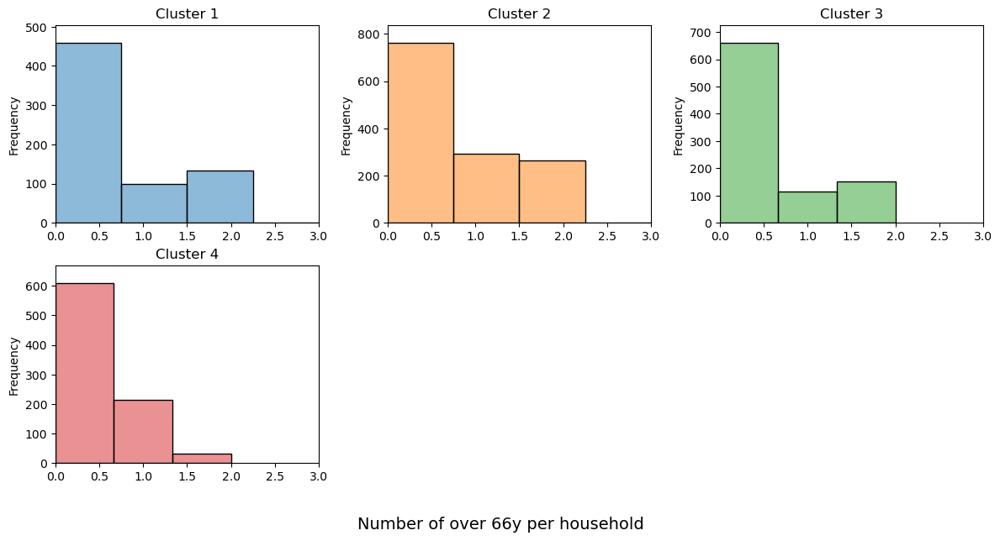

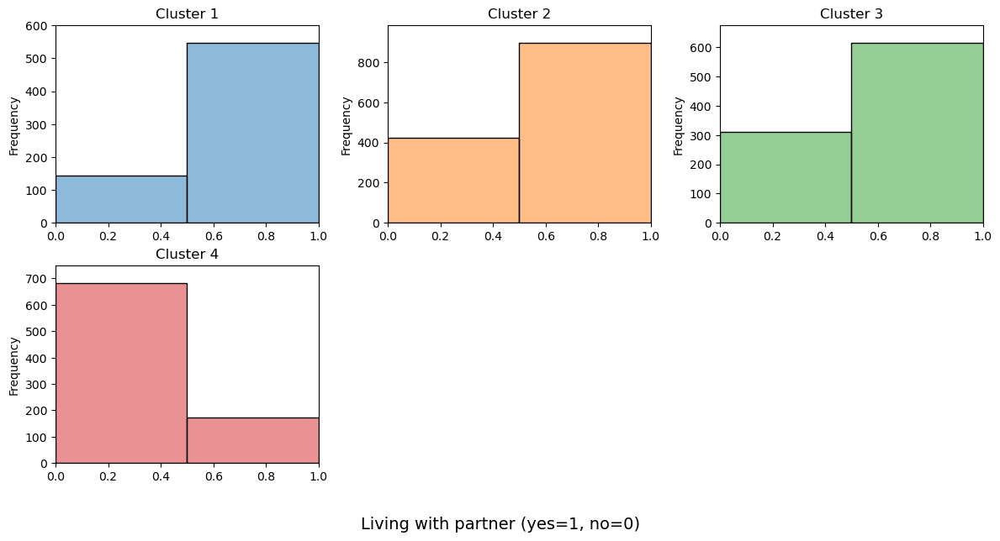

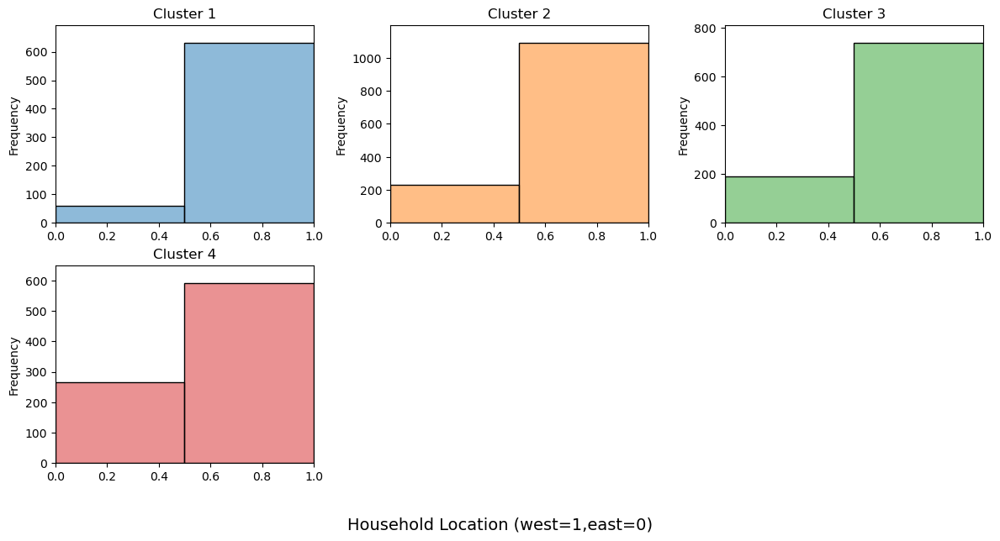

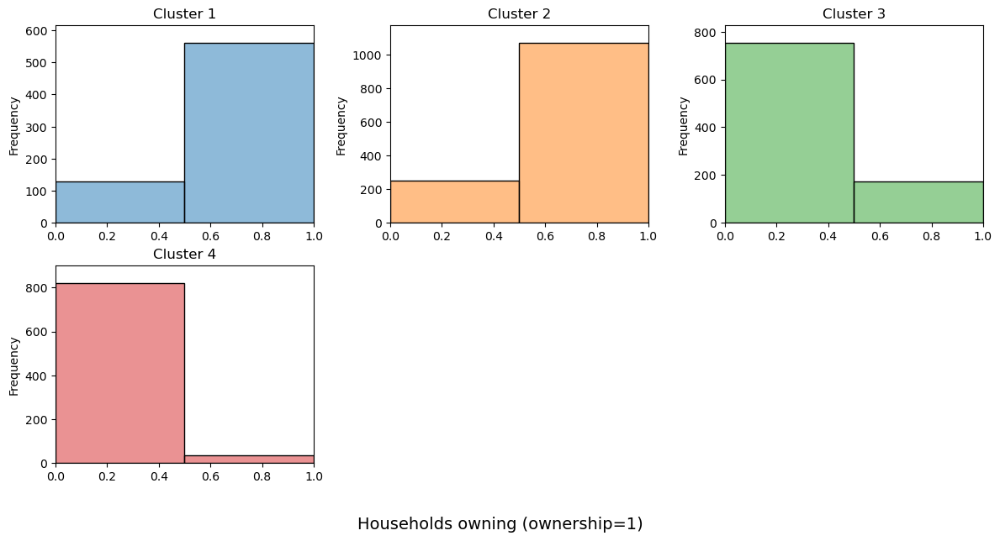

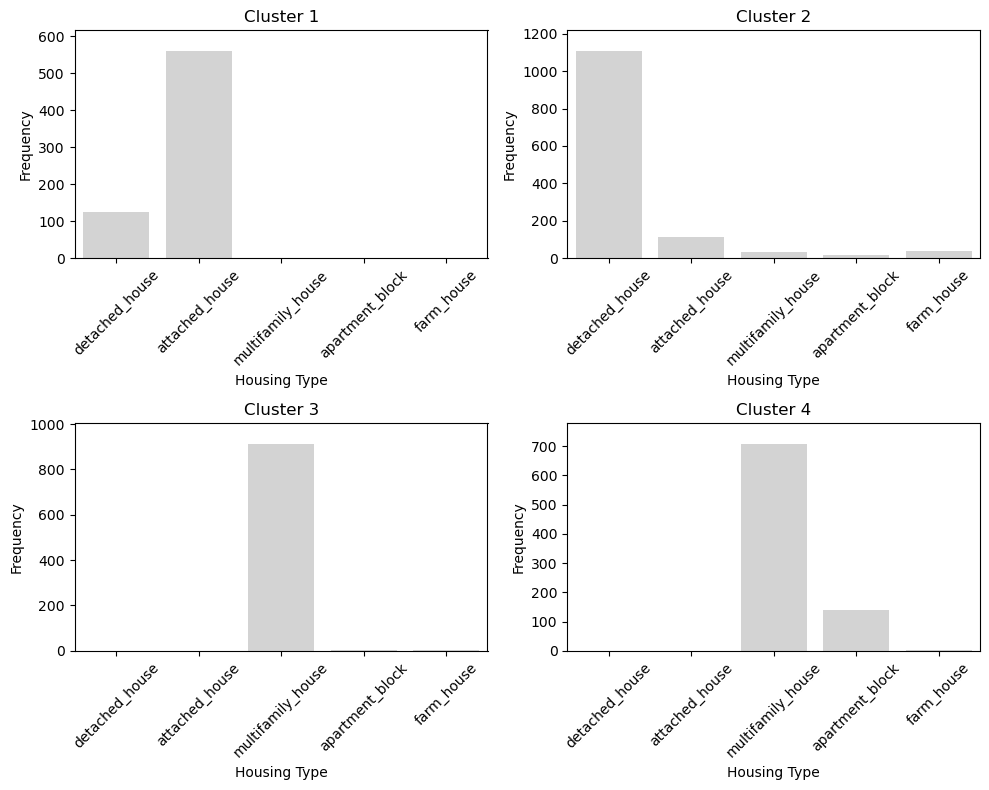

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

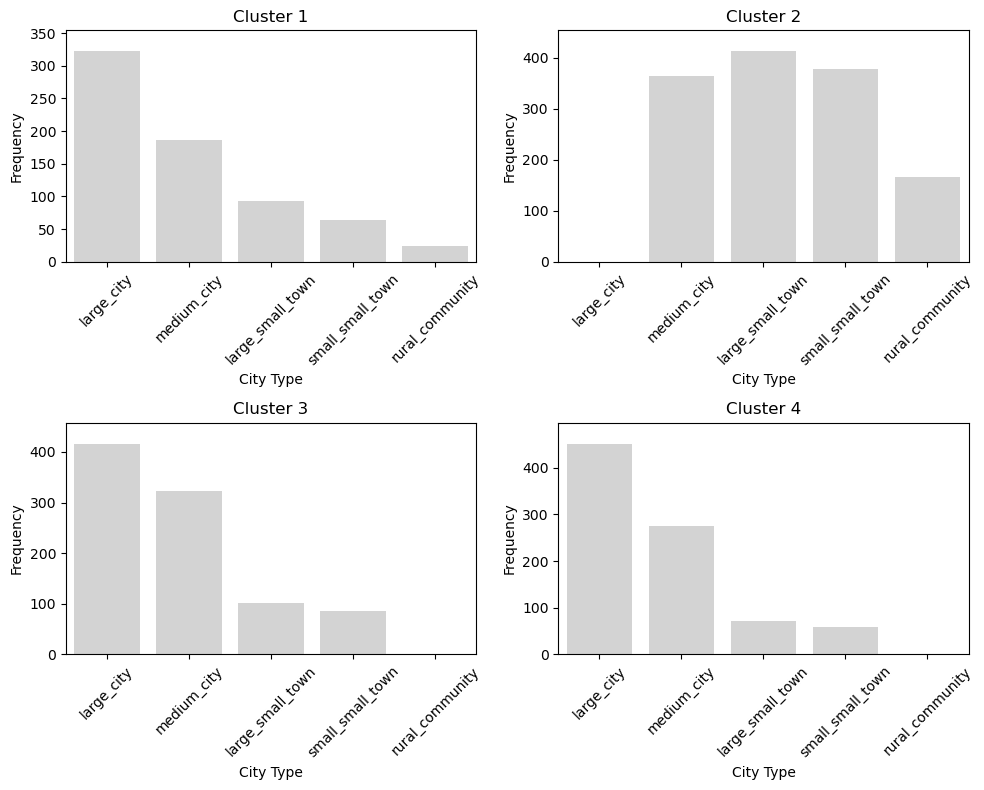

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

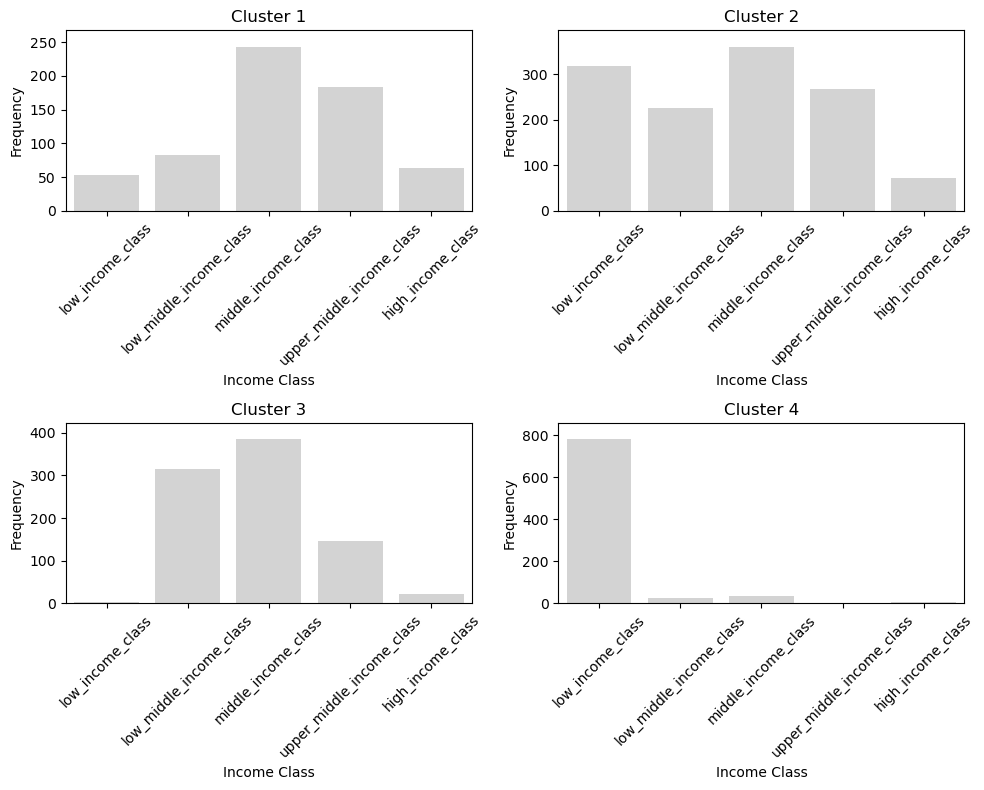

In [28]:
plotting_weighting(hier_cluster_weight2,"hier_distance30",2)

#### Perfroming the same analysis with a weighting of 5 to get more distinct clusters

In [29]:
#Applying weighting of 5
df_housing_stand_weight5=df_weighting_change(df_housing_stand,5)

In [30]:
#Creating Z linkage matrix
Z_w5=hierarch_clustering_allmergers(df_housing_stand_weight5,5)

Merger values of the last 10 agglomeration levels:
Level 1: 20.567809328389597
Level 2: 21.445803673197627
Level 3: 23.03986038432265
Level 4: 23.20278567776263
Level 5: 24.09896785043212
Level 6: 25.11587136396331
Level 7: 25.60366761651643
Level 8: 33.40013584654918
Level 9: 41.13108712782353
Level 10: 65.58463414037439


In [31]:
Z_w5=pd.DataFrame(Z_w5)
#creating within variance and difference matrix to find cutoff value
within_variance_weight5=pd.DataFrame(Z_w5.iloc[:,2])
within_variance_weight5.columns=["within_variance"]
within_variance_weight5["difference"]=within_variance_weight5['within_variance'].diff()

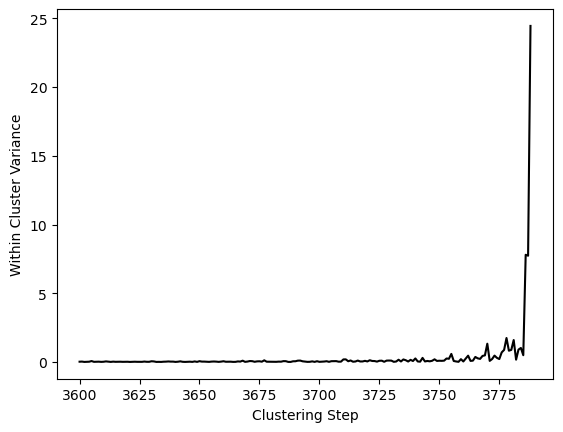

In [32]:
difference_plot(within_variance_weight5,3600,"weighting_5")

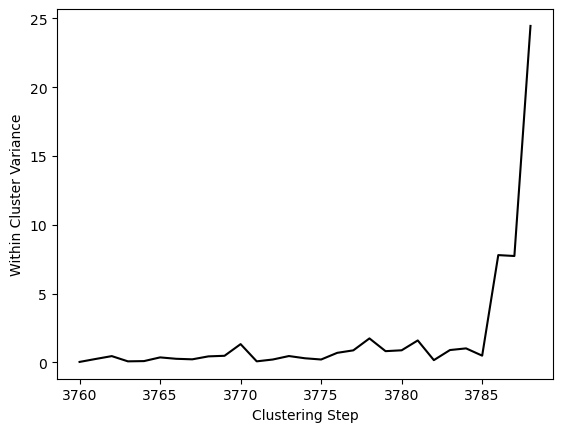

In [33]:
difference_plot(within_variance_weight5,3760,"weighting_5")

In [34]:
#Performing clustering with weighting of 5 and distance cutoff of 30
hier_cluster_weight5,hier_cluster_means_weight5=hier_clustering(Z_w5,df_housing,30)

##### Plots

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. 

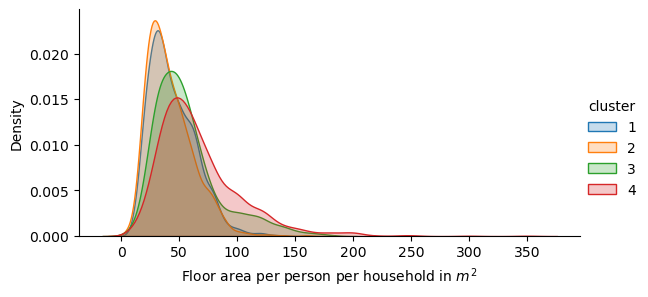

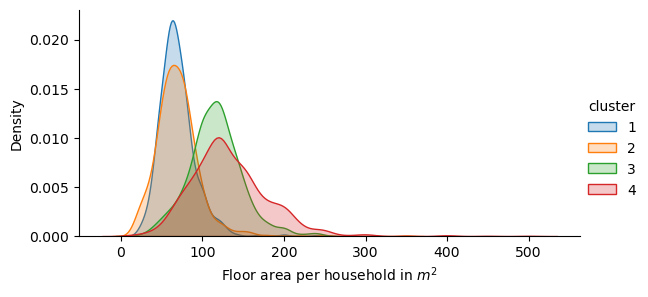

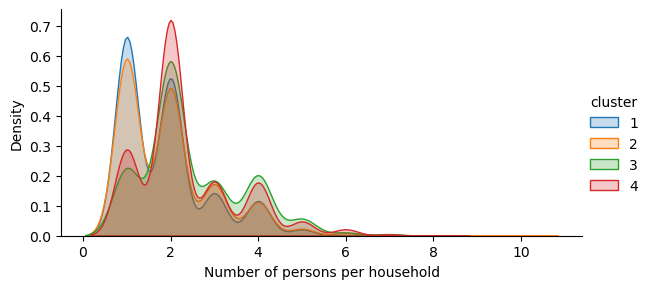

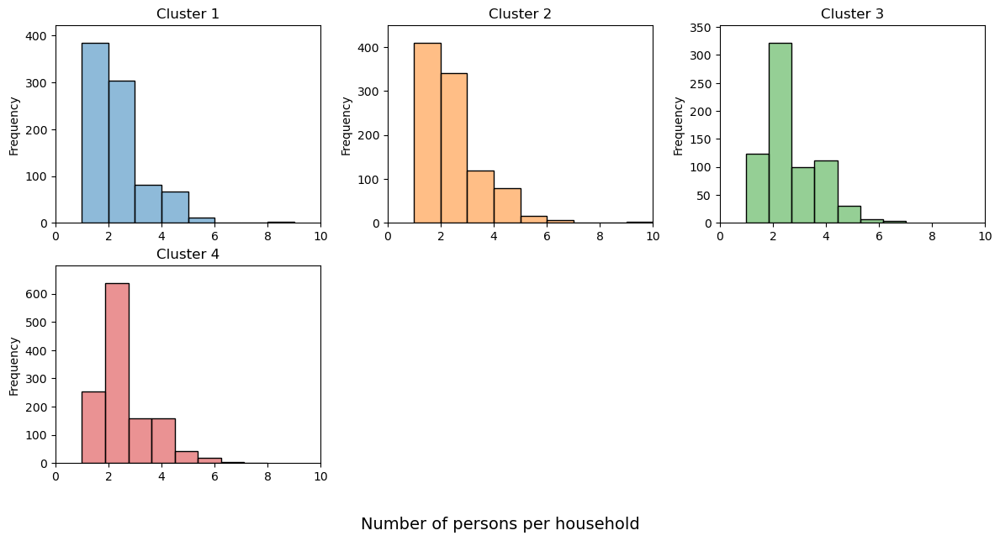

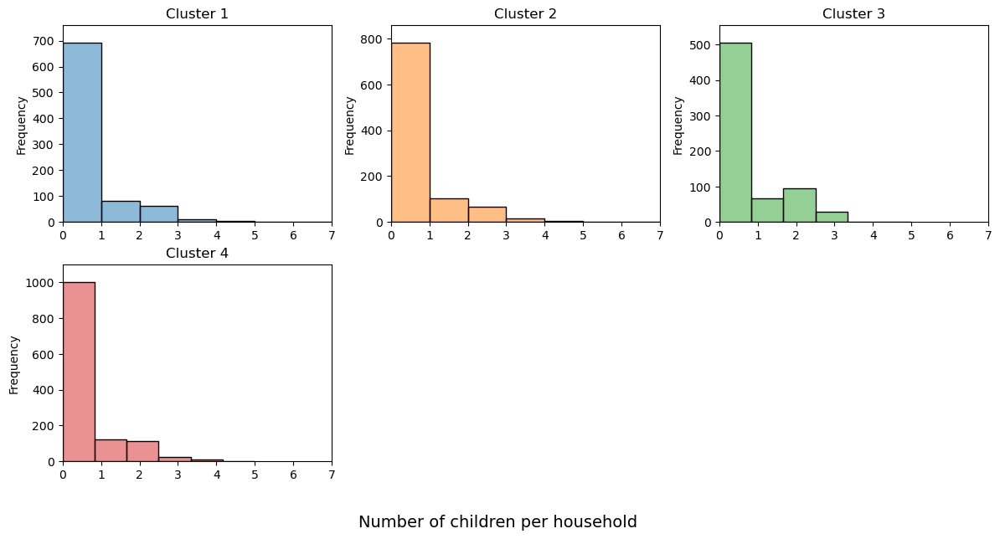

...

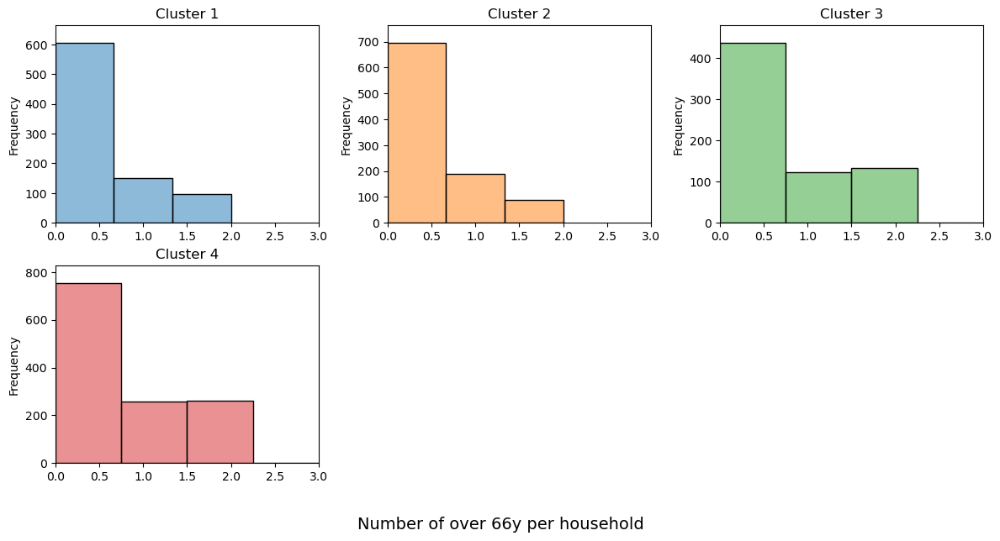

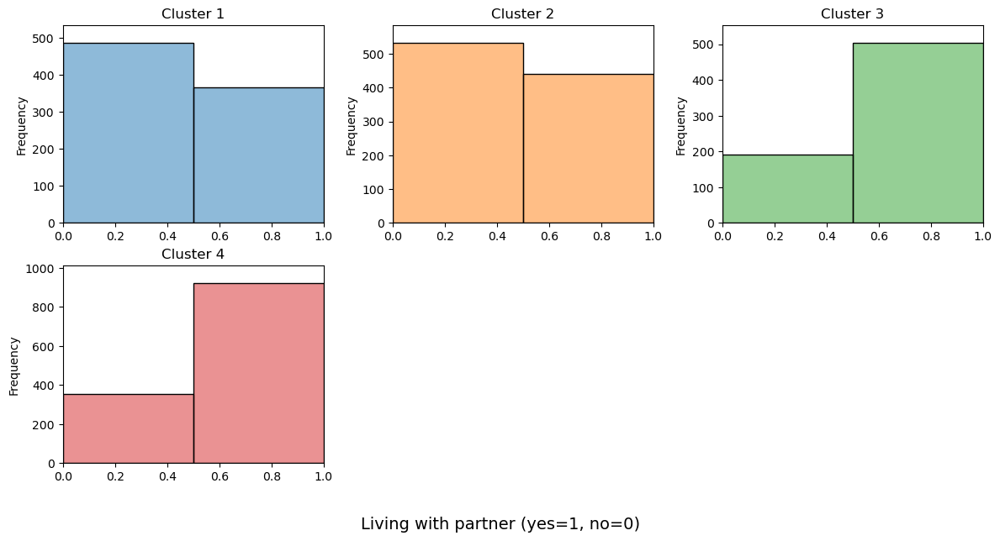

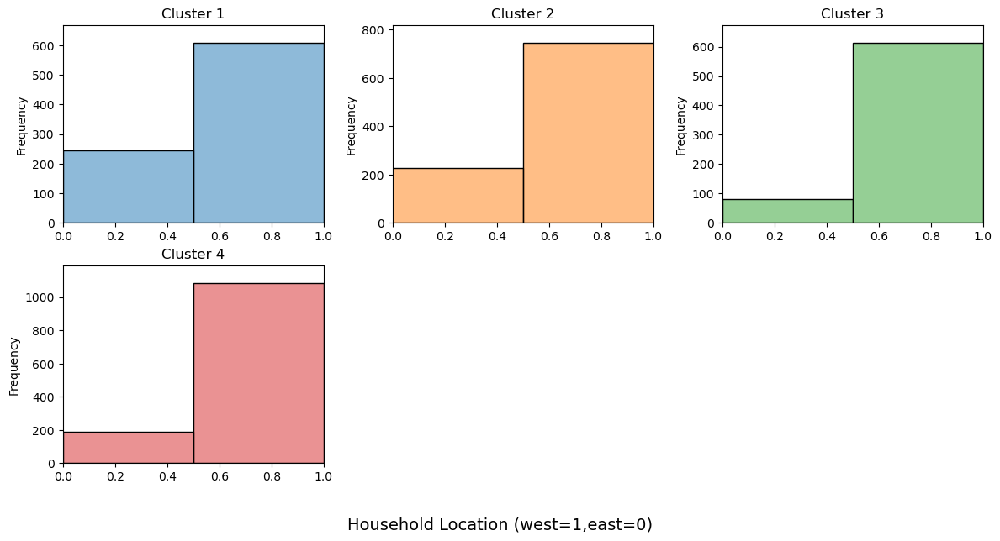

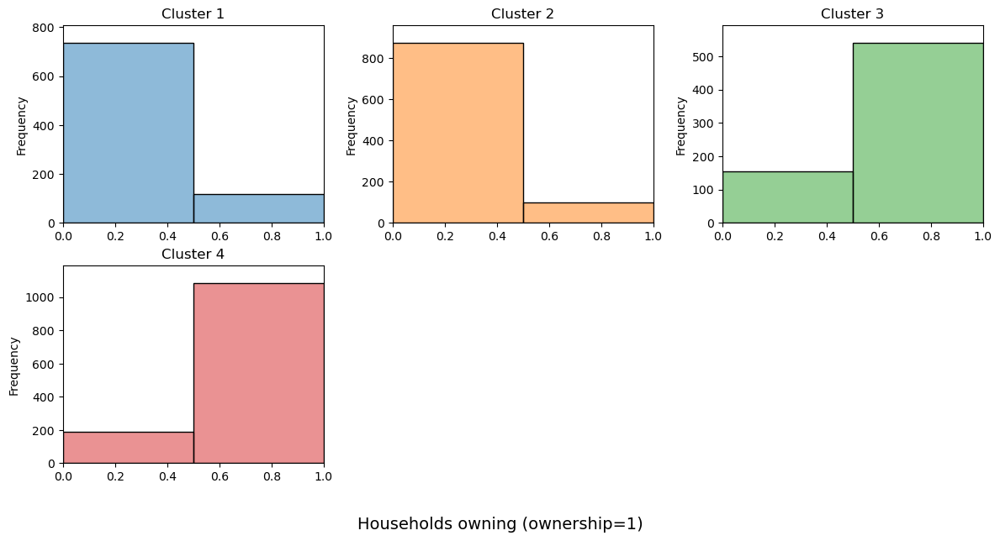

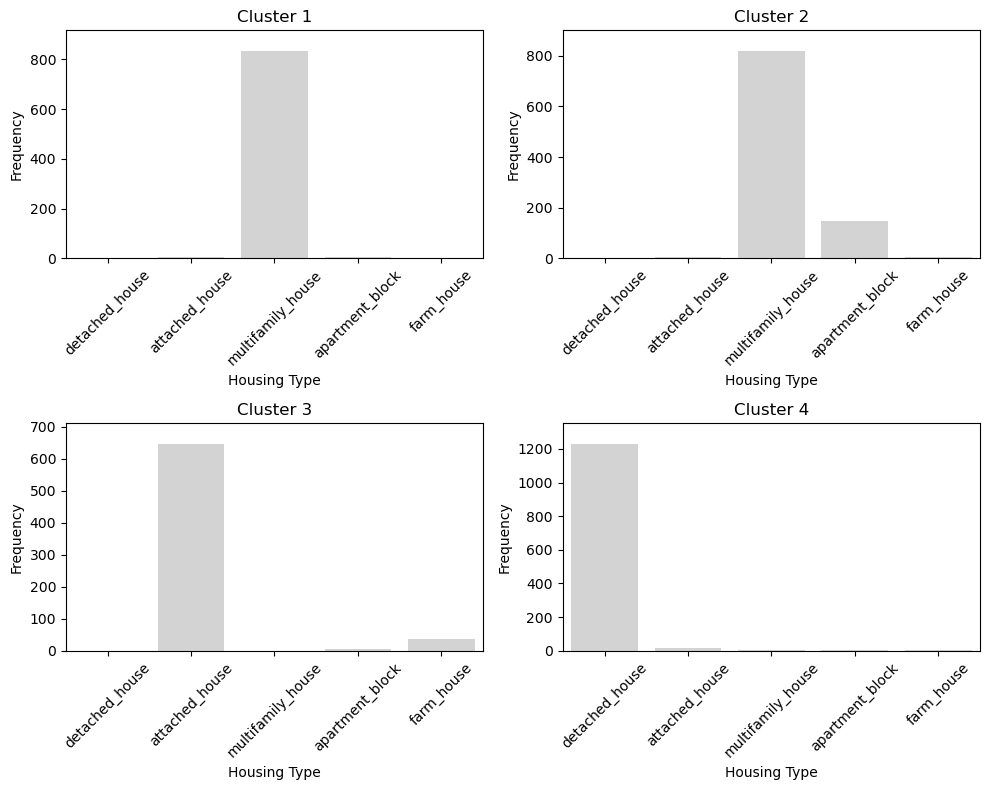

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

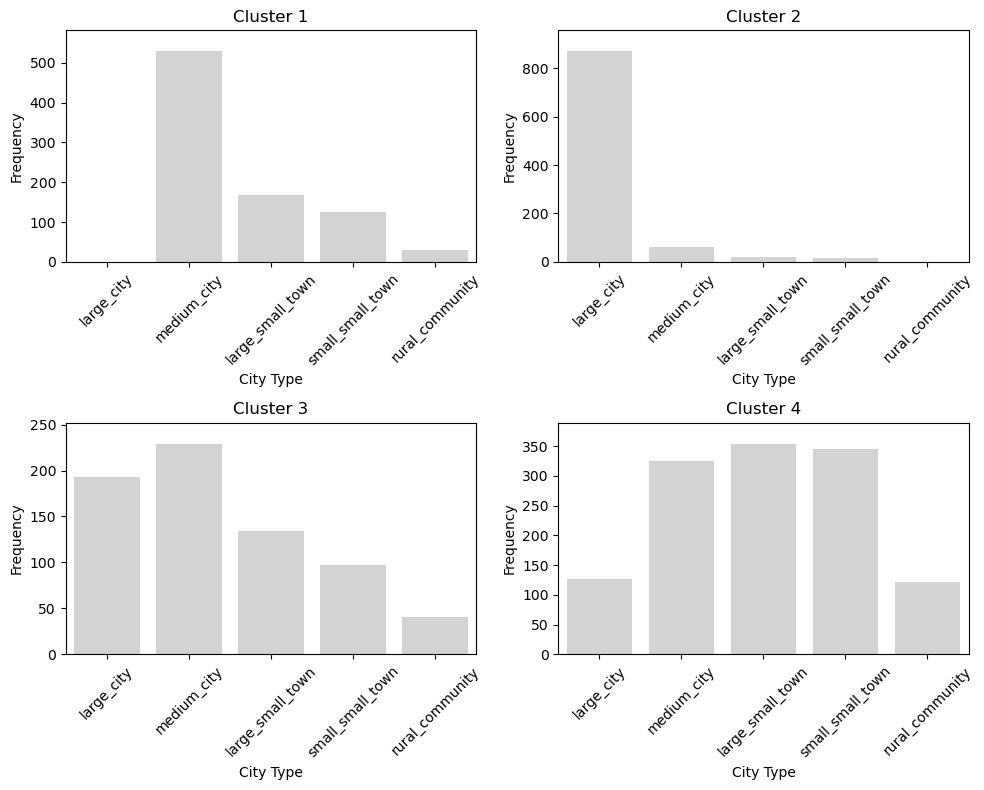

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

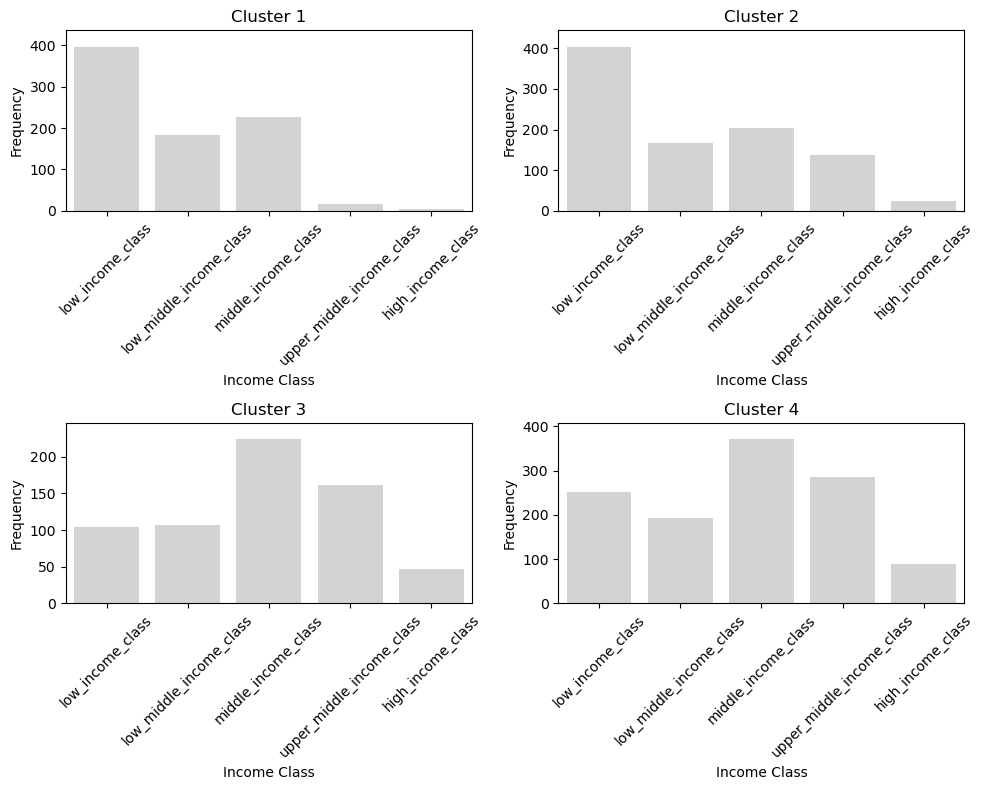

In [35]:
plotting_weighting(hier_cluster_weight5,"hier_distance30",5)

#### Weighting 10

In [36]:
#Applying weighting of 10
df_housing_stand_weight10=df_weighting_change(df_housing_stand,10)
#Creating Z linkage matrix
Z_w10=hierarch_clustering_allmergers(df_housing_stand_weight10,10)

Merger values of the last 10 agglomeration levels:
Level 1: 21.077352615044386
Level 2: 21.71118091016395
Level 3: 23.030203869044673
Level 4: 23.18922447401144
Level 5: 25.276351828386314
Level 6: 25.471605609016063
Level 7: 33.276895756645125
Level 8: 37.0349664674597
Level 9: 50.67676067594567
Level 10: 67.8260351641677


In [37]:
Z_w10=pd.DataFrame(Z_w10)
#creating within variance and difference matrix to find cutoff value
within_variance_weight10=pd.DataFrame(Z_w10.iloc[:,2])
within_variance_weight10.columns=["within_variance"]
within_variance_weight10["difference"]=within_variance_weight10['within_variance'].diff()

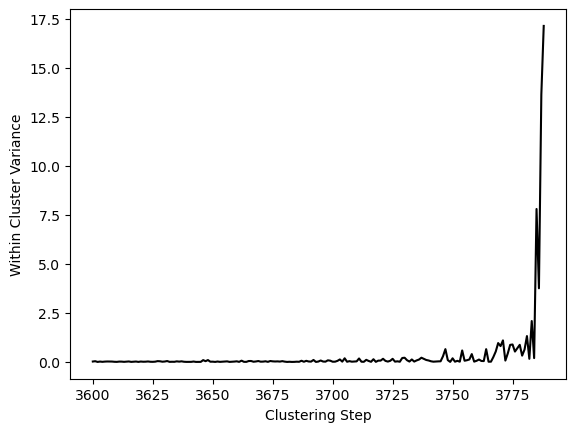

In [38]:
difference_plot(within_variance_weight10,3600,"weighting_10")

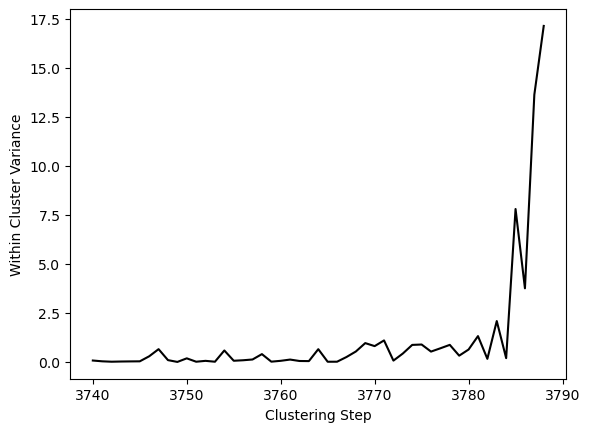

In [39]:
difference_plot(within_variance_weight10,3740,"weighting_10")

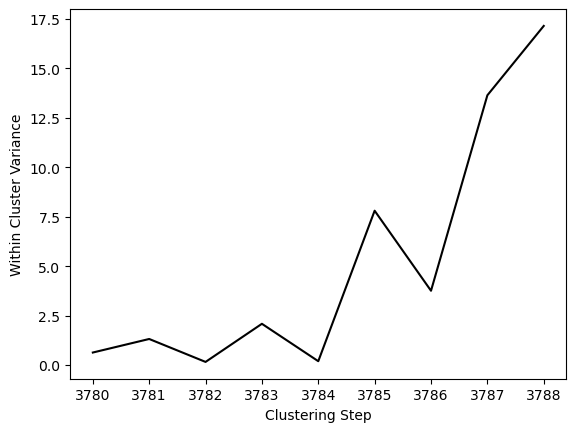

In [40]:
difference_plot(within_variance_weight10,3780,"weighting_10")

In [41]:
#Performing clustering with weighting of 10 and distance cutoff of 30
hier_cluster_weight10,hier_cluster_means_weight10=hier_clustering(Z_w10,df_housing,30)

##### plots

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. 

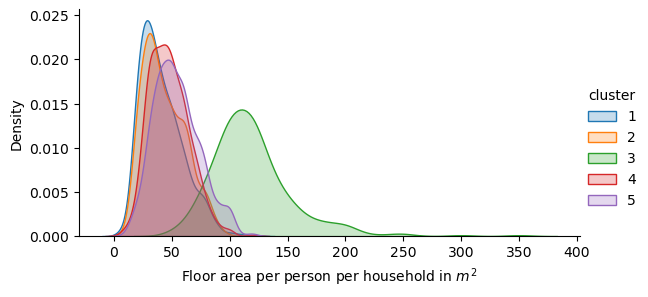

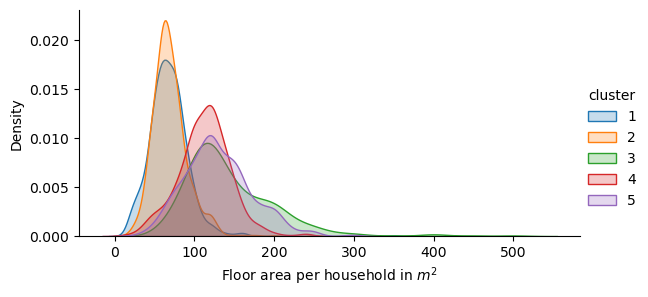

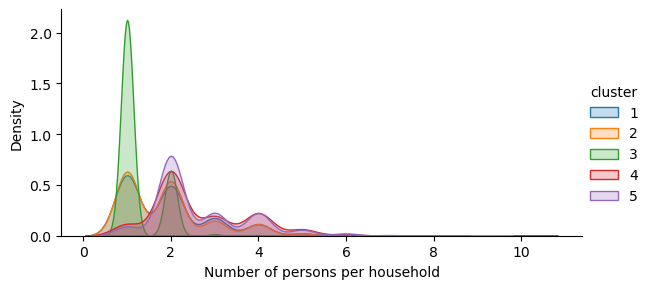

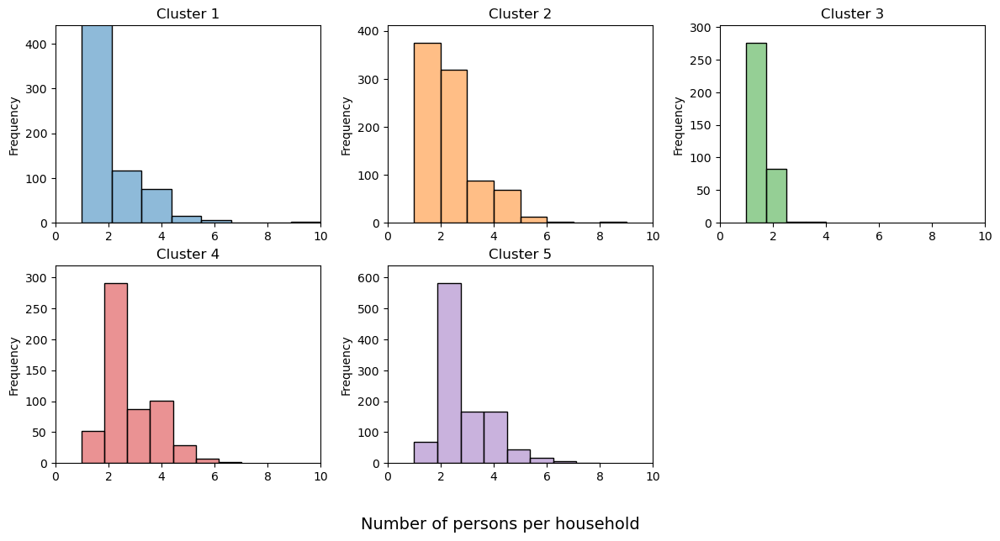

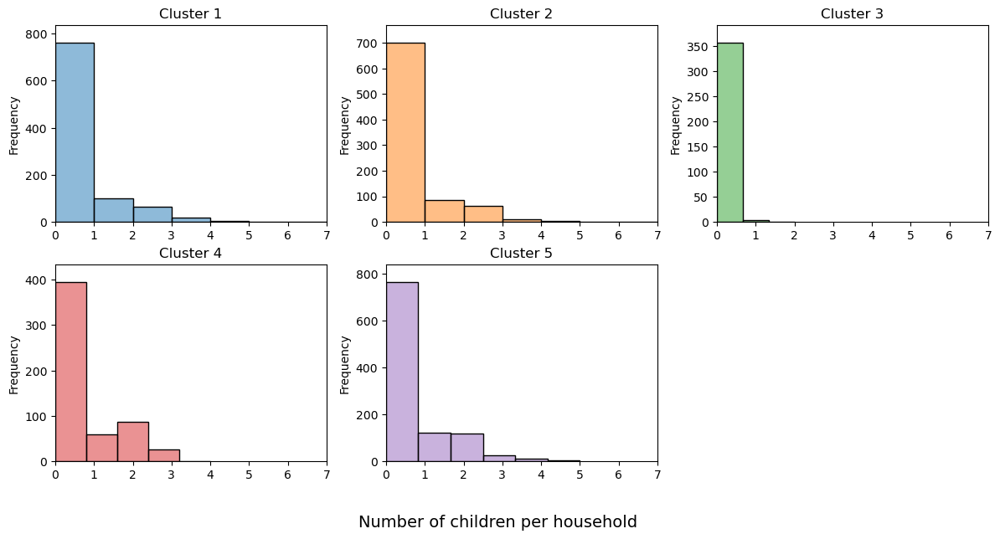

...

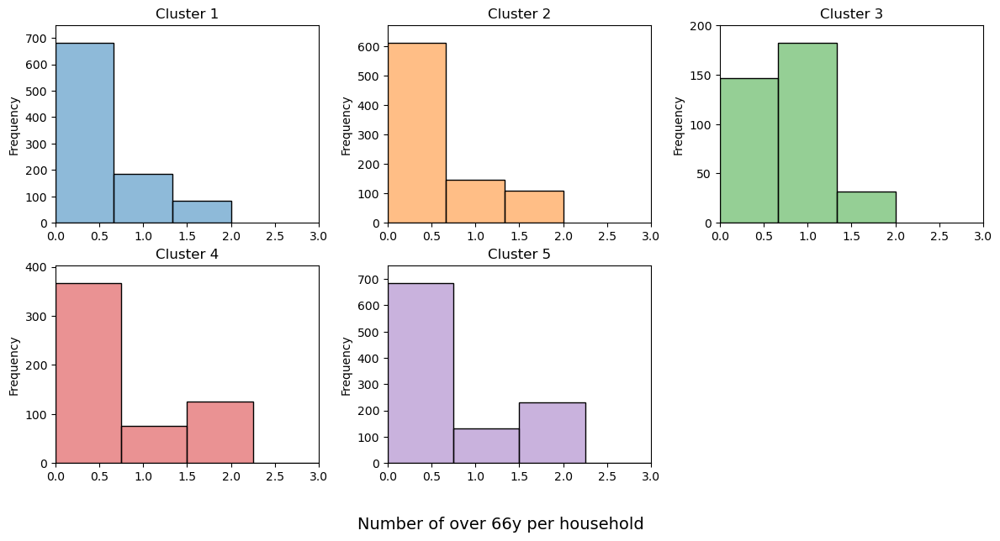

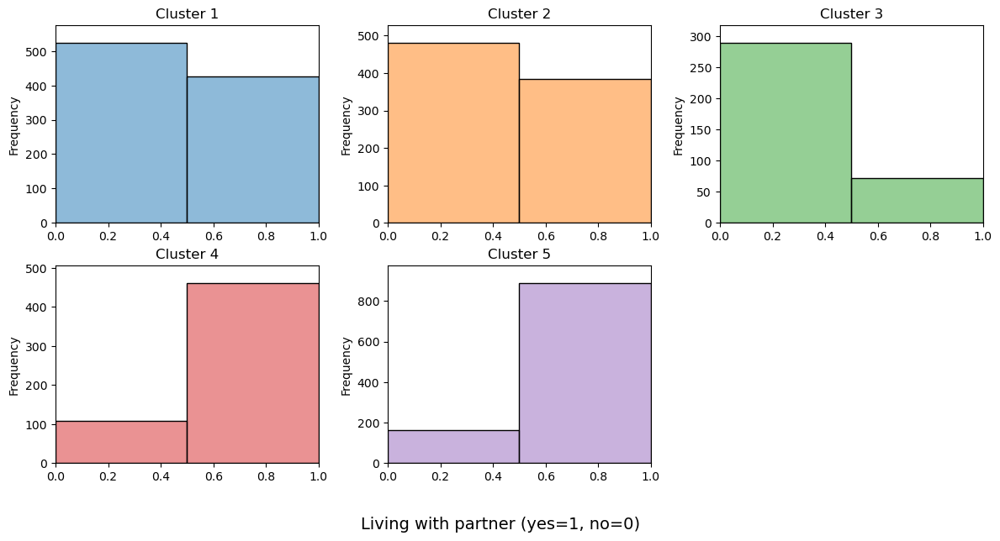

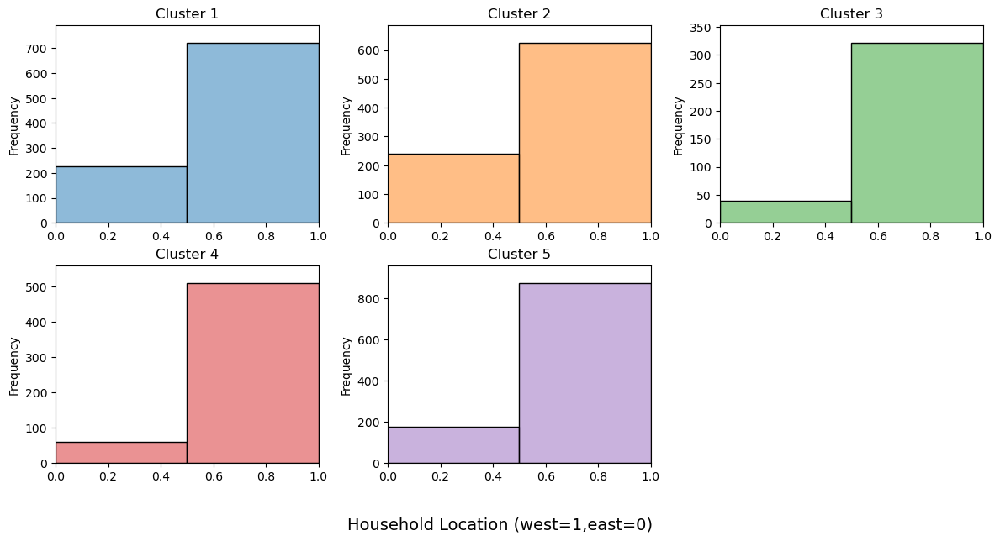

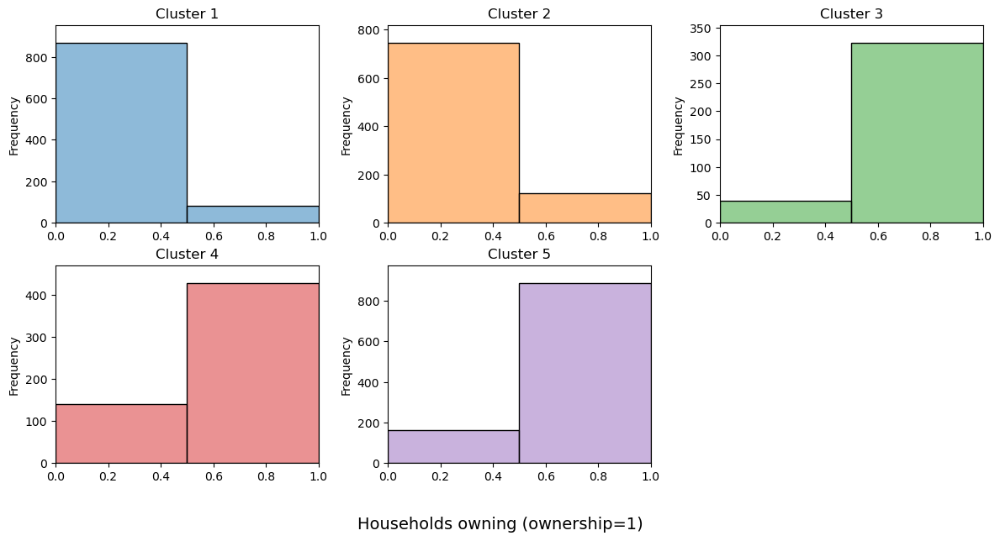

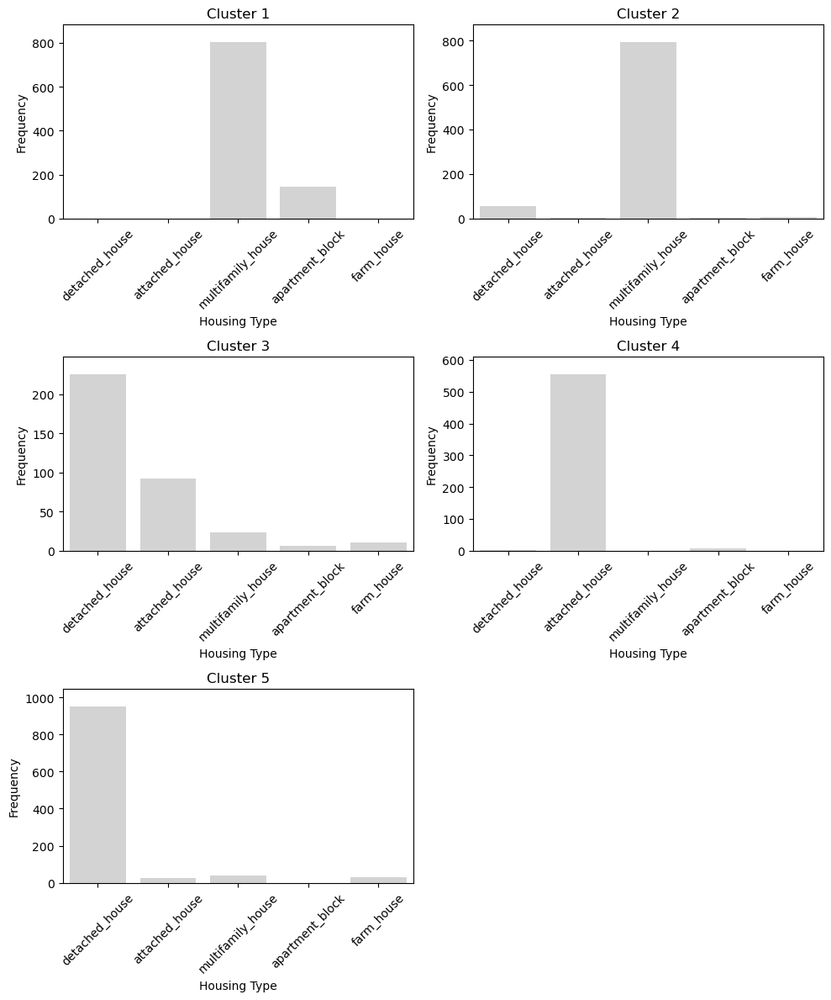

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

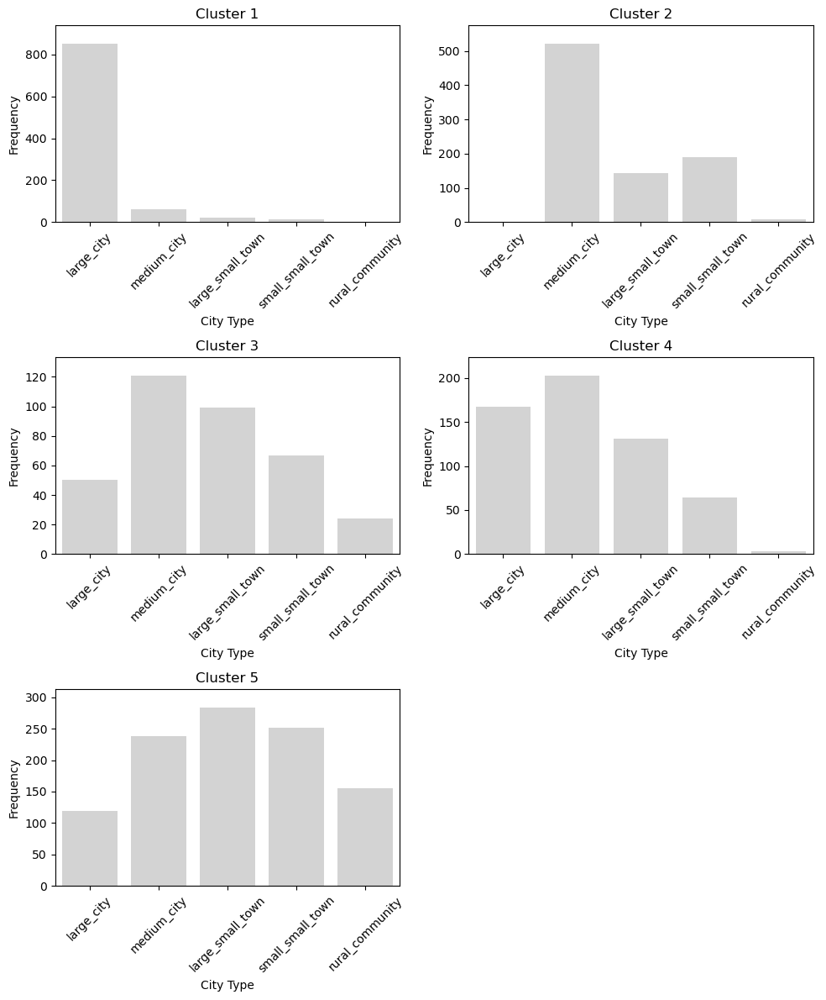

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

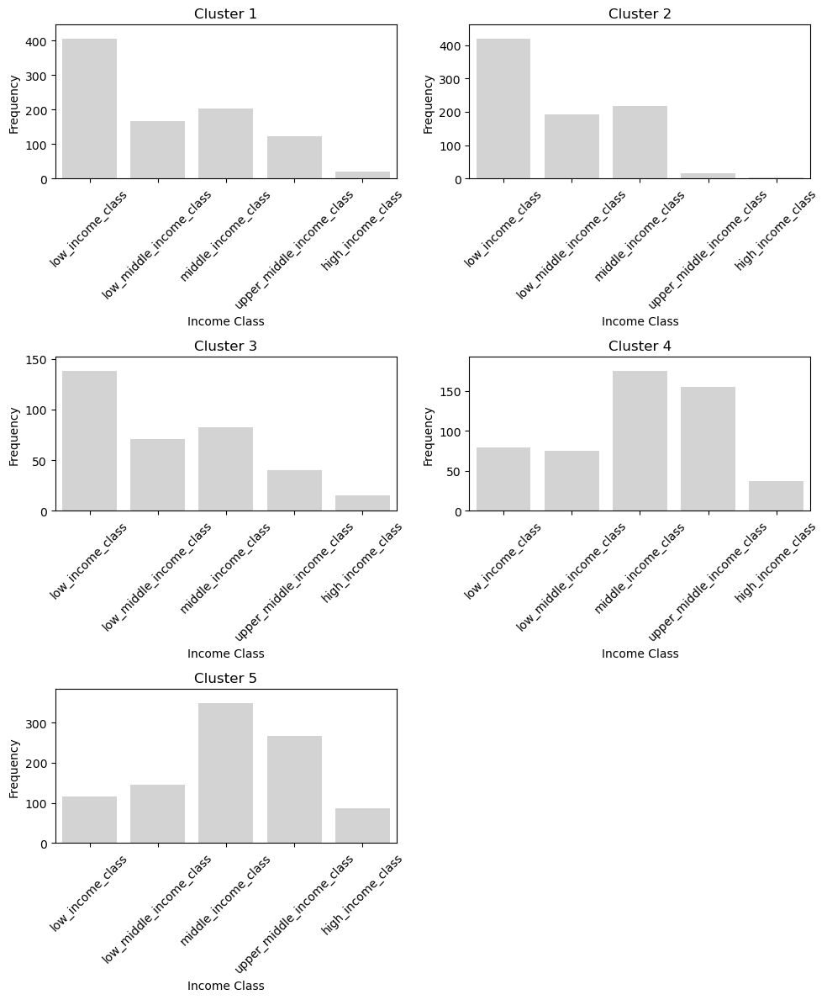

In [42]:
plotting_weighting(hier_cluster_weight10,"hier_distance30",10)

#### Weighting 15

In [43]:
#Applying weighting of 15
df_housing_stand_weight15=df_weighting_change(df_housing_stand,15)
Z_w15=hierarch_clustering_allmergers(df_housing_stand_weight15,15)

Merger values of the last 10 agglomeration levels:
Level 1: 21.880485938201552
Level 2: 22.443423498004368
Level 3: 24.45411306283708
Level 4: 25.602455394490743
Level 5: 33.18020358983386
Level 6: 33.61250277101605
Level 7: 35.234689054174666
Level 8: 39.717916322436224
Level 9: 60.4387067079317
Level 10: 85.2676761130229


In [44]:
Z_w15=pd.DataFrame(Z_w15)
#creating within variance and difference matrix to find cutoff value
within_variance_weight15=pd.DataFrame(Z_w15.iloc[:,2])
within_variance_weight15.columns=["within_variance"]
within_variance_weight15["difference"]=within_variance_weight15['within_variance'].diff()

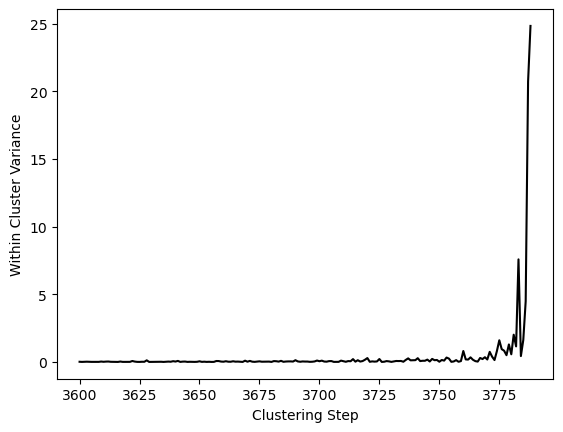

In [45]:
difference_plot(within_variance_weight15,3600,"weighting_15")

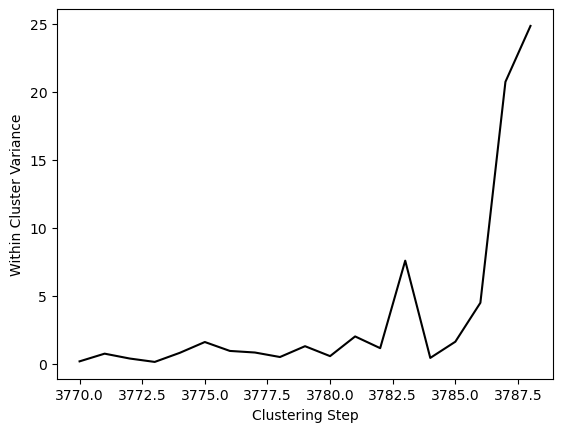

In [46]:
difference_plot(within_variance_weight15,3770,"weighting_15")

In [47]:
#Performing clustering with weighting of 15 and distance cutoff of 34
hier_cluster_weight15,hier_cluster_means_weight15=hier_clustering(Z_w15,df_housing,34)

##### plots

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. 

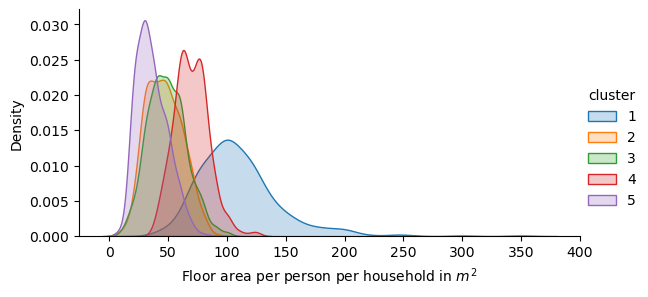

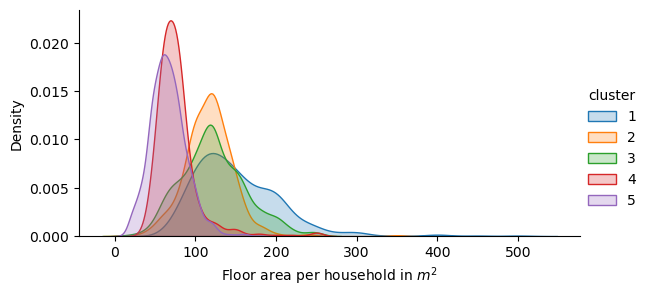

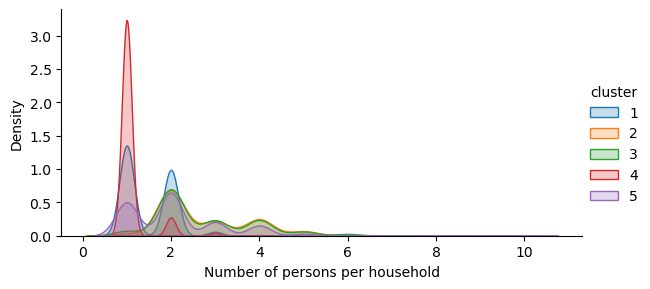

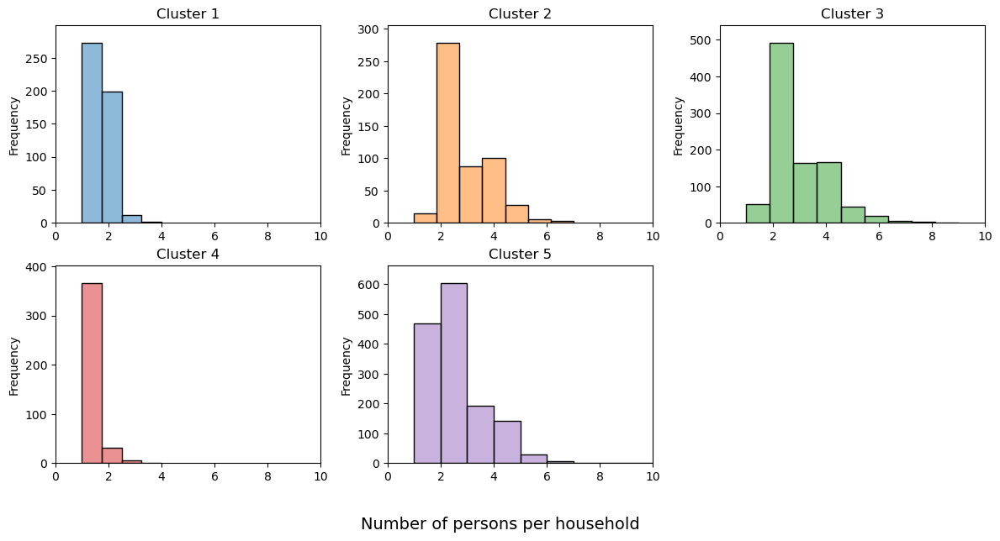

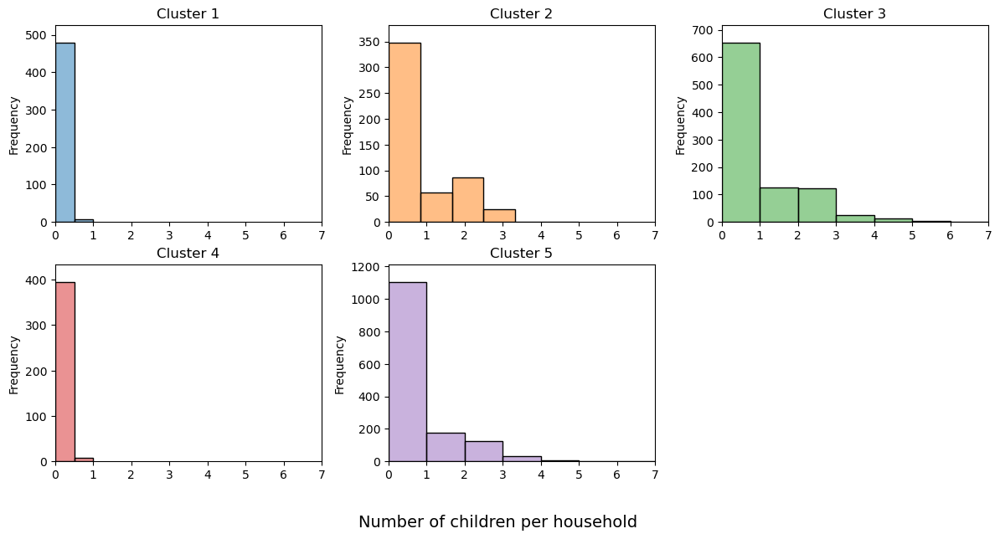

...

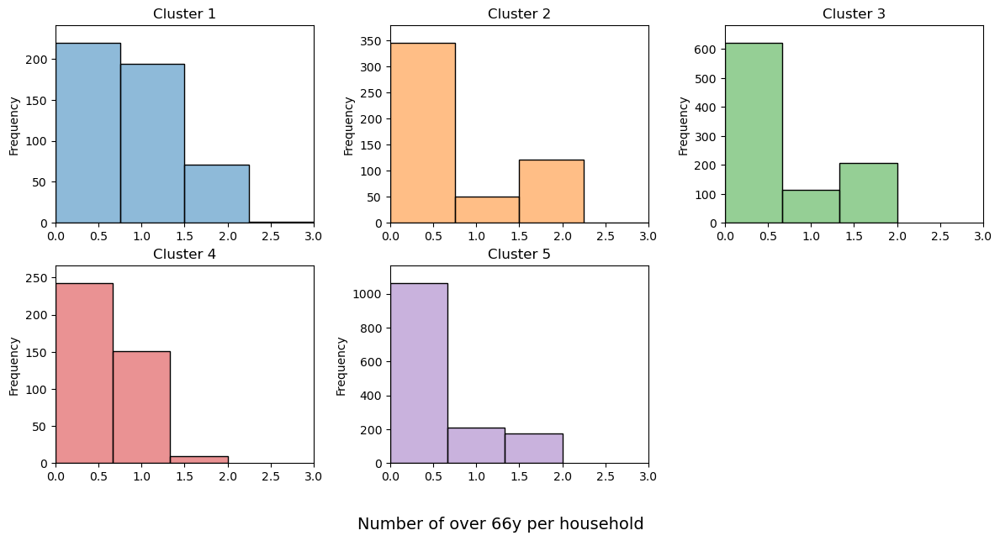

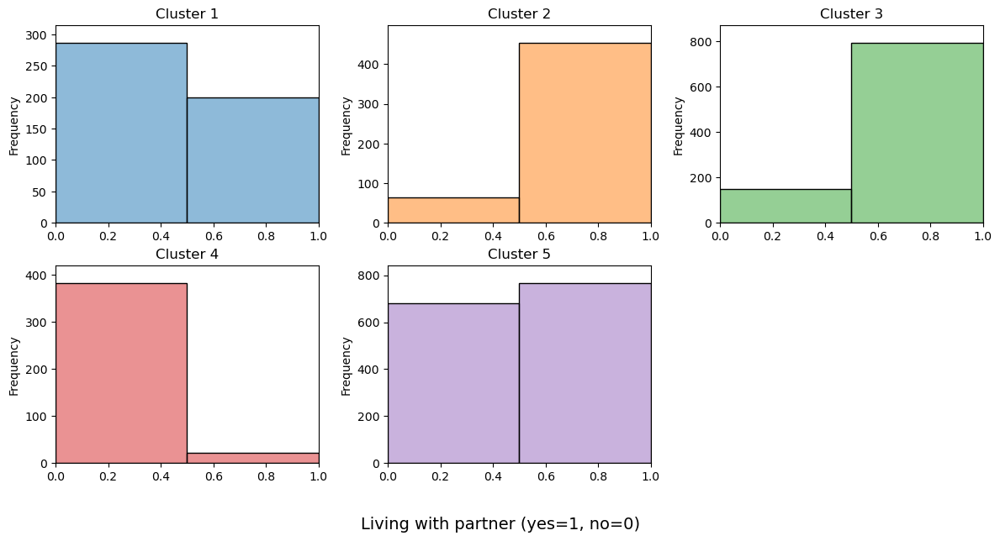

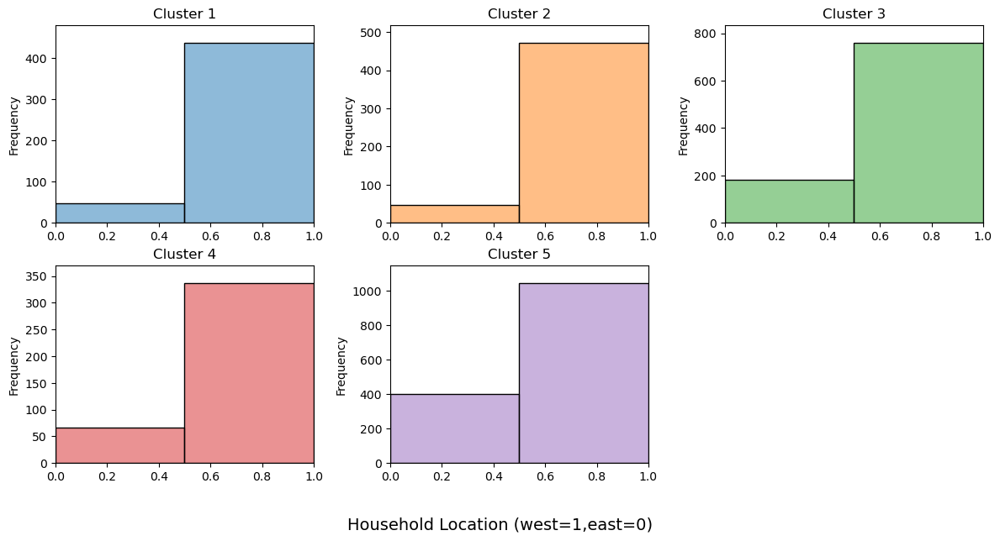

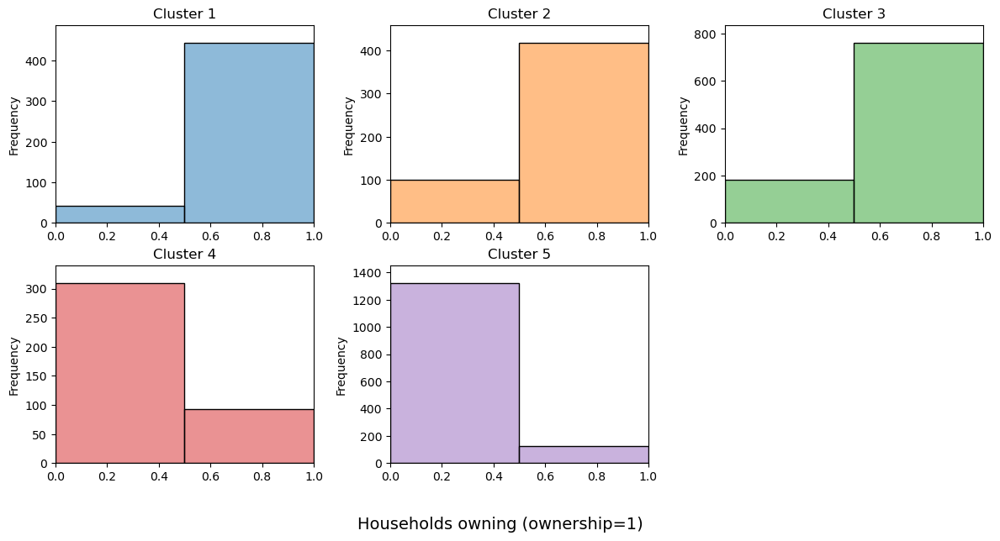

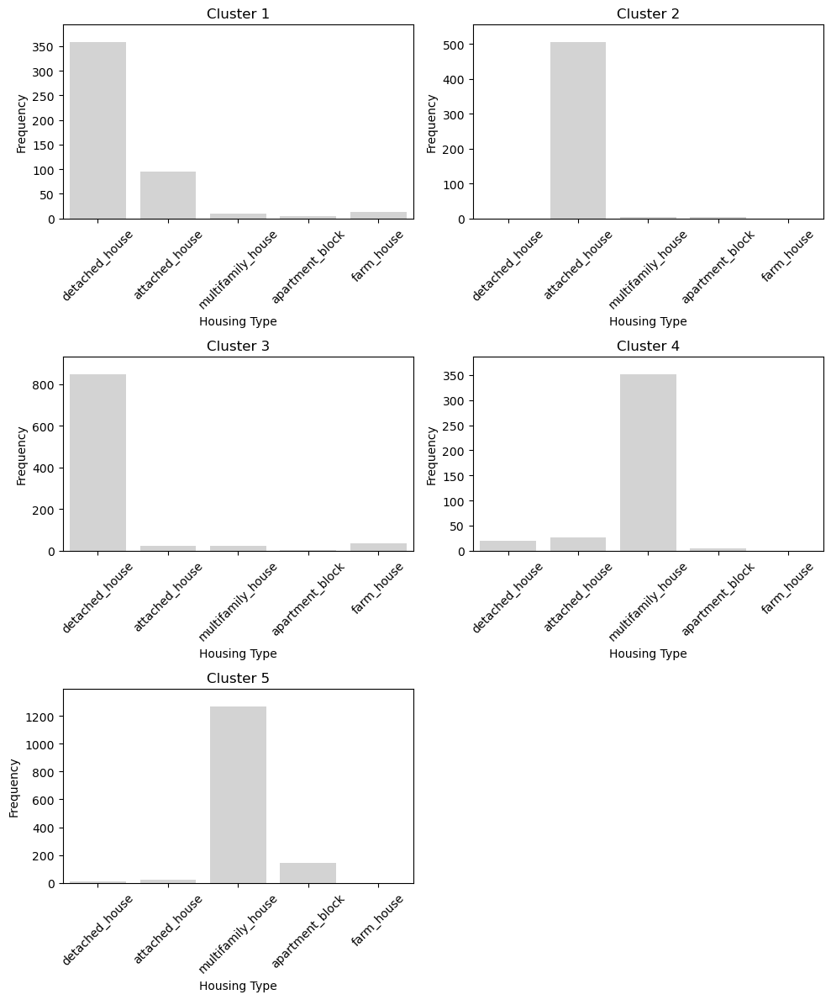

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

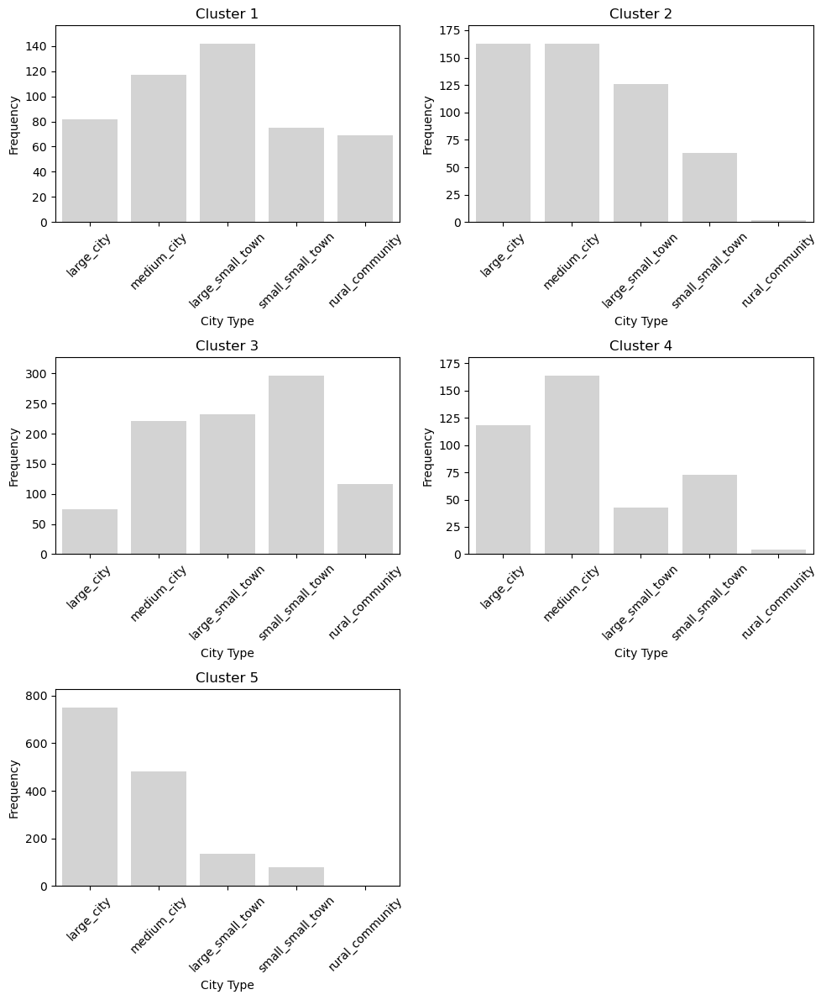

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

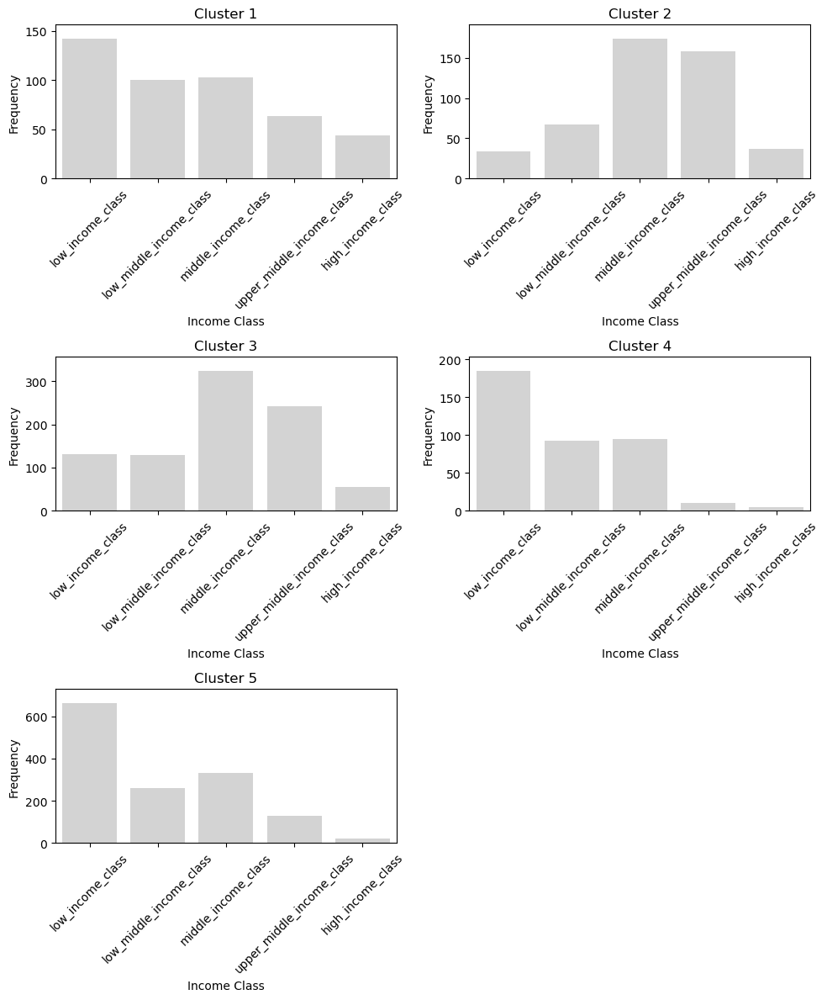

In [48]:
plotting_weighting(hier_cluster_weight15,"hier_distance34",15)

#### Weighting 20

In [49]:
#Applying weighting of 20
df_housing_stand_weight20=df_weighting_change(df_housing_stand,20)
#Creating Z linkage matrix
Z_w20=hierarch_clustering_allmergers(df_housing_stand_weight20,20)
Z_w20=pd.DataFrame(Z_w20)
#creating within variance and difference matrix to find cutoff value
within_variance_weight20=pd.DataFrame(Z_w20.iloc[:,2])
within_variance_weight20.columns=["within_variance"]
within_variance_weight20["difference"]=within_variance_weight20['within_variance'].diff()

Merger values of the last 10 agglomeration levels:
Level 1: 21.713535892458324
Level 2: 22.124828235818786
Level 3: 24.760486967228356
Level 4: 28.268249486915156
Level 5: 30.43179031977487
Level 6: 33.26383440145028
Level 7: 40.81882802023916
Level 8: 56.41497160034573
Level 9: 65.39395491819819
Level 10: 112.32306095397206


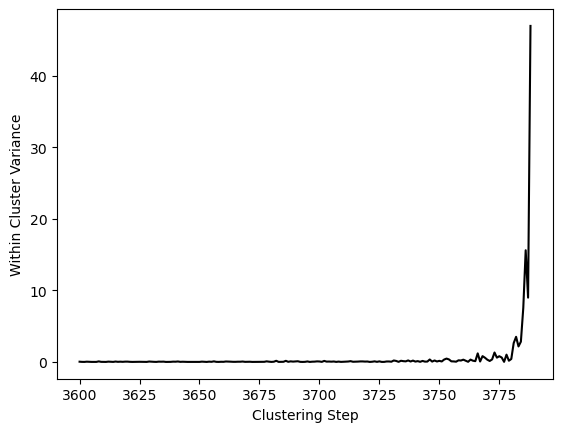

In [50]:
difference_plot(within_variance_weight20,3600,"weighting_20")

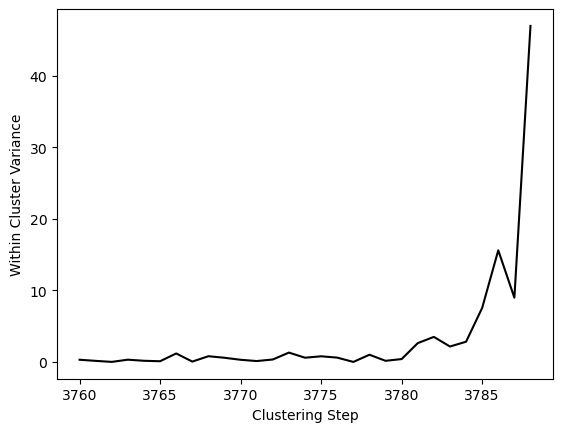

In [51]:
difference_plot(within_variance_weight20,3760,"weighting_20")

In [52]:
within_variance_weight20.iloc[-10:,:]

,within_variance,difference
3779,21.713536,0.165325
3780,22.124828,0.411292
3781,24.760487,2.635659
3782,28.268249,3.507763
3783,30.431790,2.163541
3784,33.263834,2.832044
3785,40.818828,7.554994
3786,56.414972,15.596144
3787,65.393955,8.978983
3788,112.323061,46.929106


In [53]:
#Performing clustering with weighting of 20 and distance cutoff of 30
hier_cluster_weight20,hier_cluster_means_weight20=hier_clustering(Z_w20,df_housing,30)

##### plots

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. 

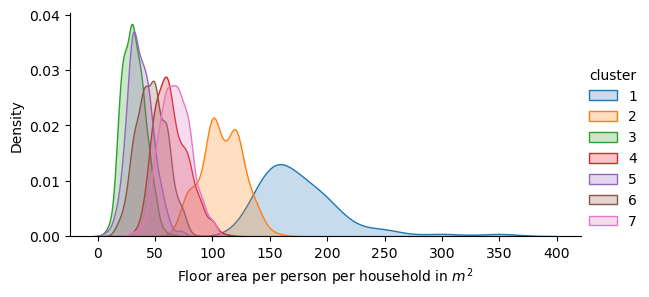

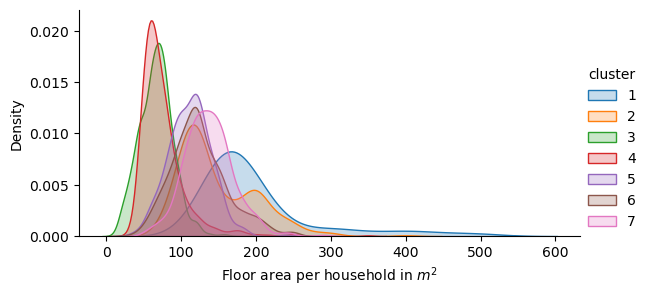

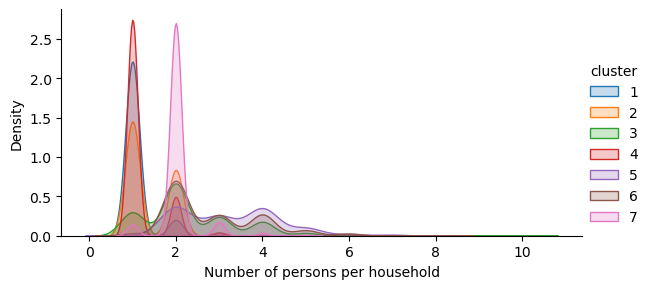

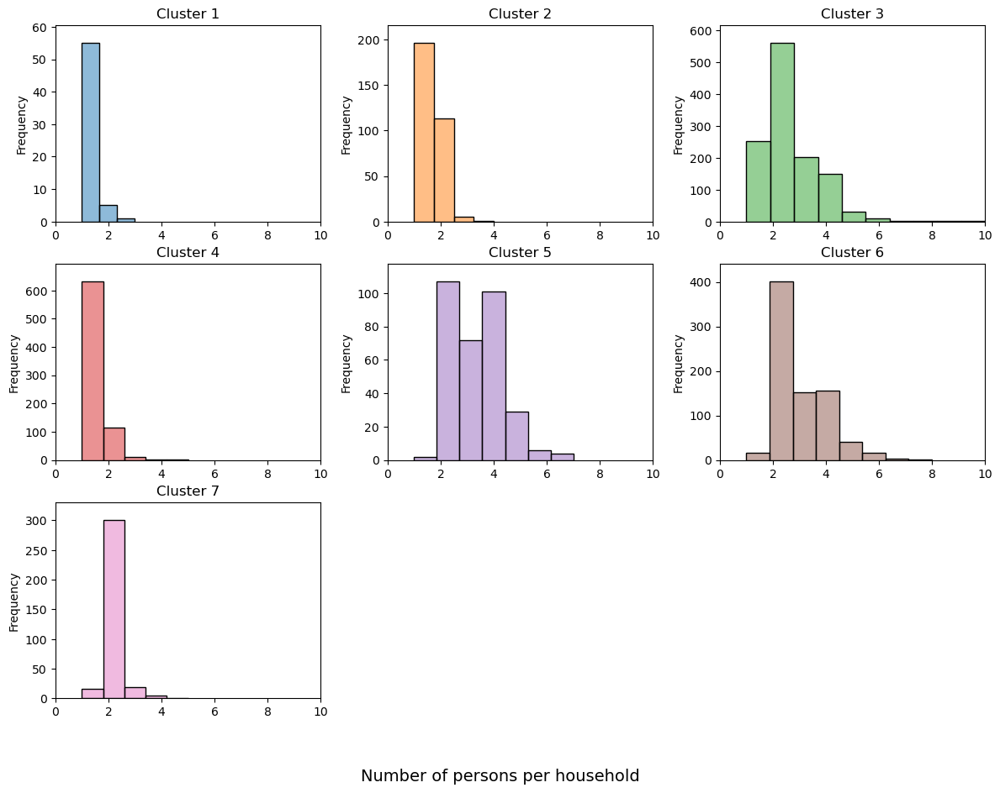

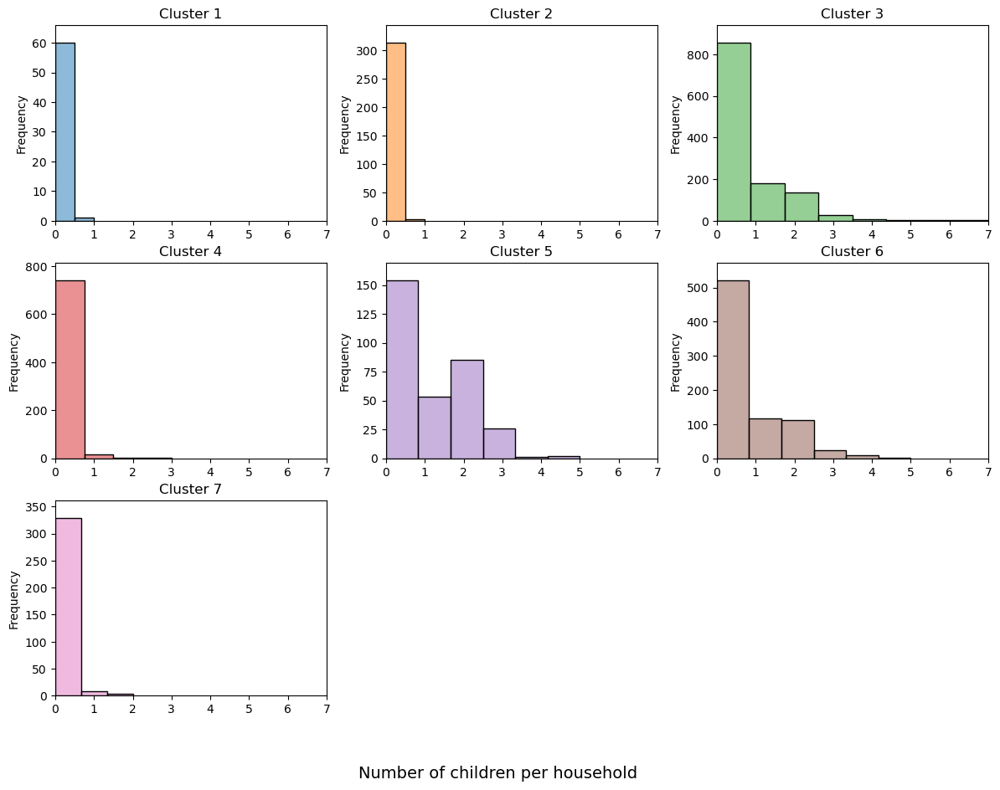

...

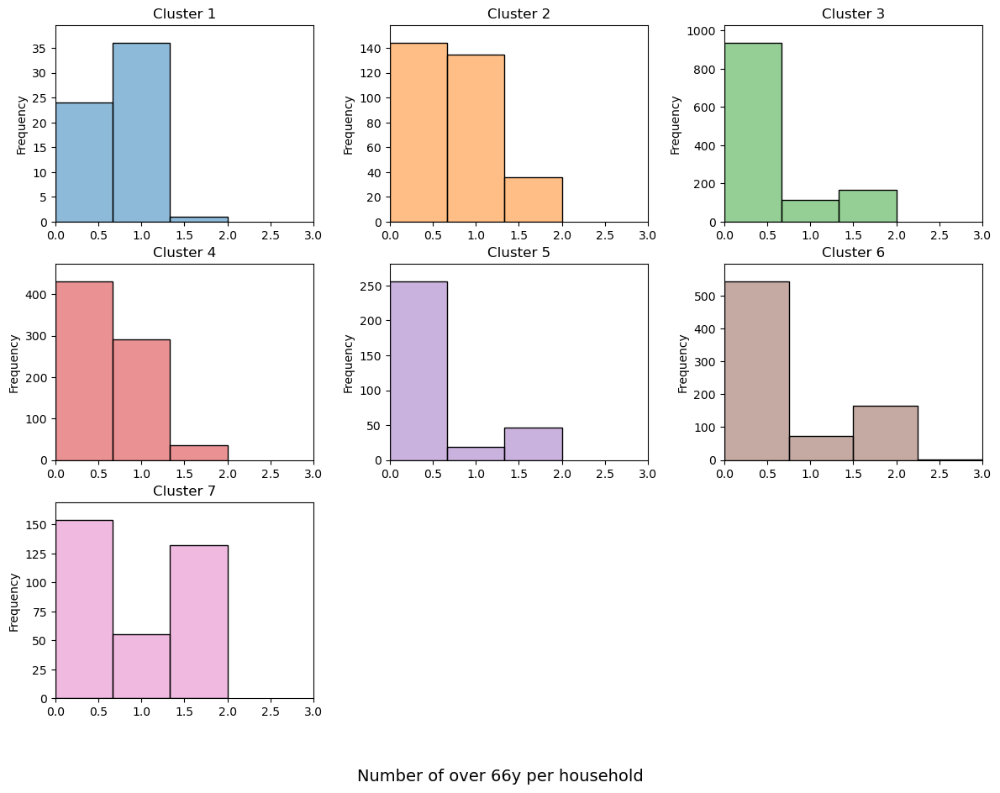

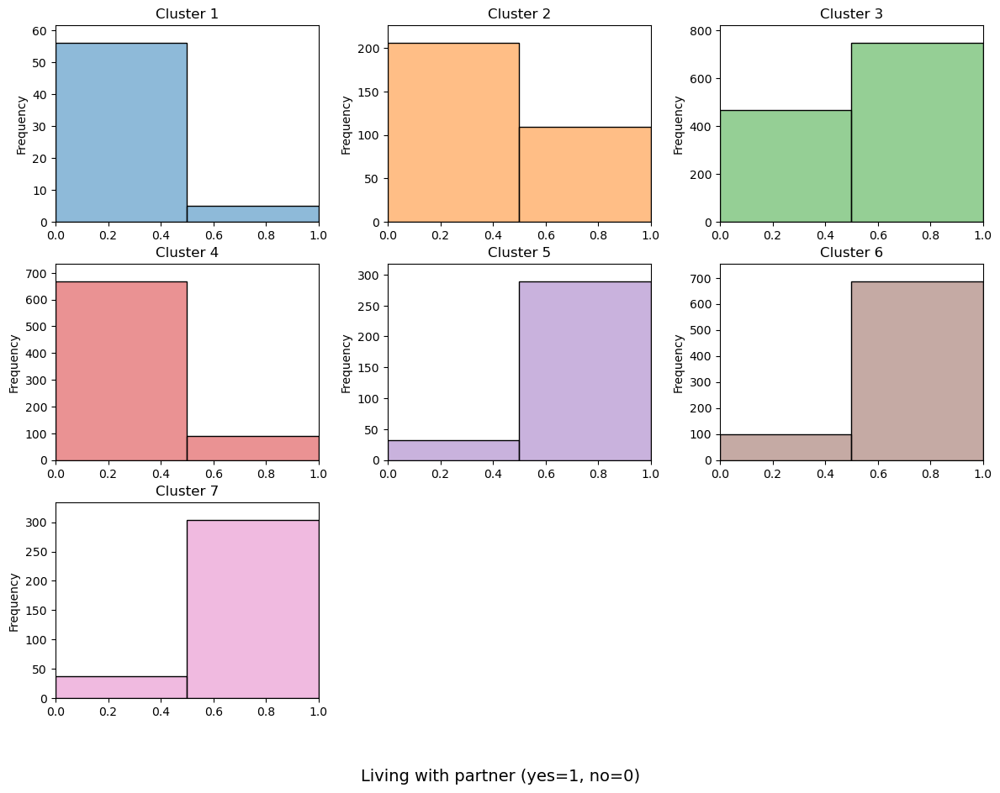

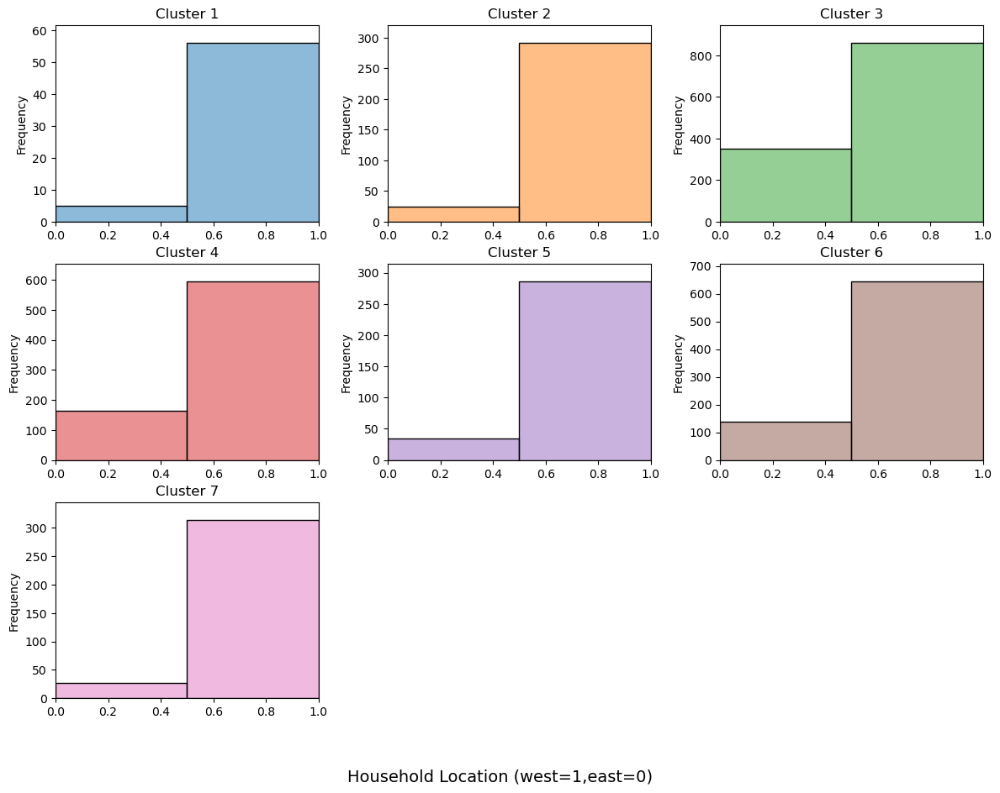

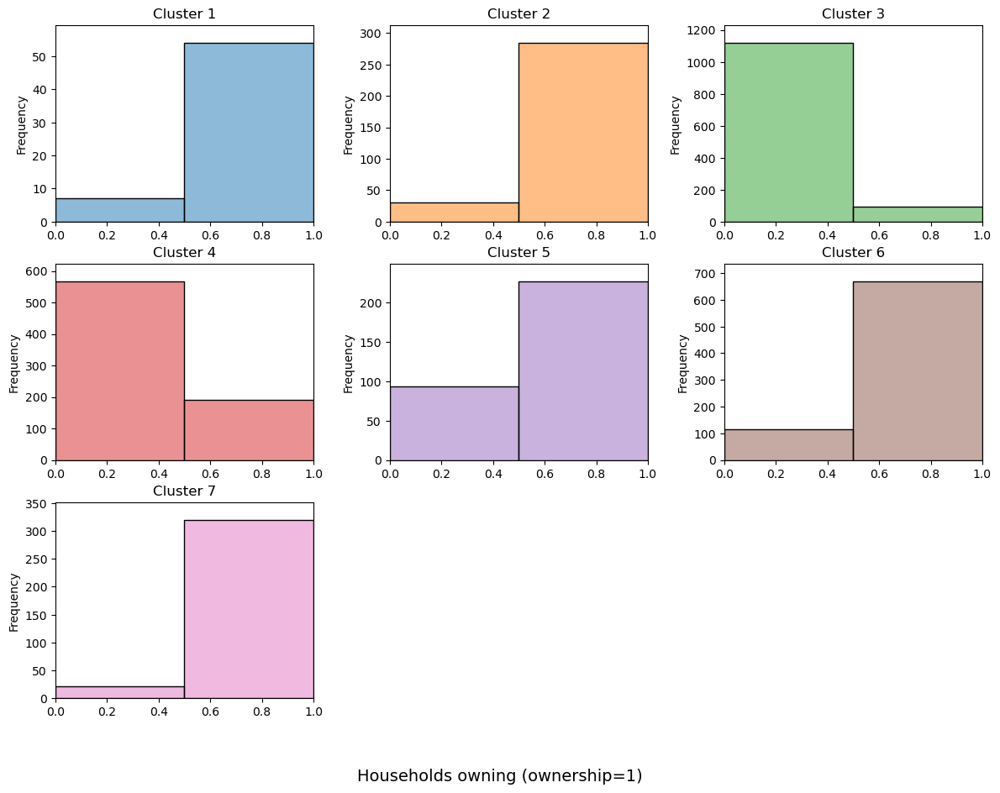

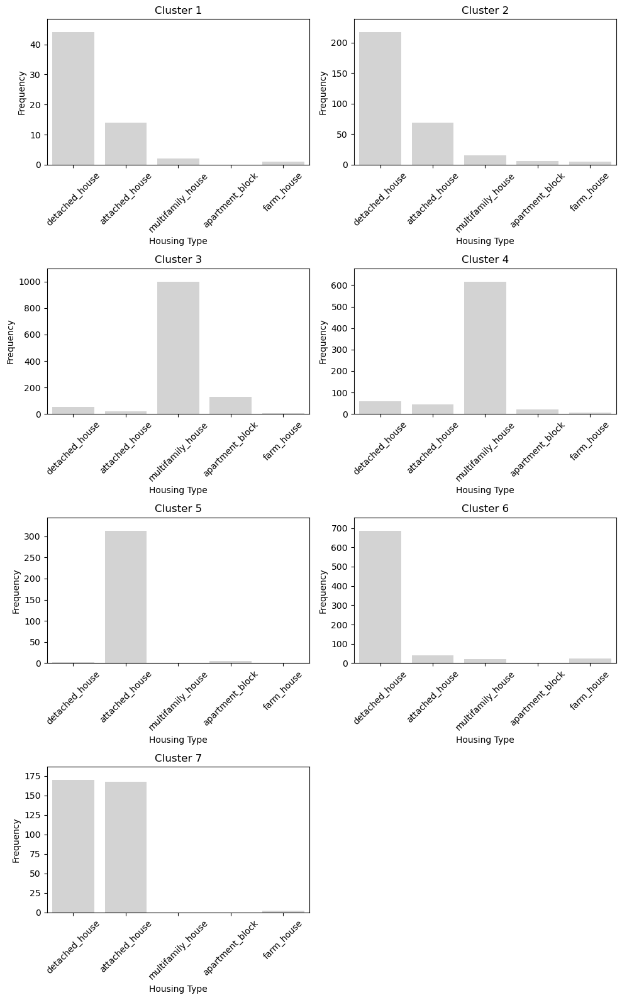

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

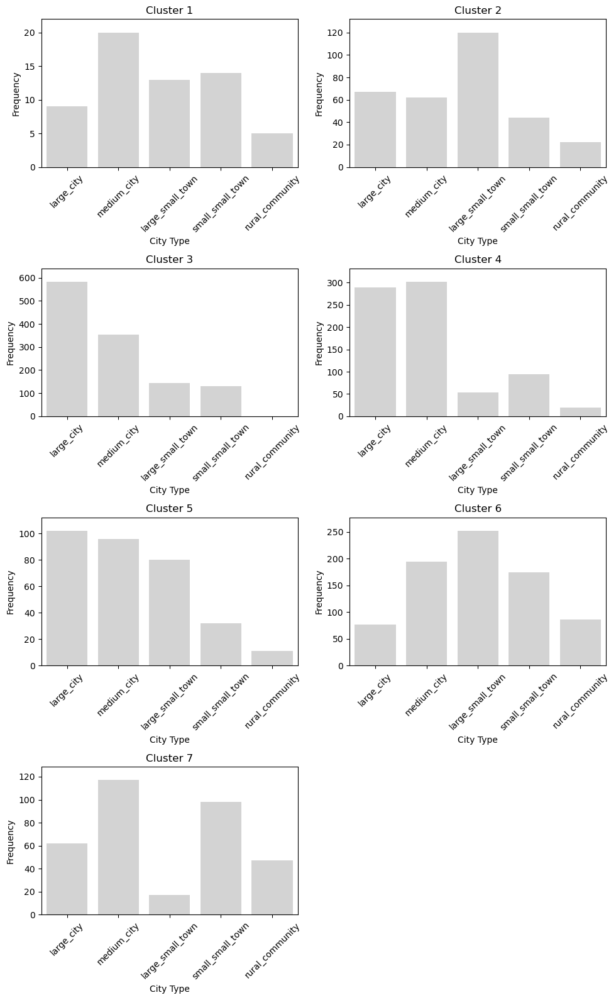

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

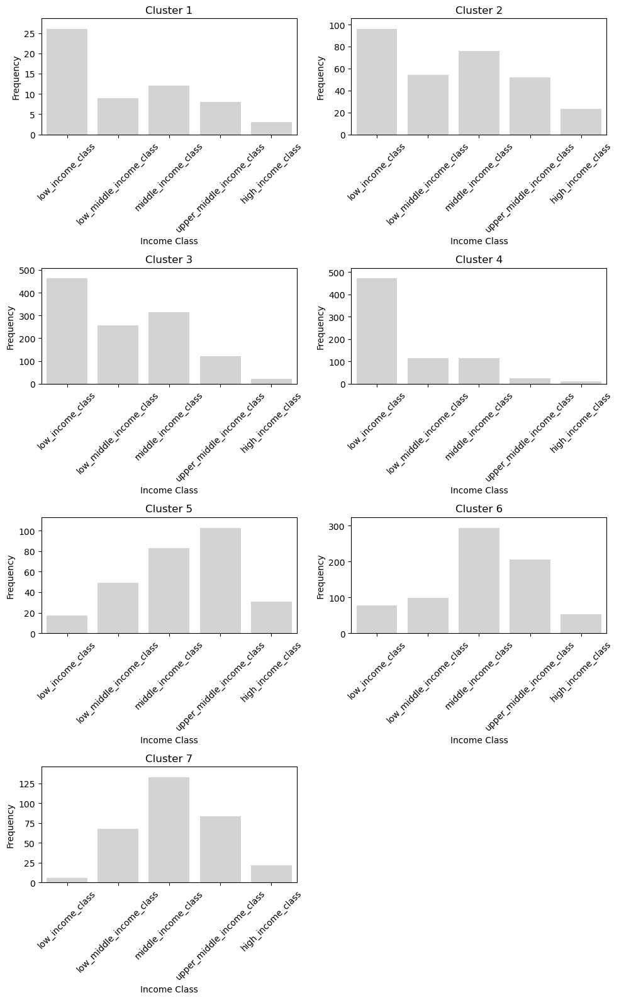

In [54]:
plotting_weighting(hier_cluster_weight20,"hier_distance30",20)

#### Weighting 25

Merger values of the last 10 agglomeration levels:
Level 1: 25.472873762141884
Level 2: 25.996065354386392
Level 3: 27.54558437203076
Level 4: 29.47589141852881
Level 5: 29.53562625474439
Level 6: 45.76041952086469
Level 7: 51.16733701810136
Level 8: 55.070339438923305
Level 9: 76.30127380988114
Level 10: 143.6659370316261


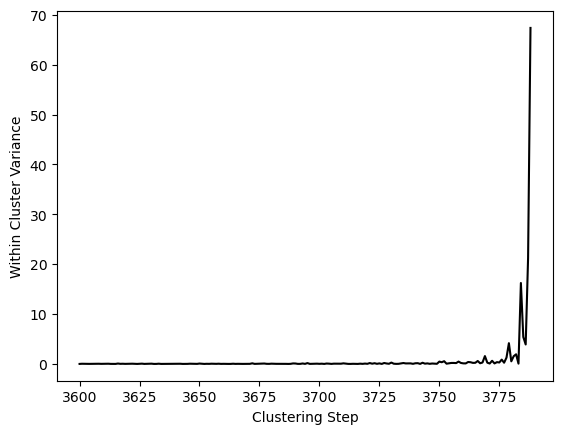

In [55]:
#Applying weighting of 25
df_housing_stand_weight25=df_weighting_change(df_housing_stand,25)
#Creating Z linkage matrix
Z_w25=hierarch_clustering_allmergers(df_housing_stand_weight25,25)
Z_w25=pd.DataFrame(Z_w25)
#creating within variance and difference matrix to find cutoff value
within_variance_weight25=pd.DataFrame(Z_w25.iloc[:,2])
within_variance_weight25.columns=["within_variance"]
within_variance_weight25["difference"]=within_variance_weight25['within_variance'].diff()
difference_plot(within_variance_weight25,3600,"weighting_25")

In [56]:
within_variance_weight25.iloc[-15:,:]

,within_variance,difference
3774,18.650426,0.356731
3775,18.939972,0.289546
3776,19.805424,0.865453
3777,20.047803,0.242379
3778,21.313693,1.265890
3779,25.472874,4.159181
3780,25.996065,0.523192
3781,27.545584,1.549519
3782,29.475891,1.930307
3783,29.535626,0.059735


In [57]:
#Performing clustering with weighting of 25 and distance cutoff of 30
hier_cluster_weight25,hier_cluster_means_weight25=hier_clustering(Z_w25,df_housing,30)

##### plots

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. 

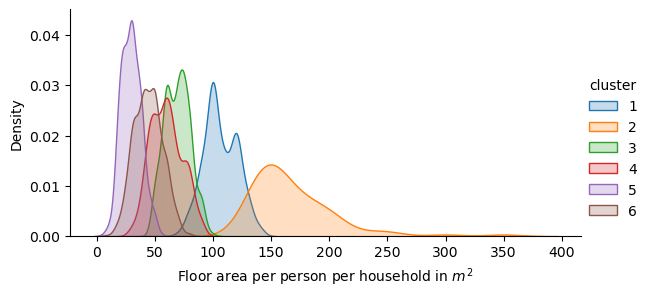

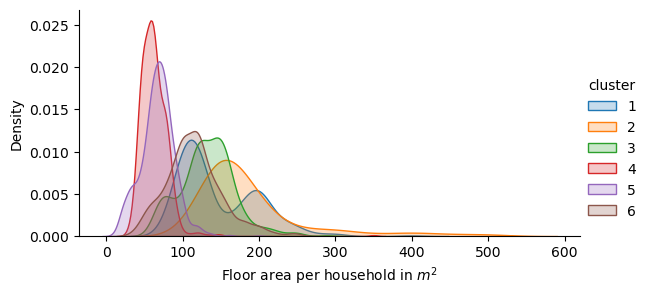

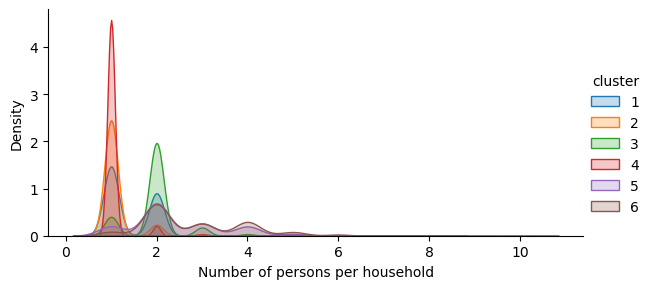

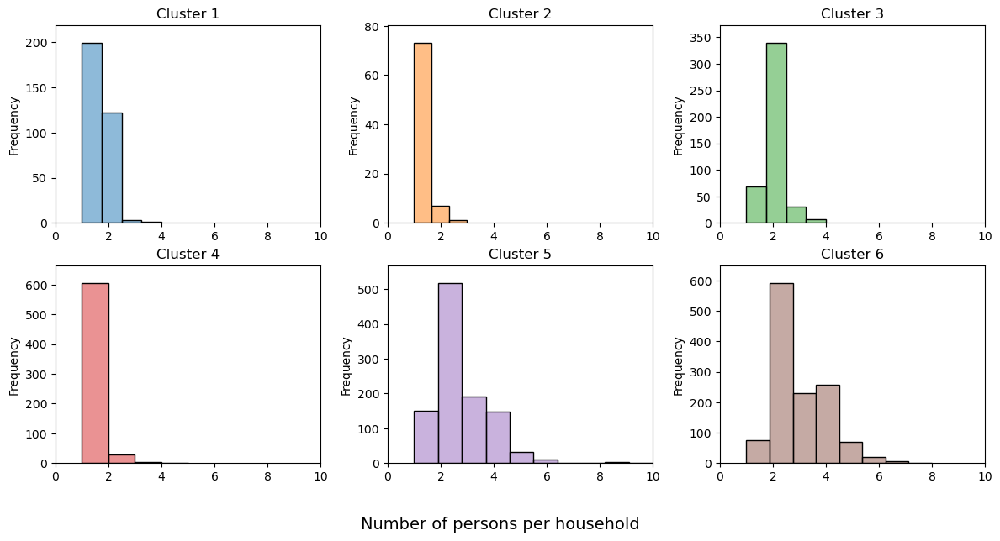

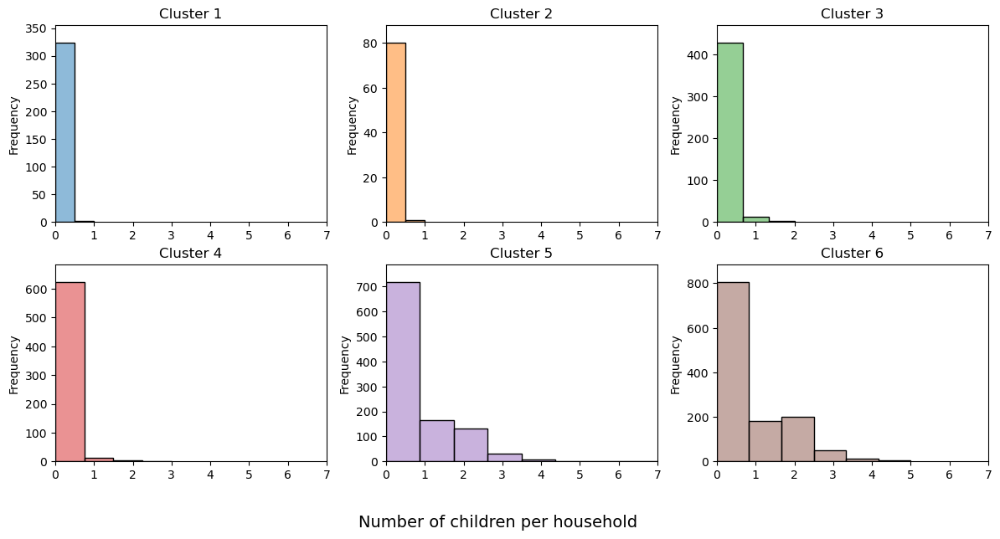

...

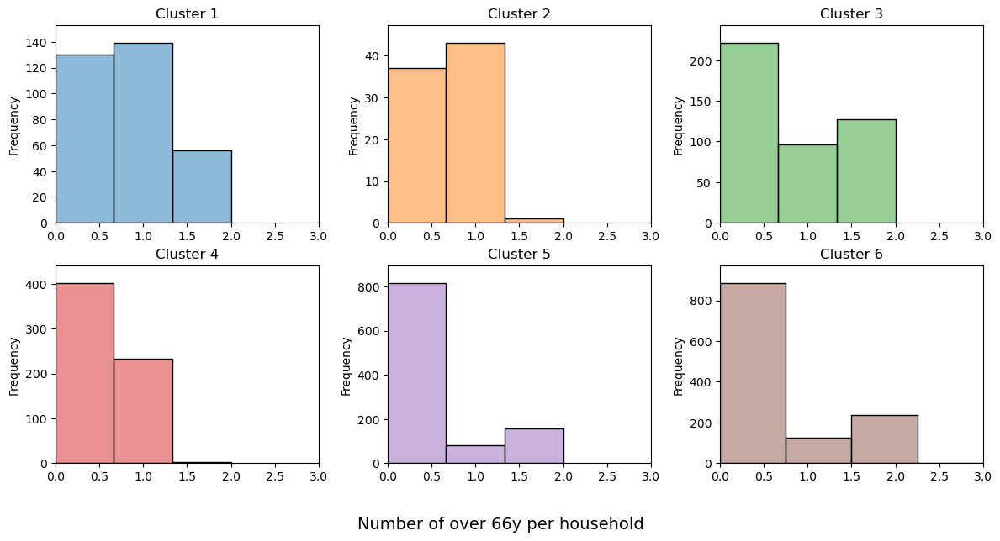

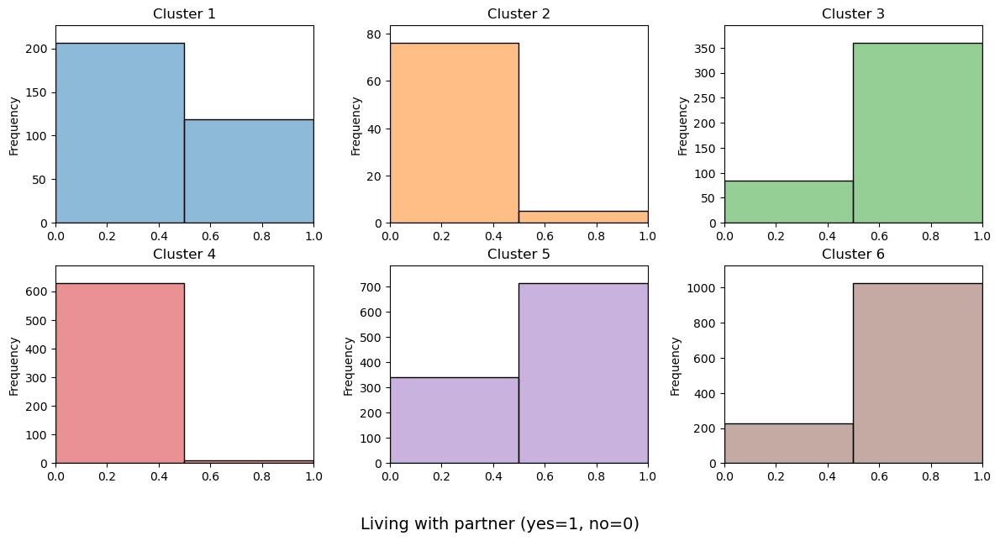

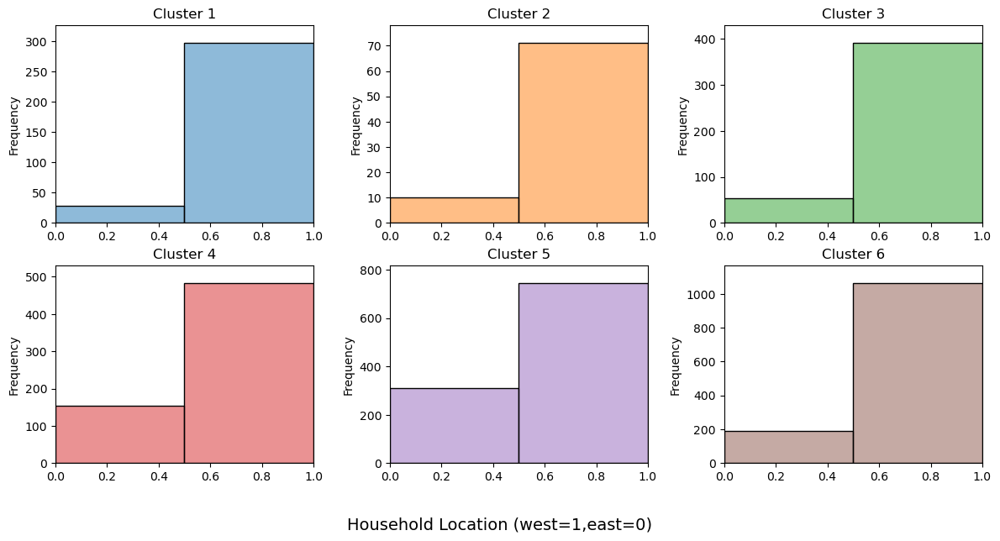

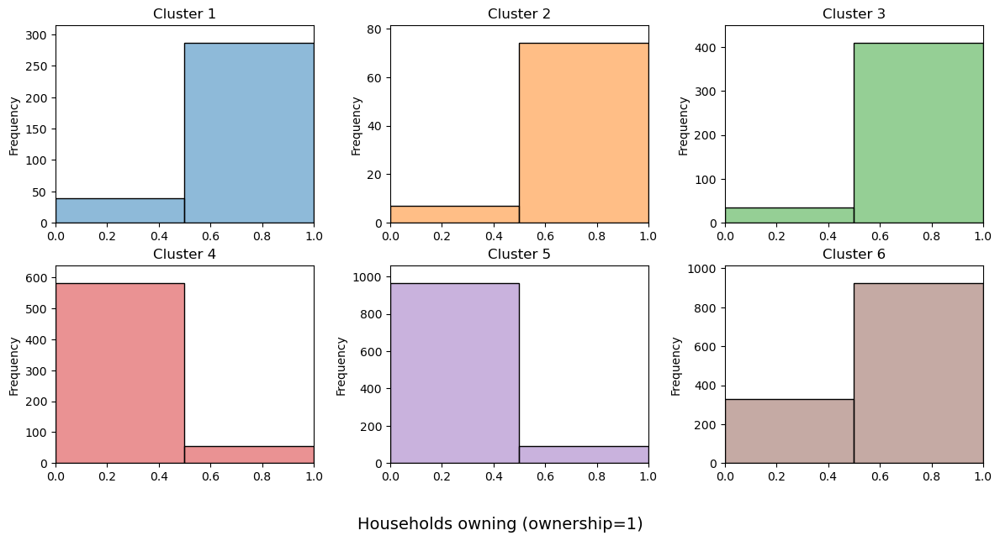

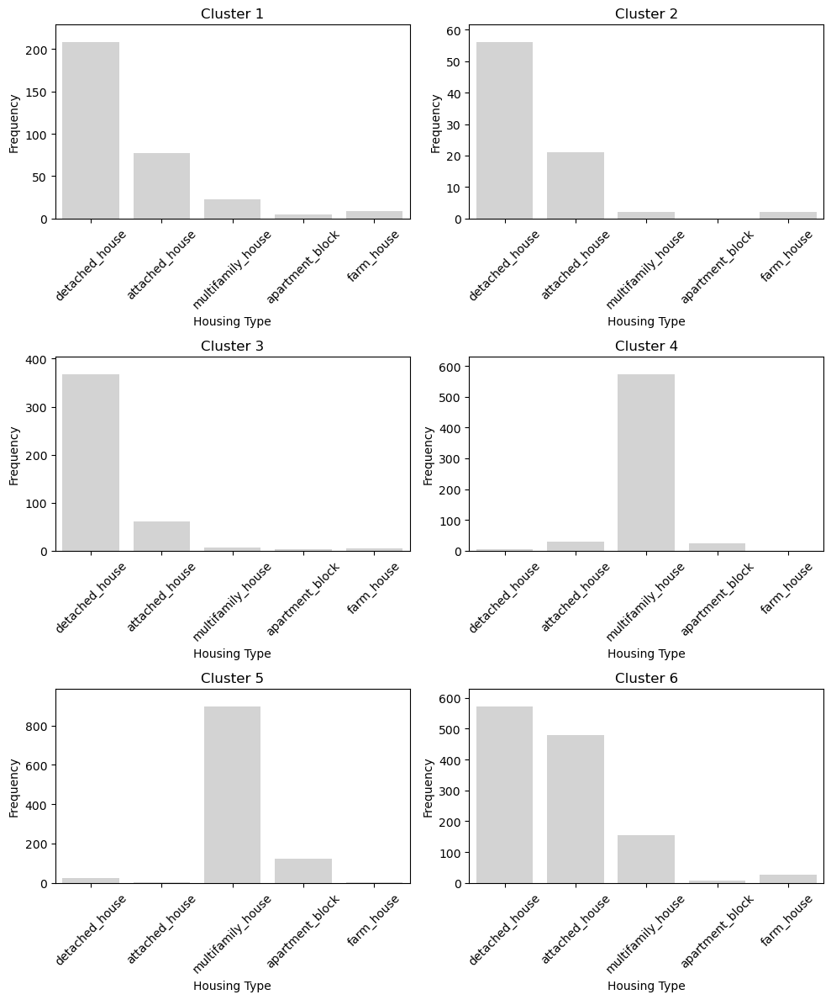

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

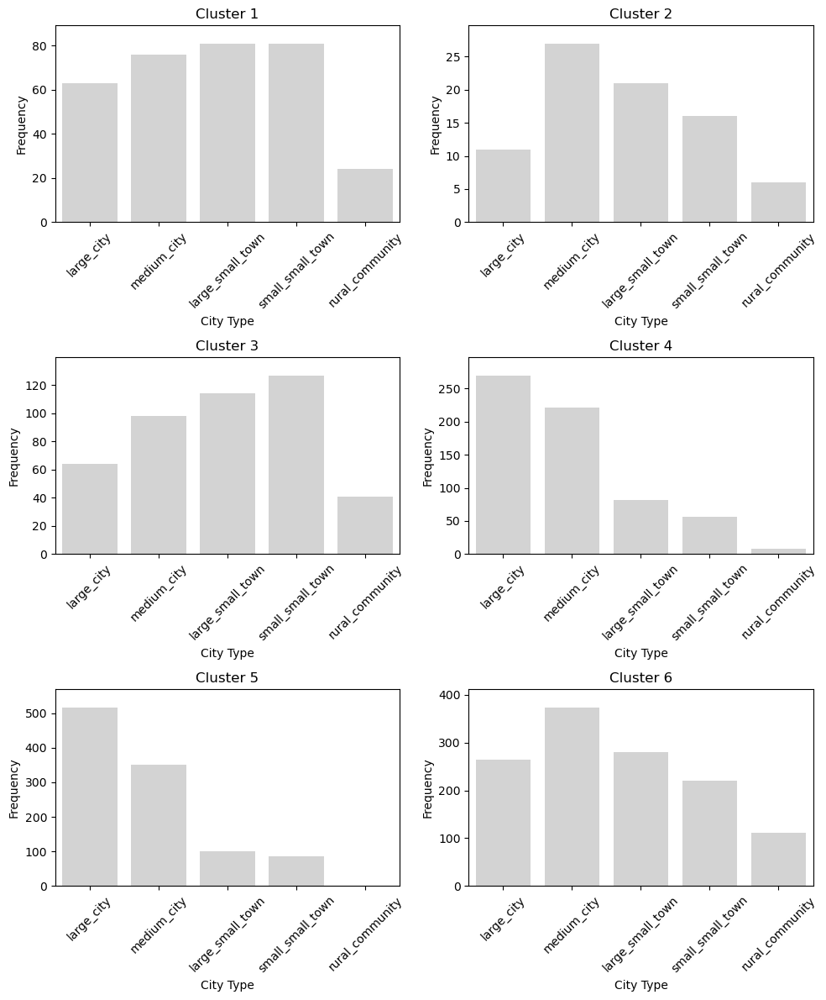

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

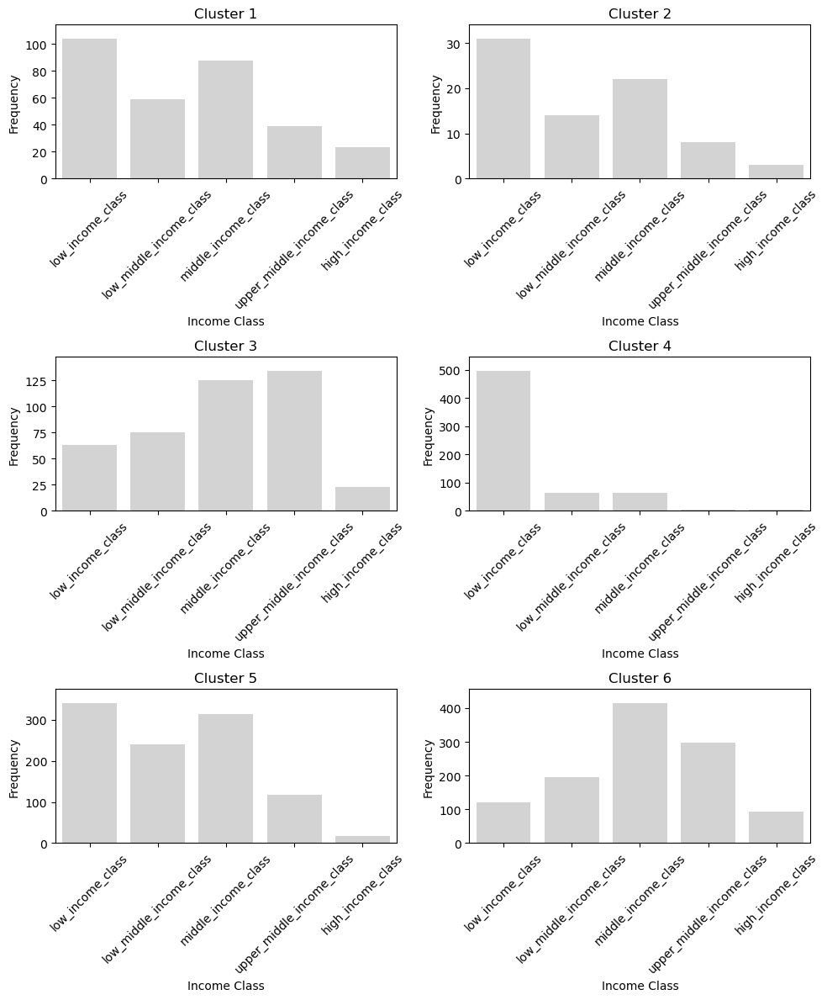

In [58]:
plotting_weighting(hier_cluster_weight25,"hier_distance30",25)

#### Weighting 30

In [59]:
#Applying weighting of 30
df_housing_stand_weight30=df_weighting_change(df_housing_stand,30)
#Creating Z linkage matrix
Z_w30=hierarch_clustering_allmergers(df_housing_stand_weight30,30)
Z_w30=pd.DataFrame(Z_w30)
within_variance_weight30=pd.DataFrame(Z_w30.iloc[:,2])
within_variance_weight30.columns=["within_variance"]
within_variance_weight30["difference"]=within_variance_weight30['within_variance'].diff()


Merger values of the last 10 agglomeration levels:
Level 1: 22.326490087176165
Level 2: 24.49933327577448
Level 3: 28.98666087316059
Level 4: 29.796693622201666
Level 5: 40.98132730513399
Level 6: 47.40238386840091
Level 7: 52.07945910692864
Level 8: 72.71879336810767
Level 9: 83.89115494802755
Level 10: 175.63819998888923


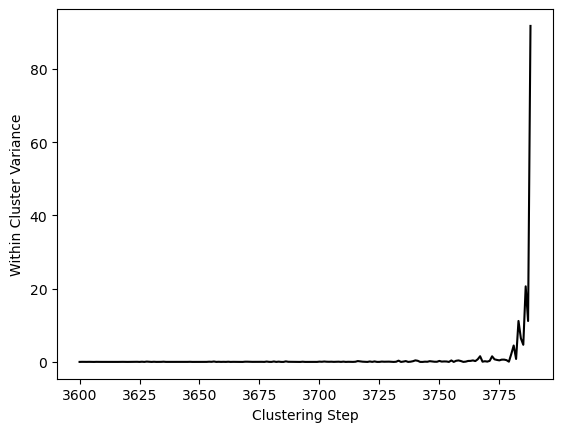

In [60]:
difference_plot(within_variance_weight30,3600,"weighting_30")

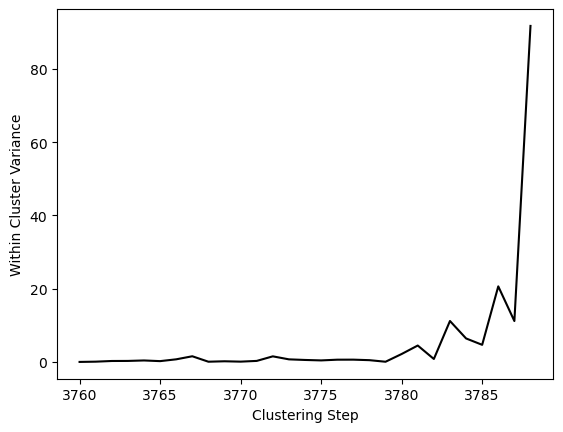

In [61]:
difference_plot(within_variance_weight30,3760,"weighting_30")

In [62]:
within_variance_weight30.iloc[-15:,:]

,within_variance,difference
3774,20.103682,0.546756
3775,20.527237,0.423555
3776,21.147431,0.620193
3777,21.777725,0.630295
3778,22.266233,0.488508
3779,22.326490,0.060257
3780,24.499333,2.172843
3781,28.986661,4.487328
3782,29.796694,0.810033
3783,40.981327,11.184634


In [63]:
#Performing clustering with weighting of 30 and distance cutoff of 30
hier_cluster_weight30,hier_cluster_means_weight30=hier_clustering(Z_w30,df_housing,30)

##### Plots

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. 

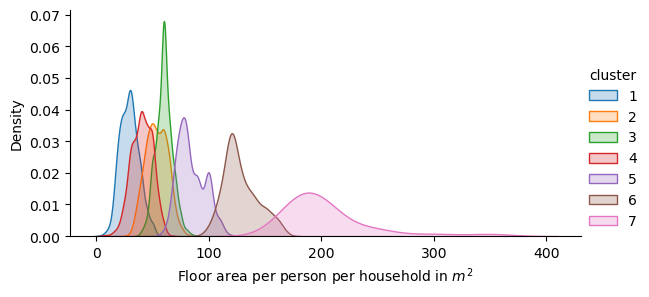

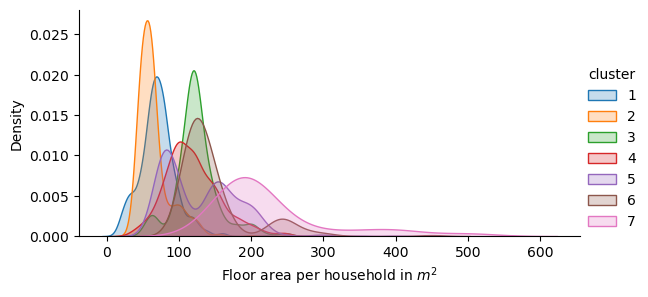

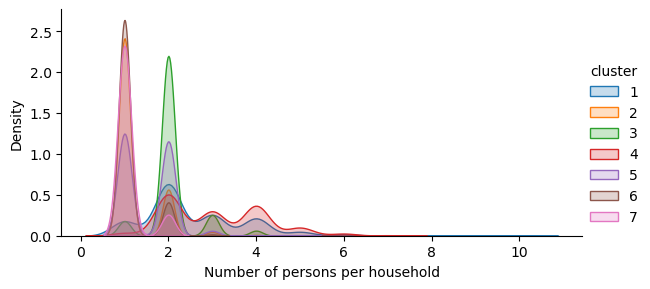

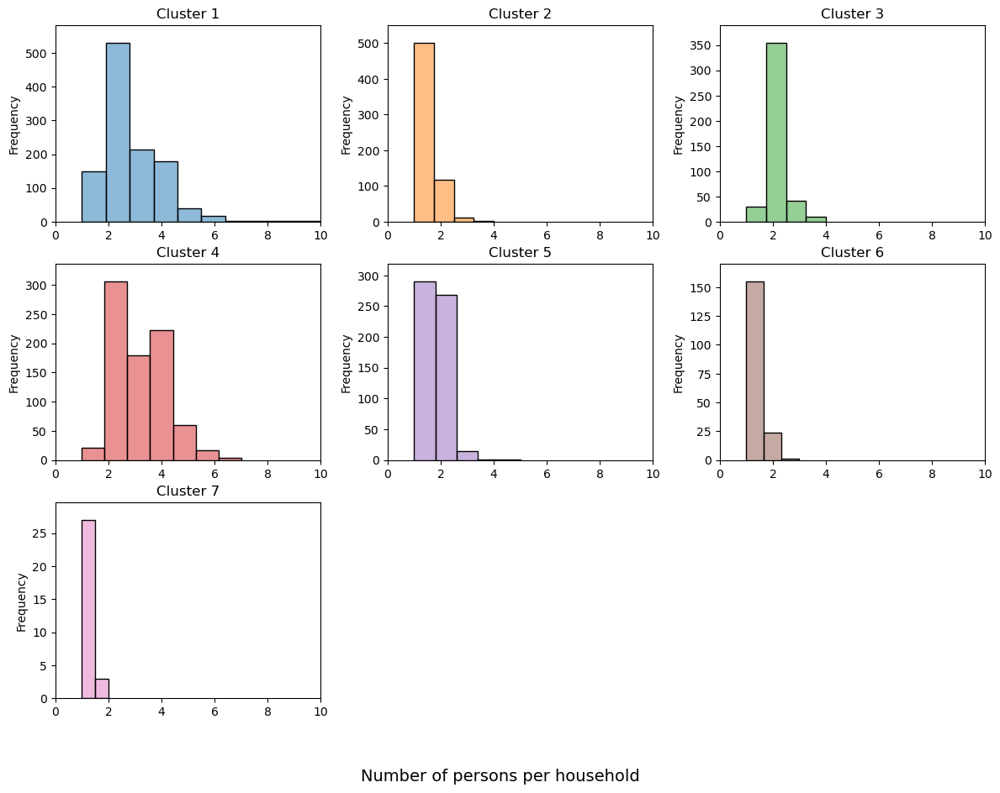

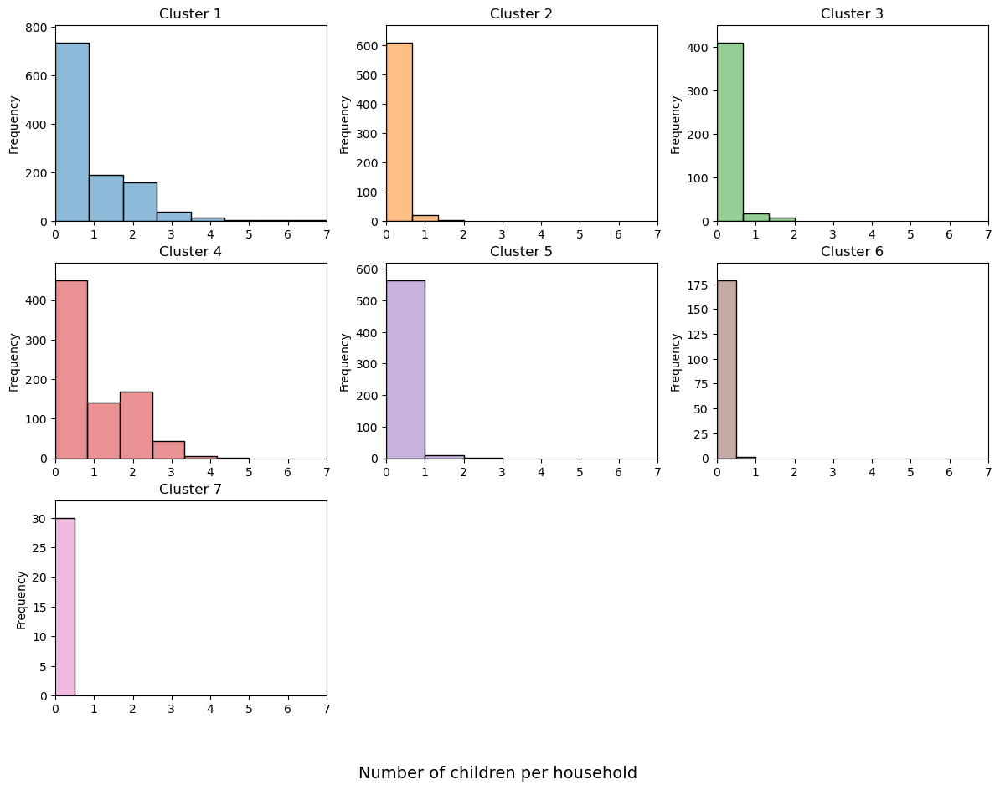

...

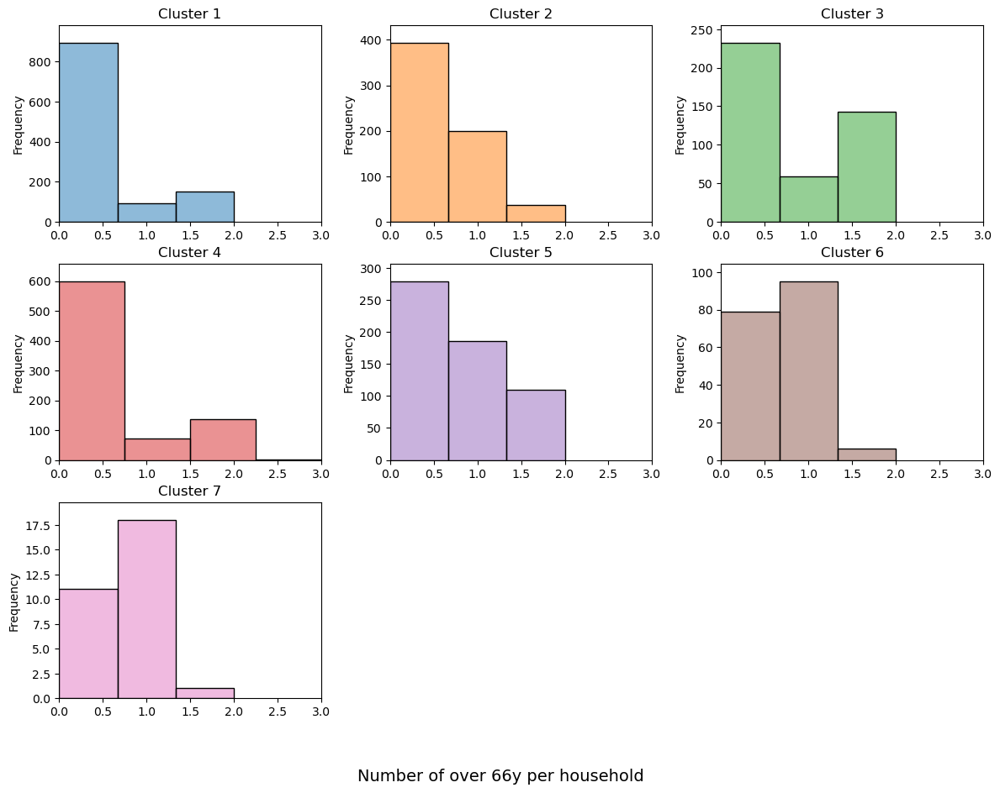

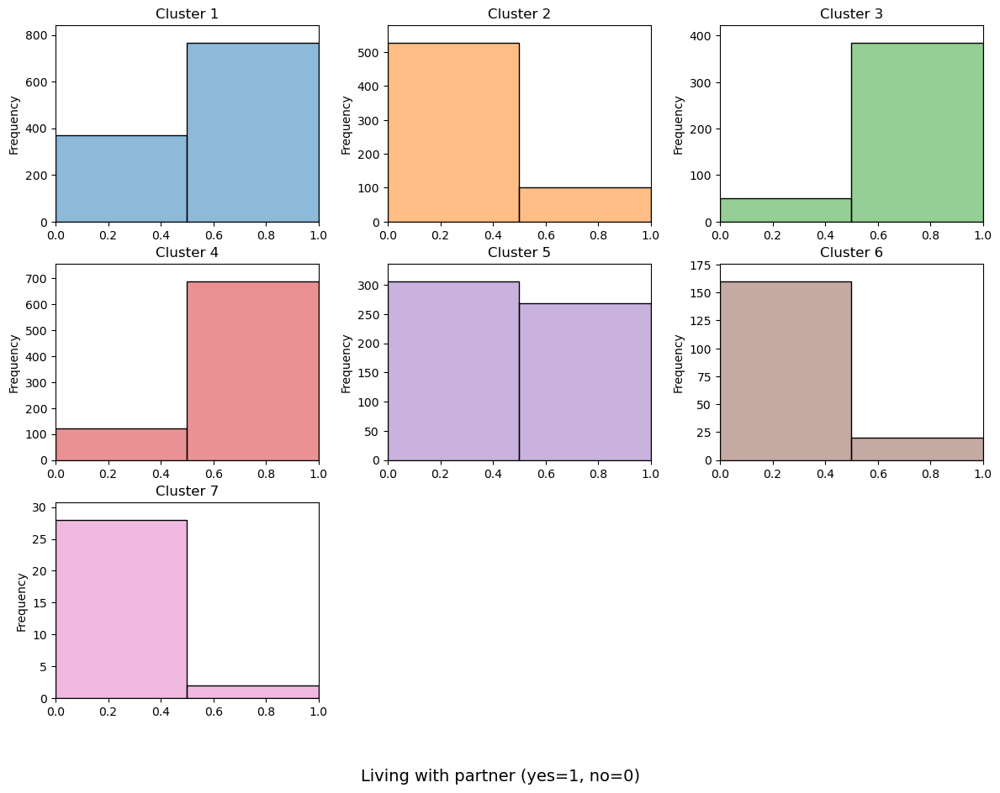

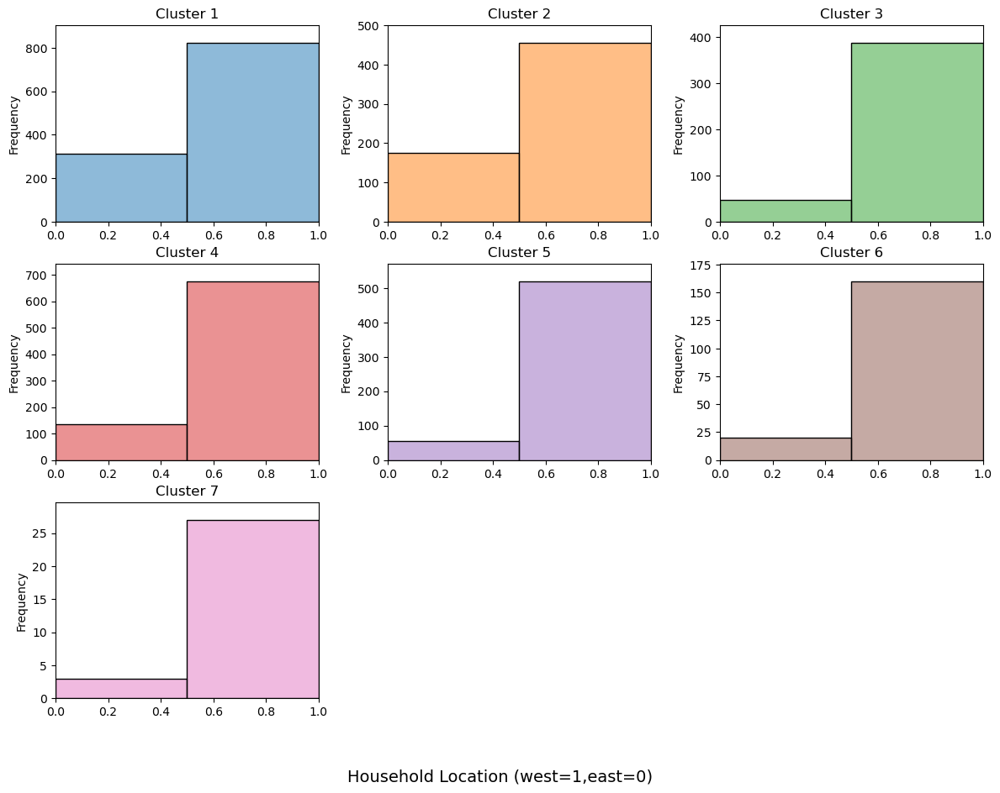

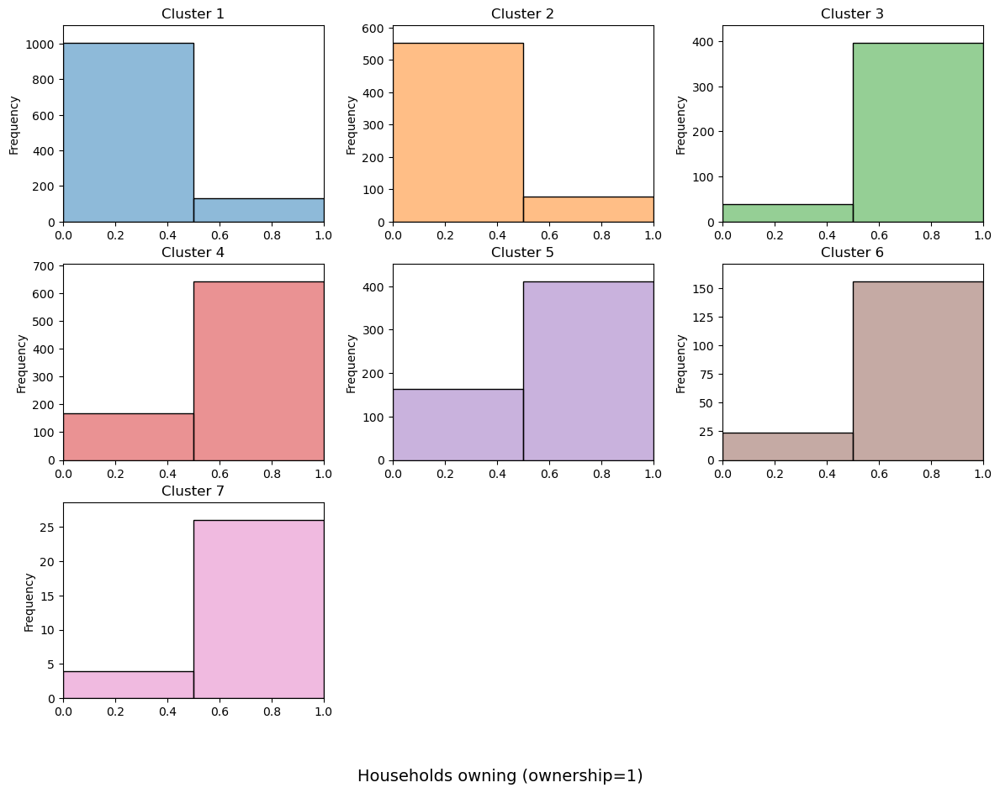

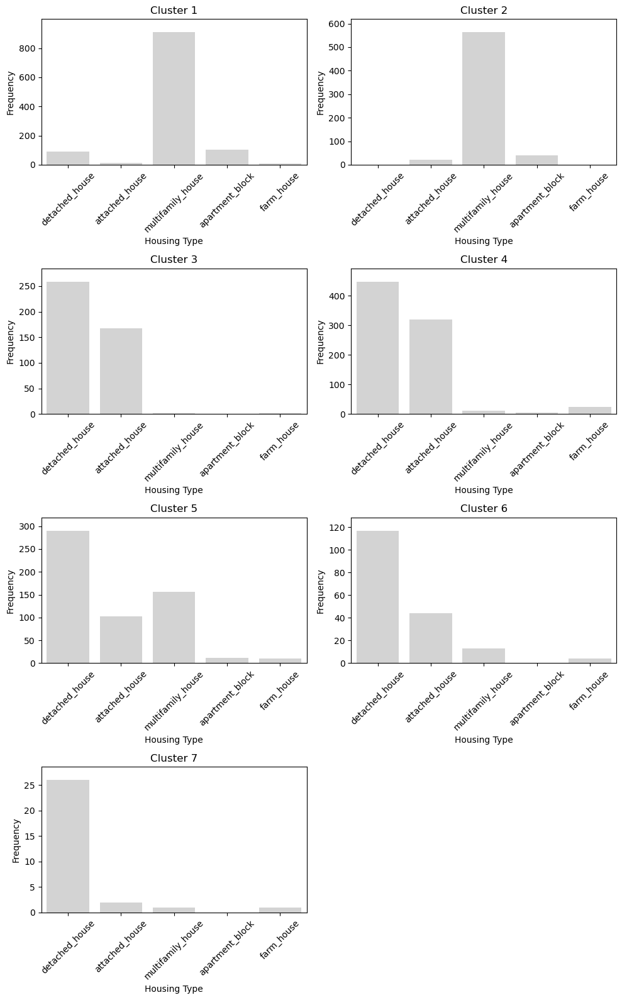

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

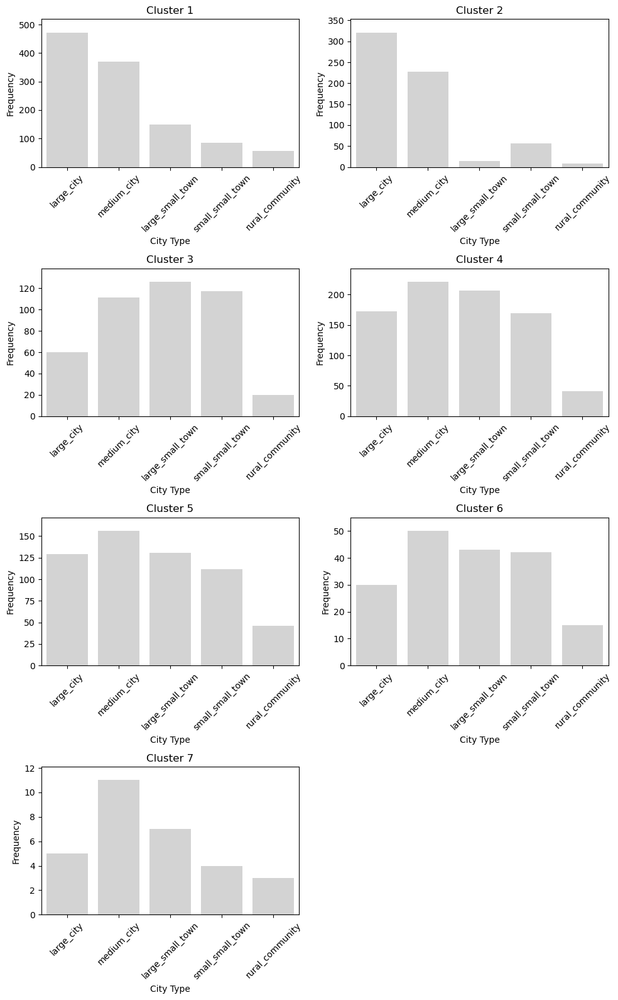

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

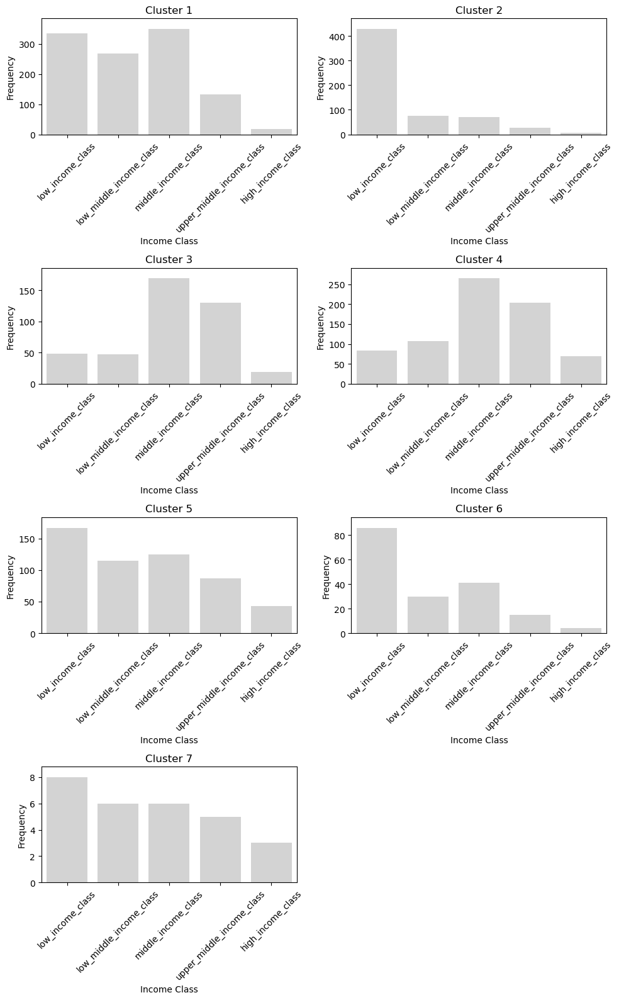

In [64]:
plotting_weighting(hier_cluster_weight30,"hier_distance30",30)

##### Different distance

In [65]:
#Performing clustering with weighting of 30 and distance cutoff of 30
hier_cluster_weight30,hier_cluster_means_weight30=hier_clustering(Z_w30,df_housing,53)

##### plots

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. 

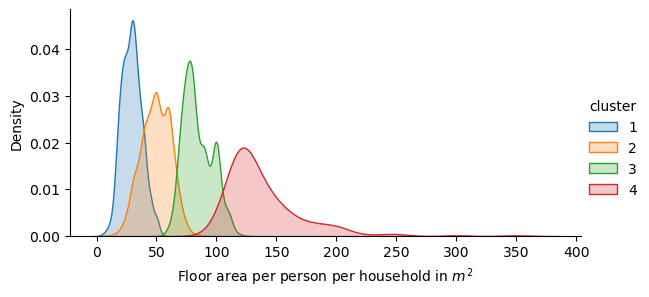

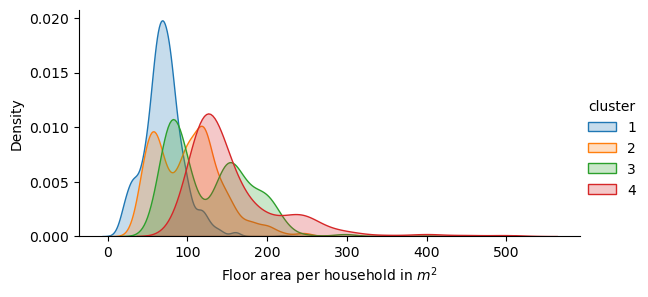

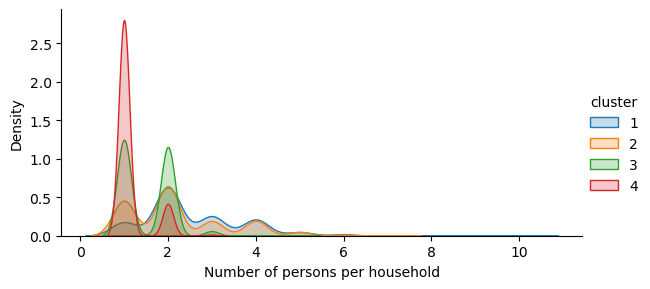

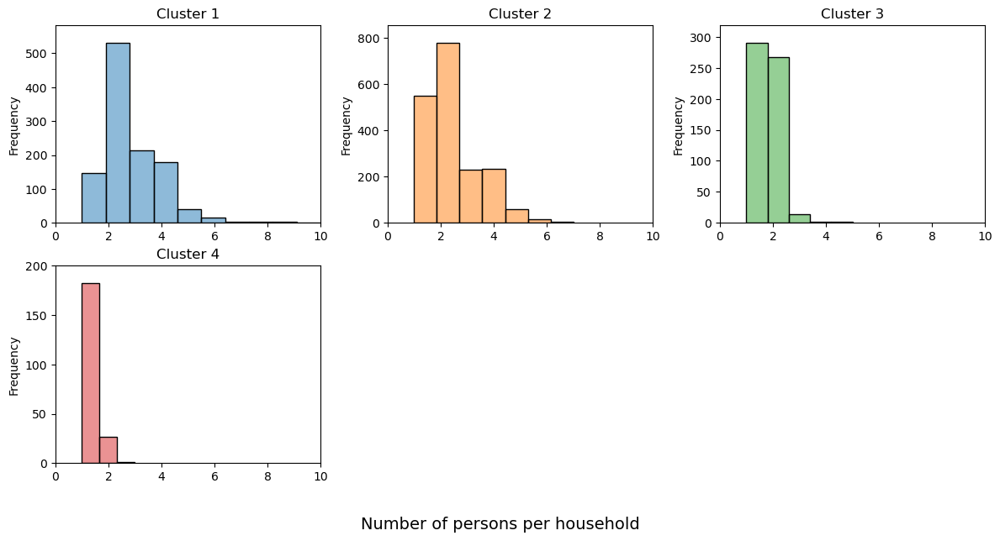

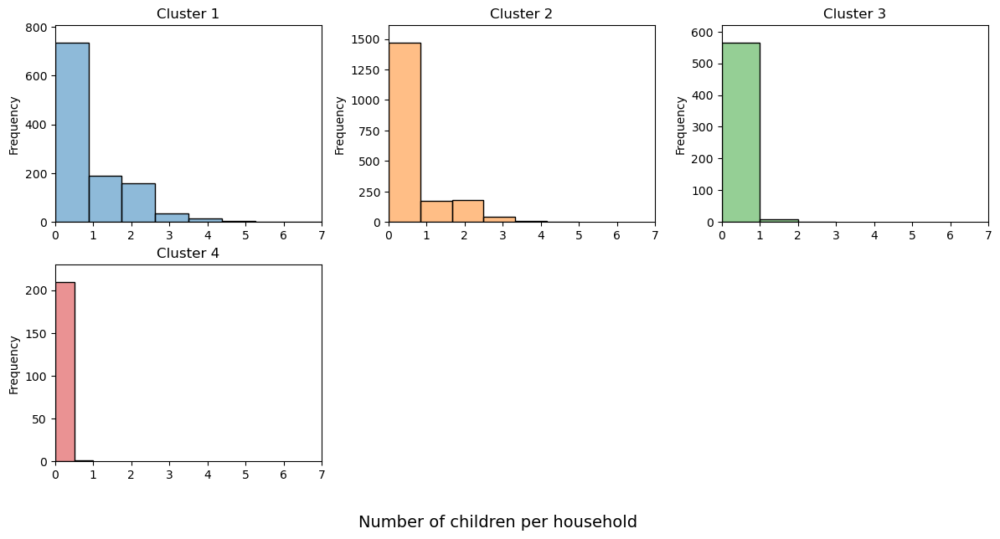

...

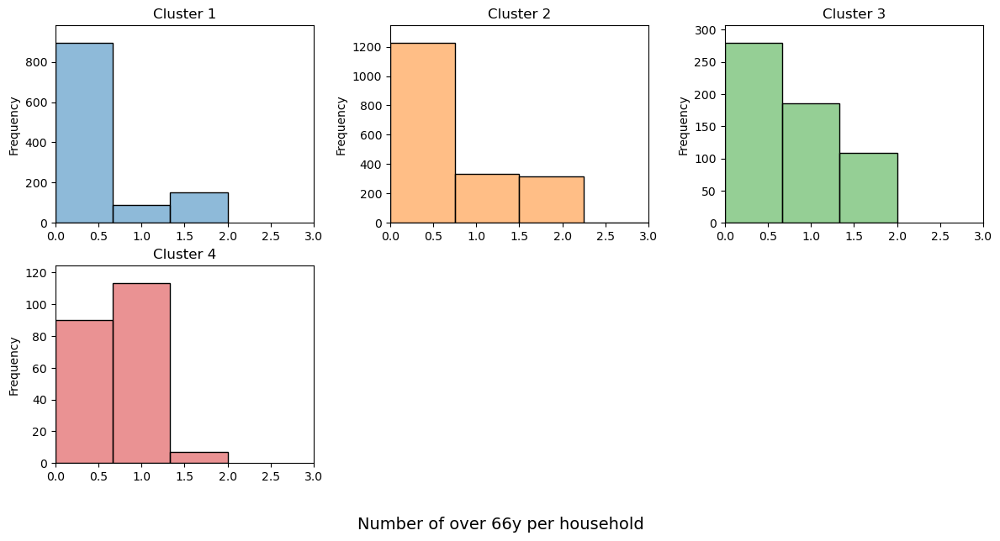

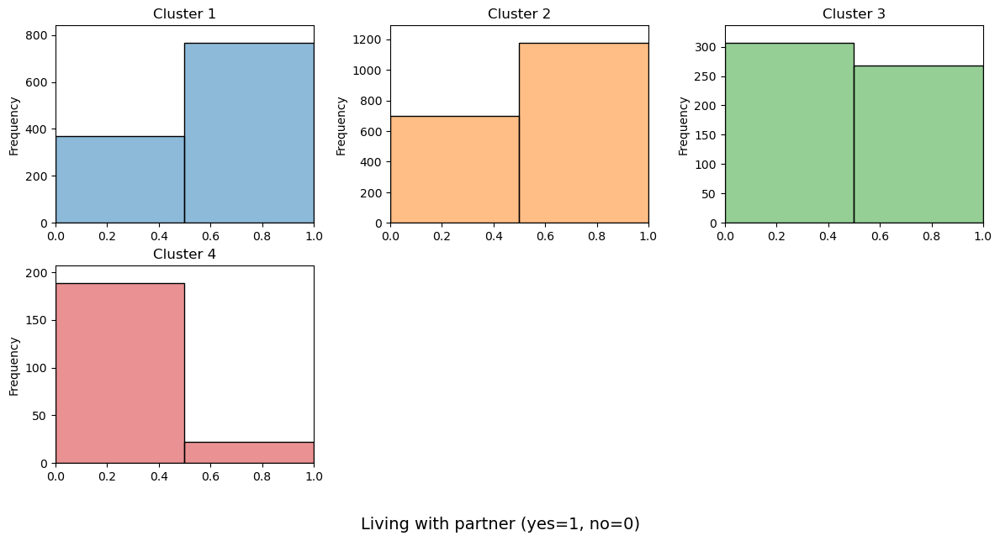

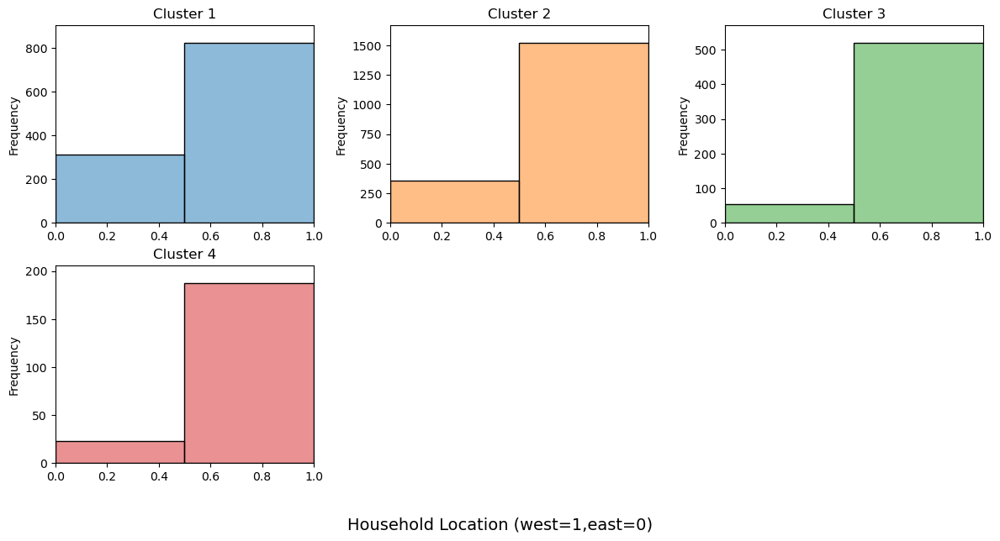

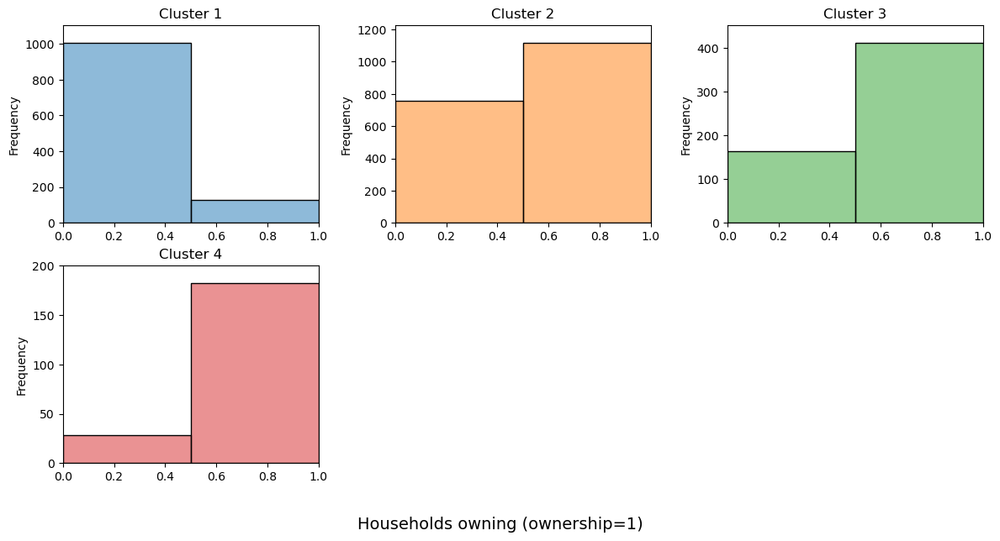

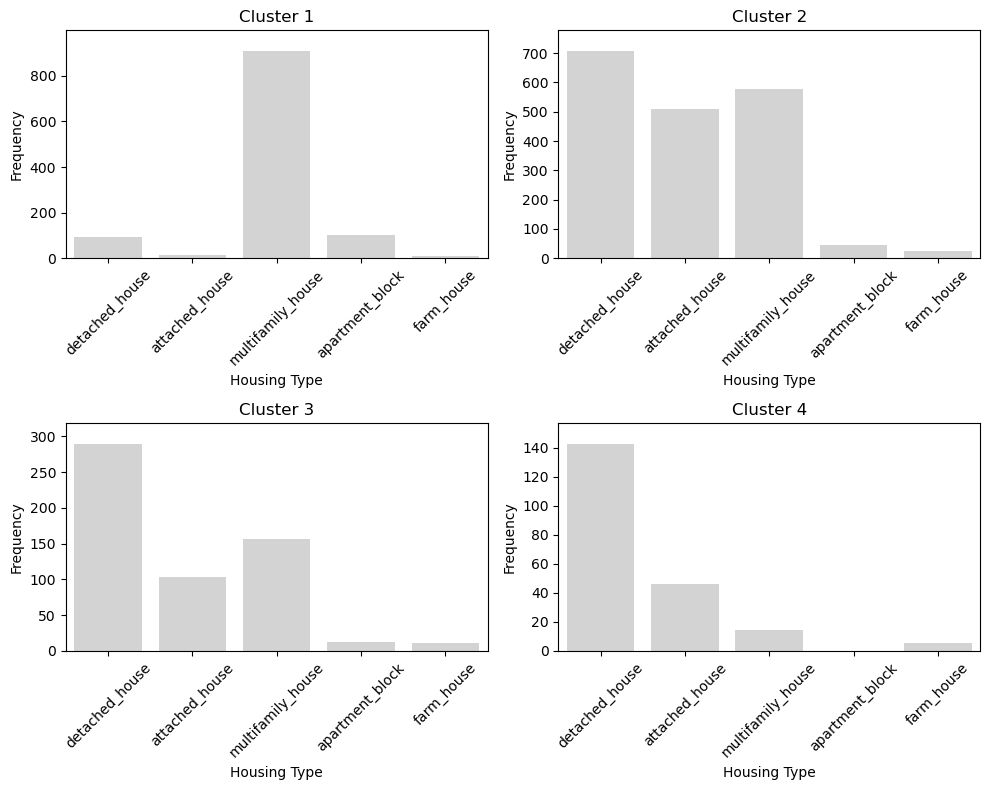

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

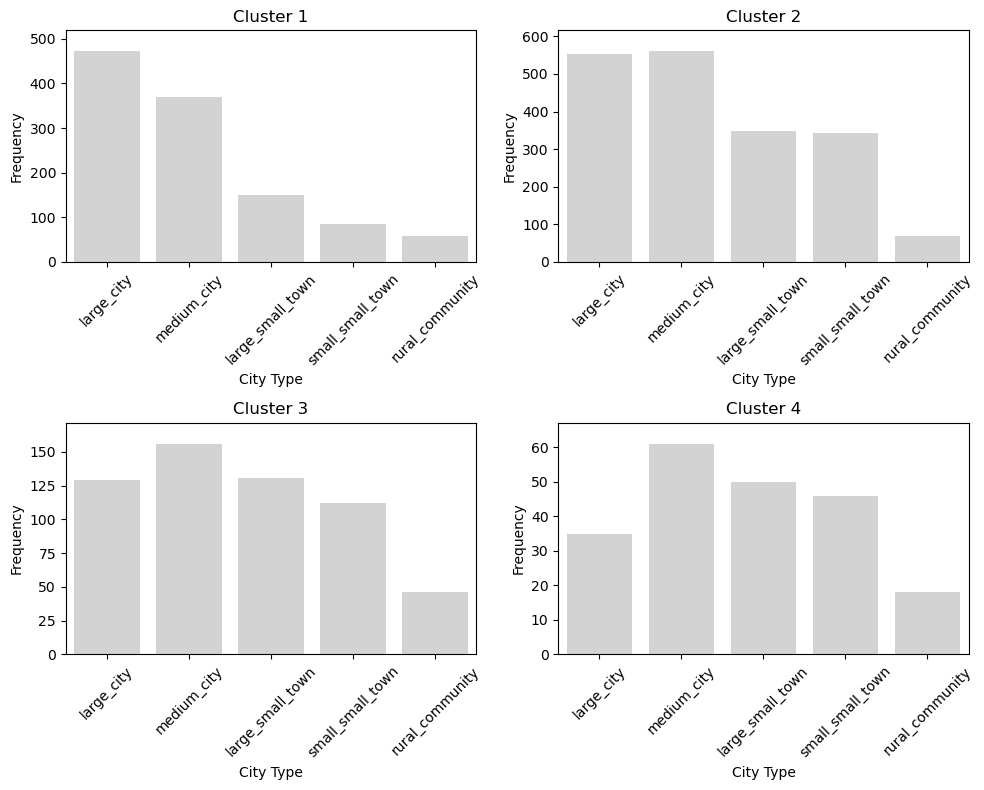

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

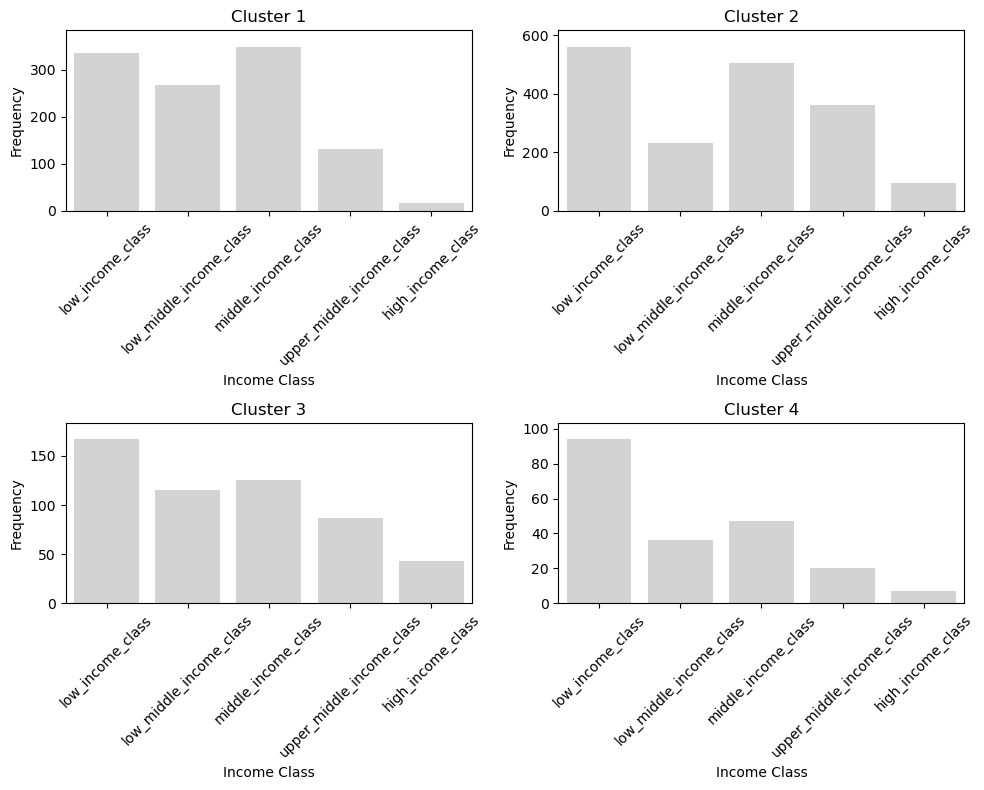

In [66]:
plotting_weighting(hier_cluster_weight30,"hier_distance53",30)

#### Weighting 40

In [67]:
#Applying weighting of 40
df_housing_stand_weight40=df_weighting_change(df_housing_stand,40)
#Creating Z linkage matrix
Z_w40=hierarch_clustering_allmergers(df_housing_stand_weight40,40)
Z_w40=pd.DataFrame(Z_w40)
#creating within variance and difference matrix to find cutoff value
within_variance_weight40=pd.DataFrame(Z_w40.iloc[:,2])
within_variance_weight40.columns=["within_variance"]
within_variance_weight40["difference"]=within_variance_weight40['within_variance'].diff()

Merger values of the last 10 agglomeration levels:
Level 1: 27.083016545419778
Level 2: 30.22648419331802
Level 3: 31.081035079026783
Level 4: 41.353442134223975
Level 5: 41.52413839711332
Level 6: 52.8909004596507
Level 7: 60.747265436545426
Level 8: 94.3536931253612
Level 9: 161.25378072816576
Level 10: 207.17375378331363


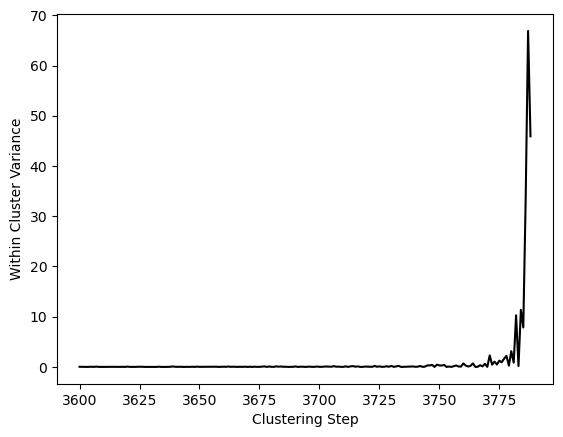

In [68]:
difference_plot(within_variance_weight40,3600,"weighting_40")

In [69]:
within_variance_weight40.iloc[-15:,:]

,within_variance,difference
3774,20.815531,0.477326
3775,22.056106,1.240575
3776,22.984380,0.928274
3777,24.626932,1.642552
3778,26.832099,2.205168
3779,27.083017,0.250917
3780,30.226484,3.143468
3781,31.081035,0.854551
3782,41.353442,10.272407
3783,41.524138,0.170696


In [70]:
#Performing clustering with weighting of 40 and distance cutoff of 30
hier_cluster_weight40,hier_cluster_means_weight40=hier_clustering(Z_w40,df_housing,30)

##### plots

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. 

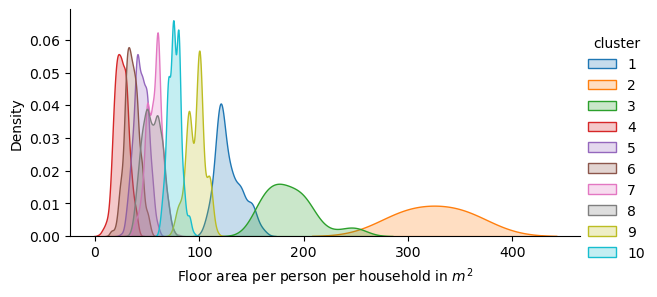

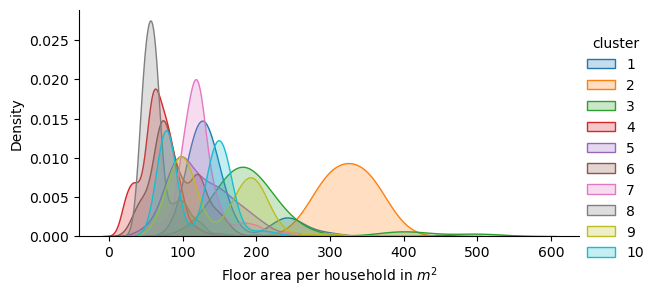

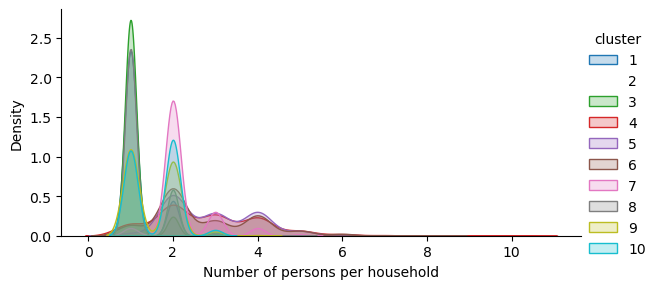

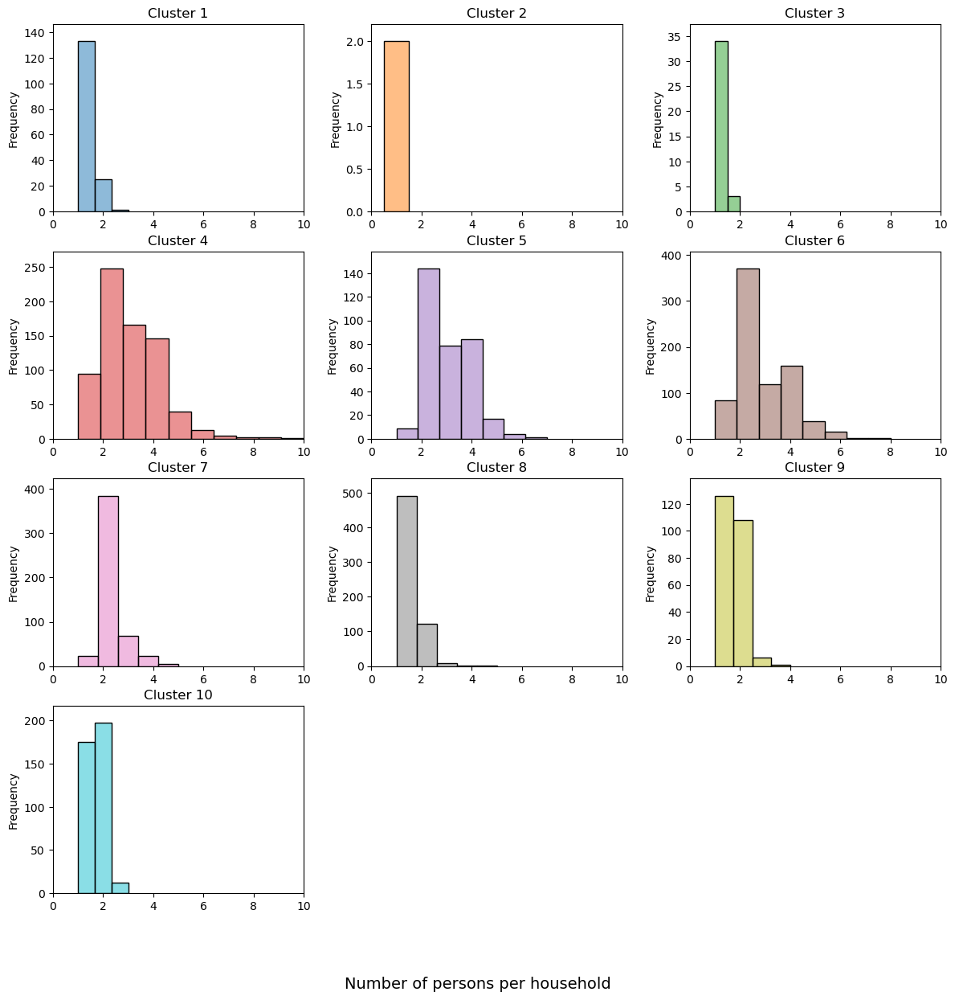

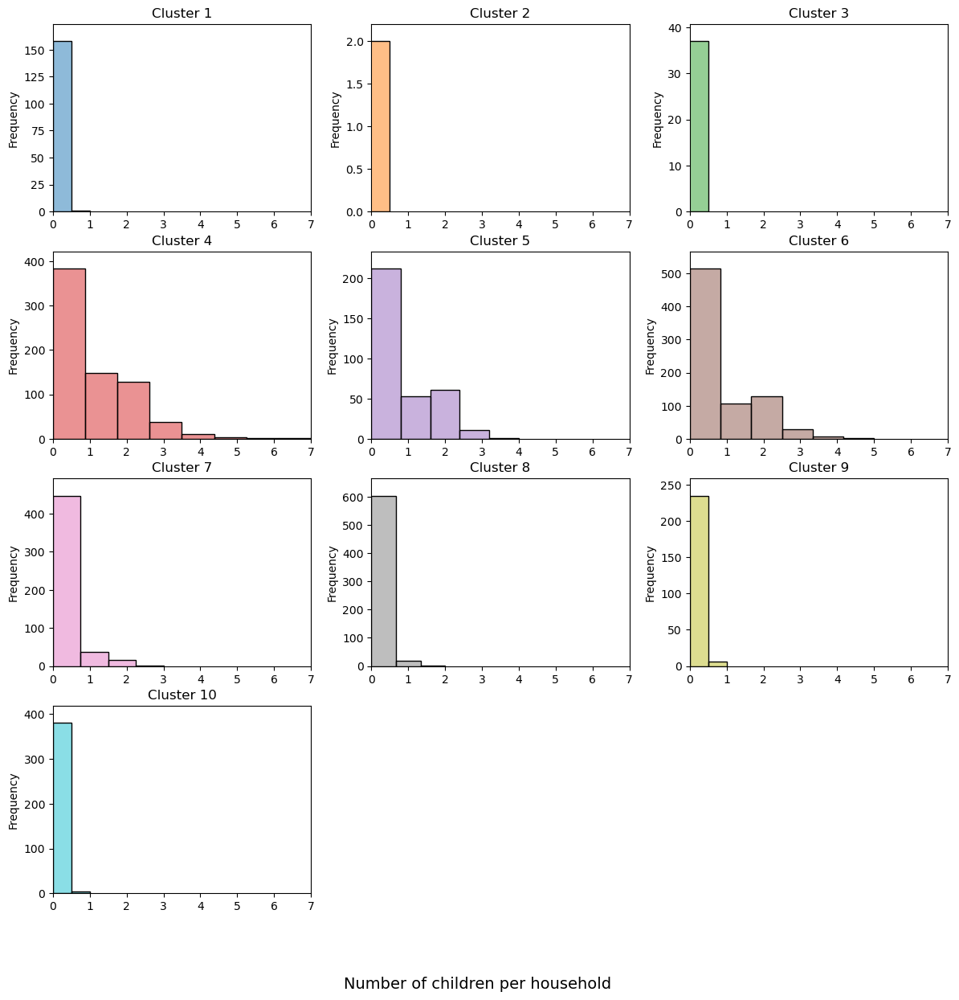

...

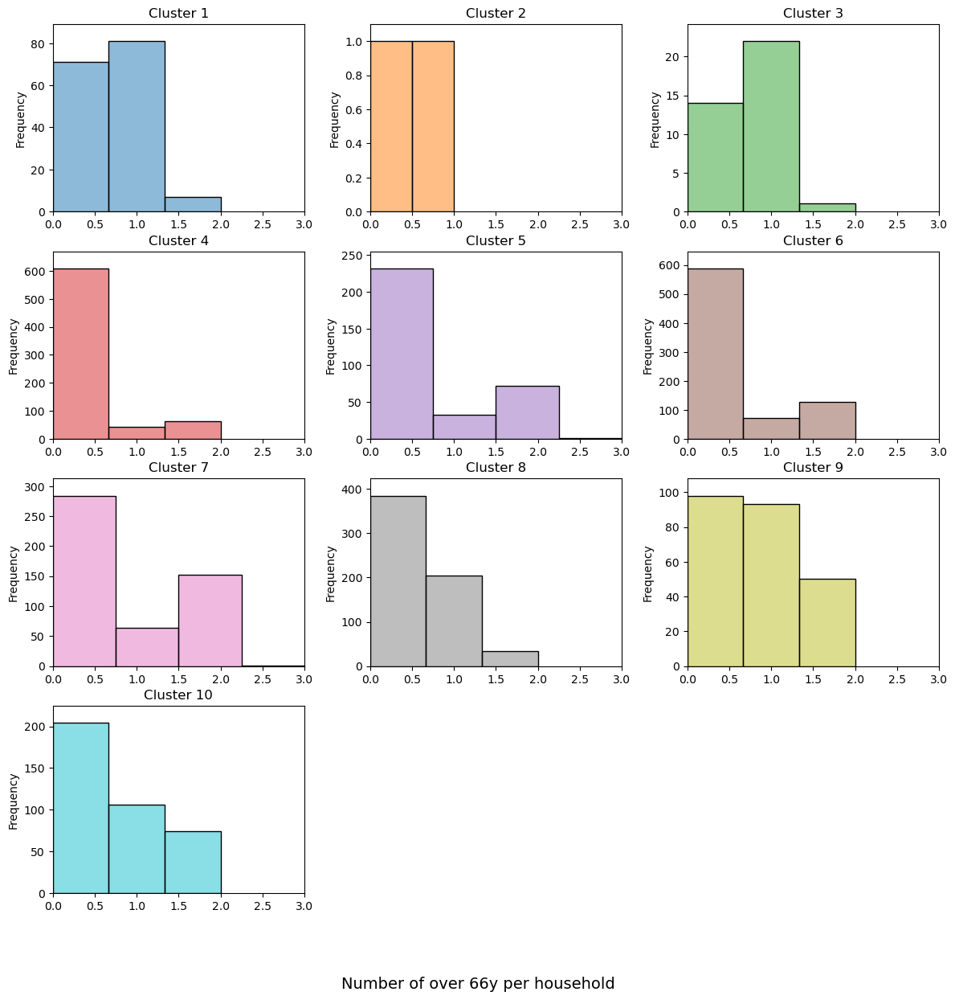

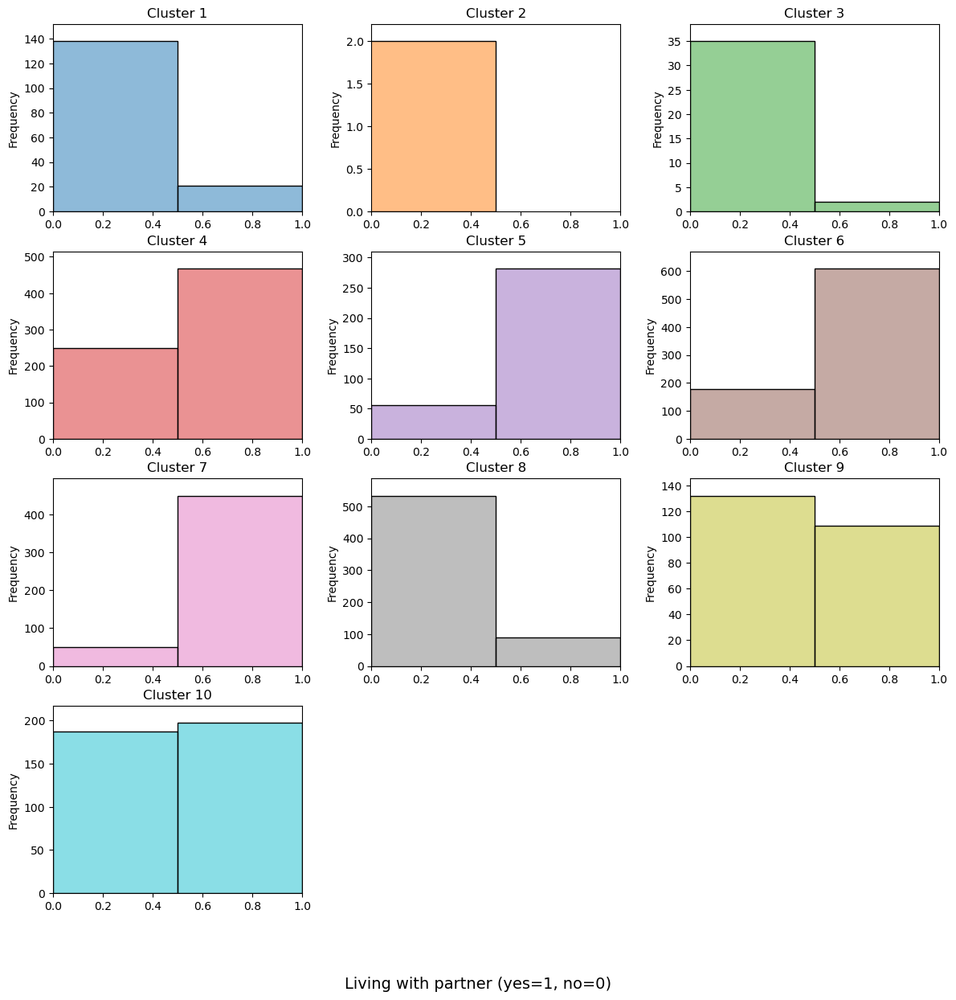

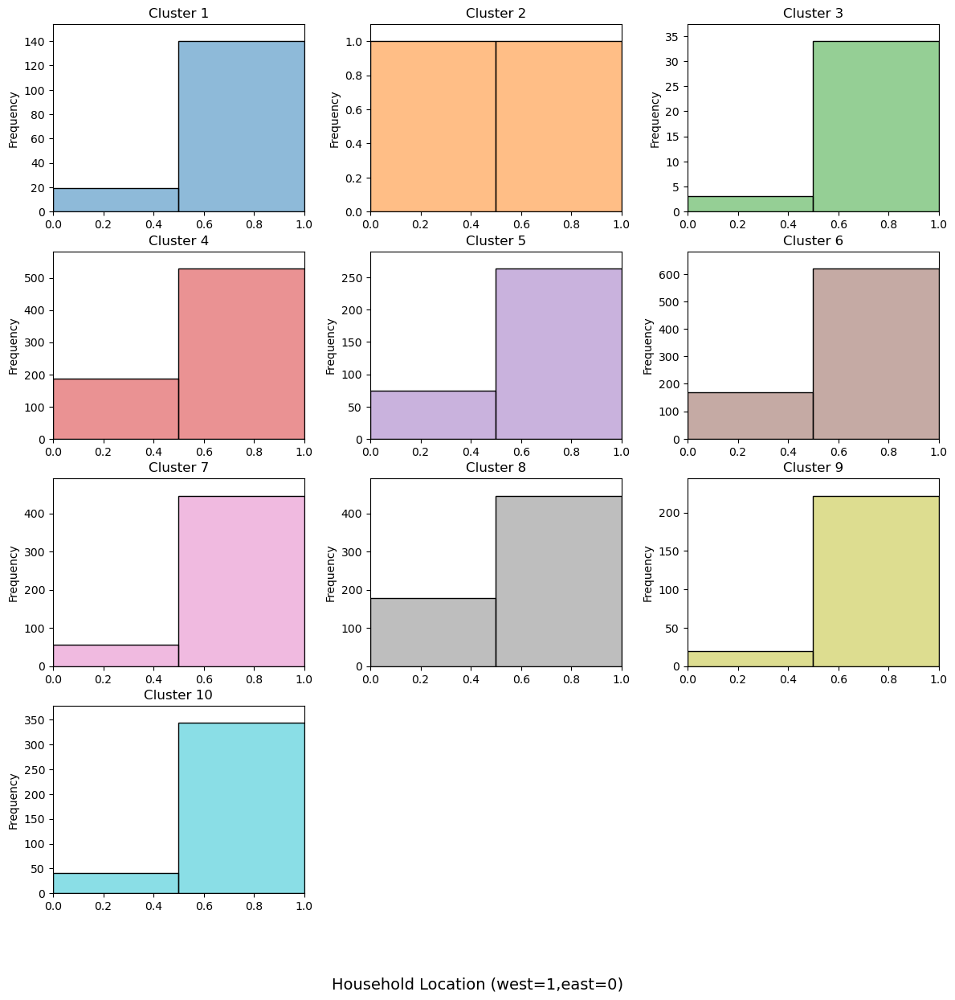

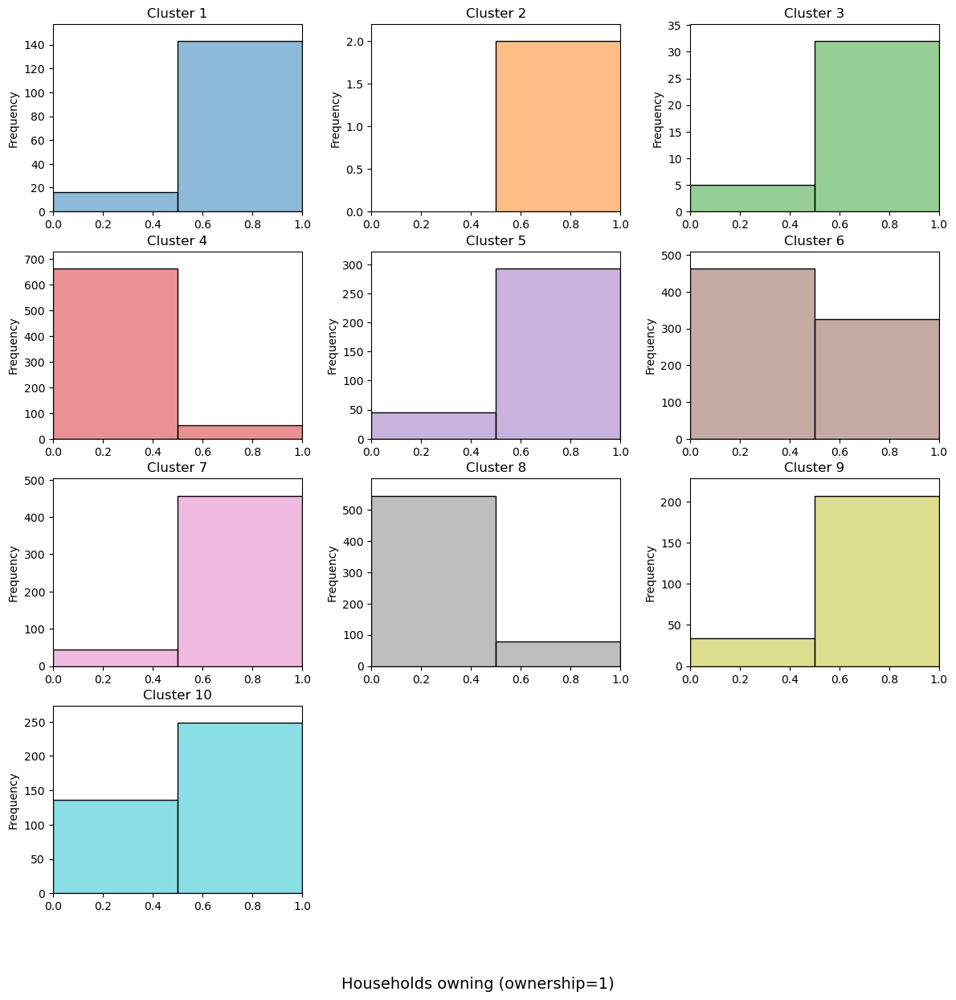

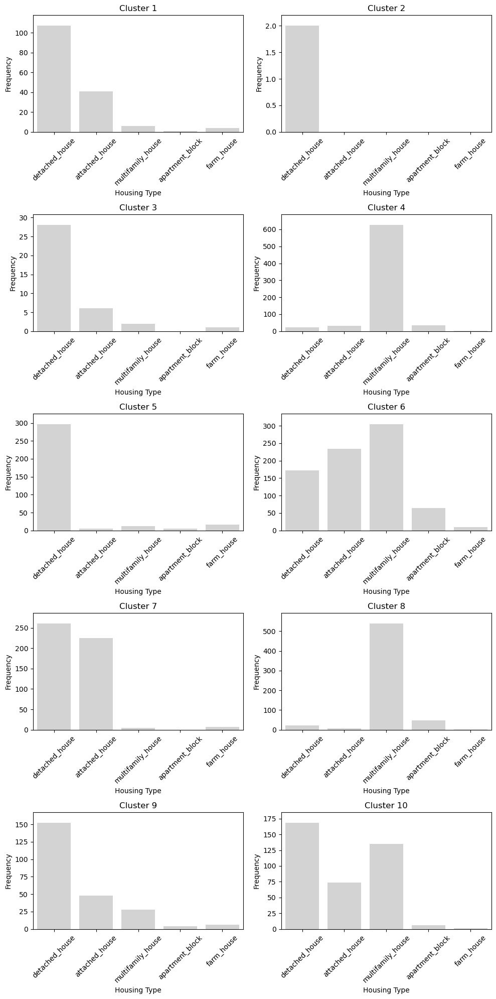

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

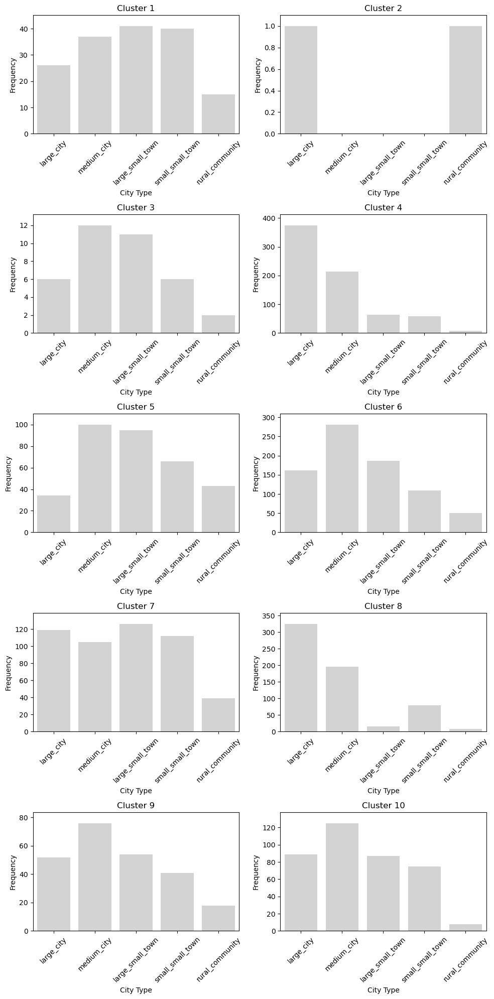

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

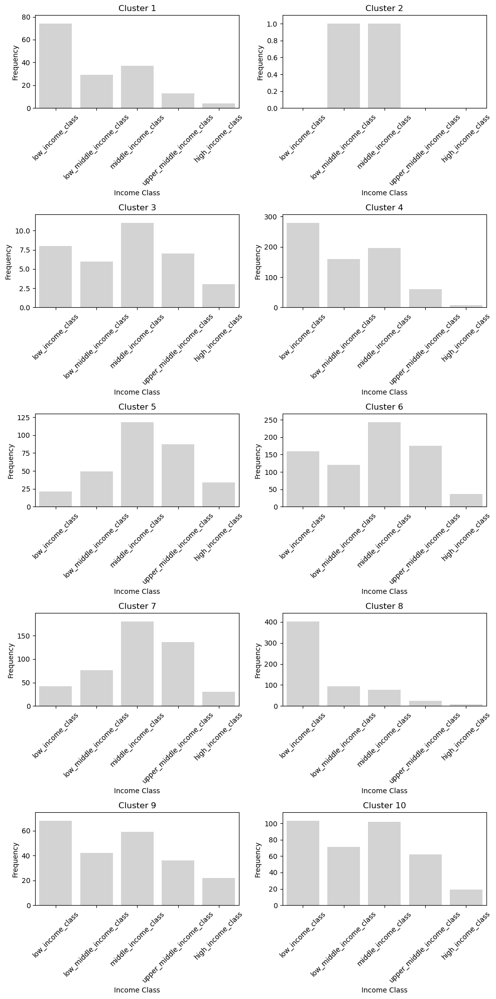

In [71]:
plotting_weighting(hier_cluster_weight40,"hier_distance30",40)

##### Trying out different distance cutoffs to find most distinct clustering

In [72]:
hier_cluster_weight40,hier_cluster_means_weight40=hier_clustering(Z_w40,df_housing,53)

##### plots

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. 

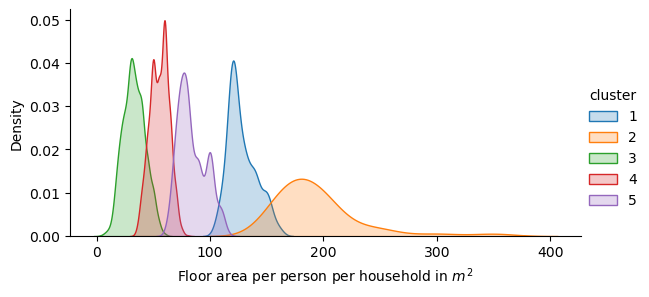

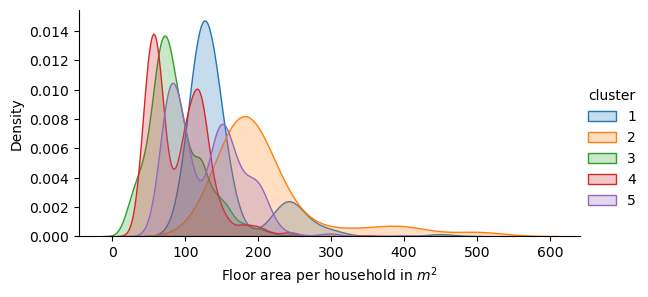

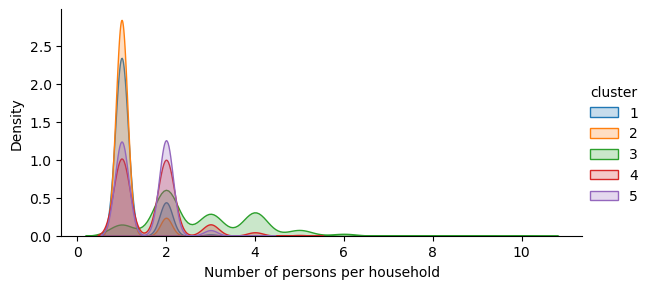

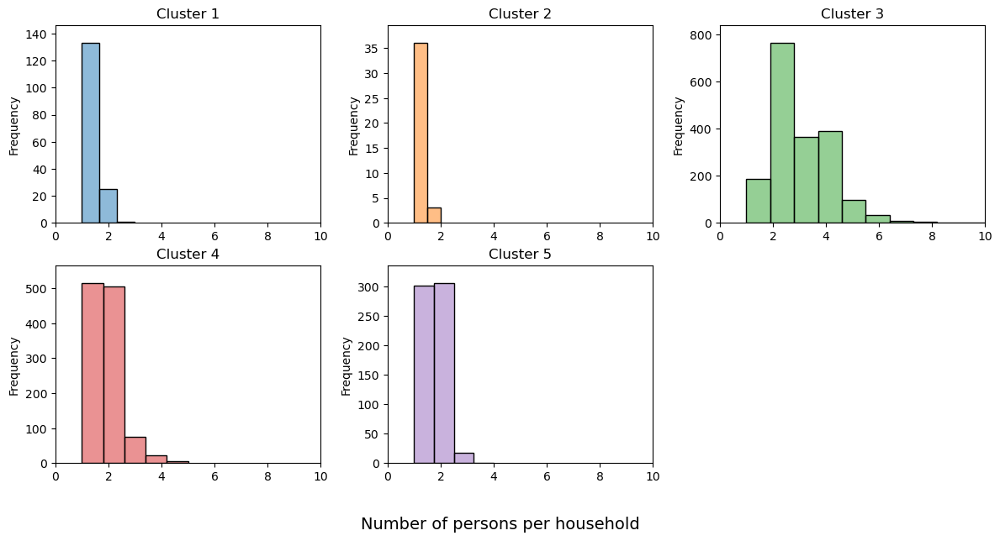

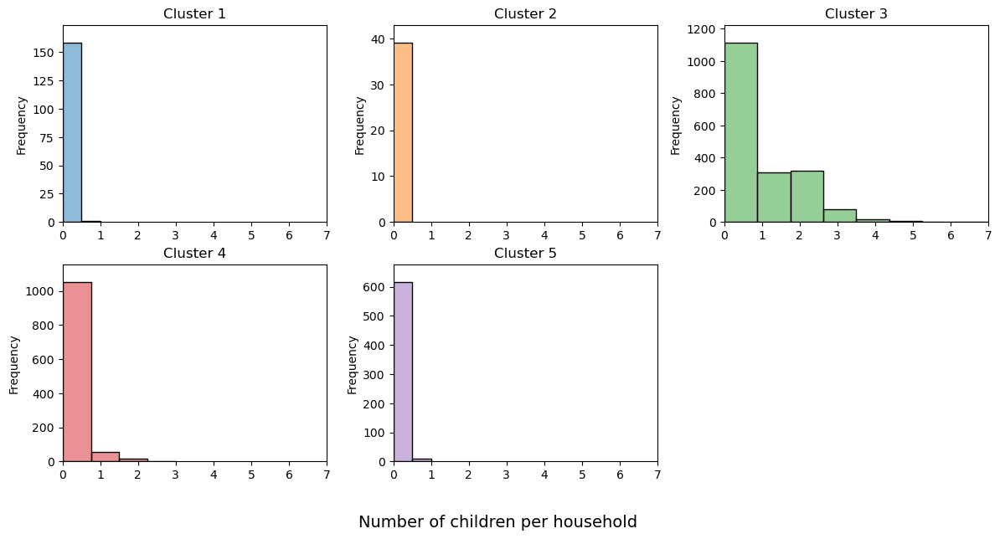

...

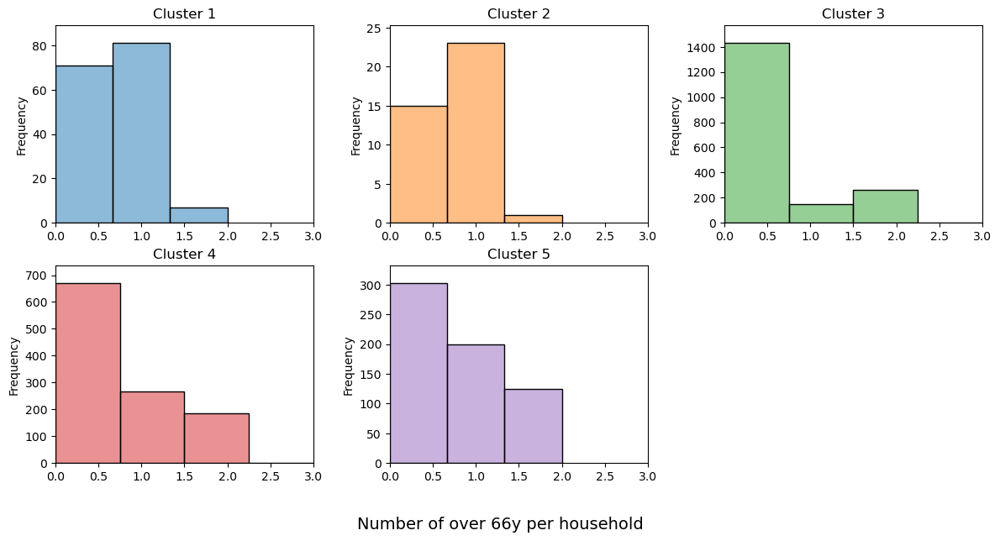

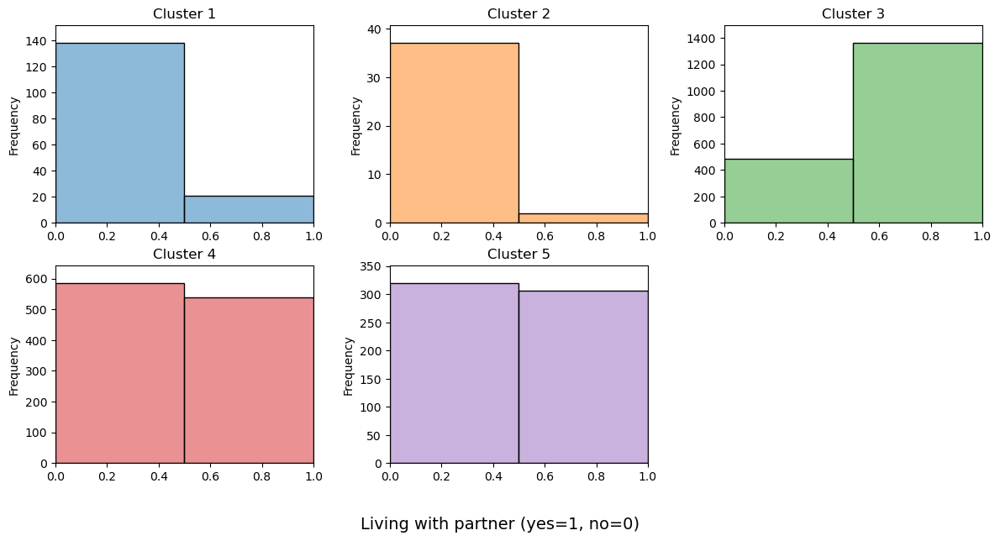

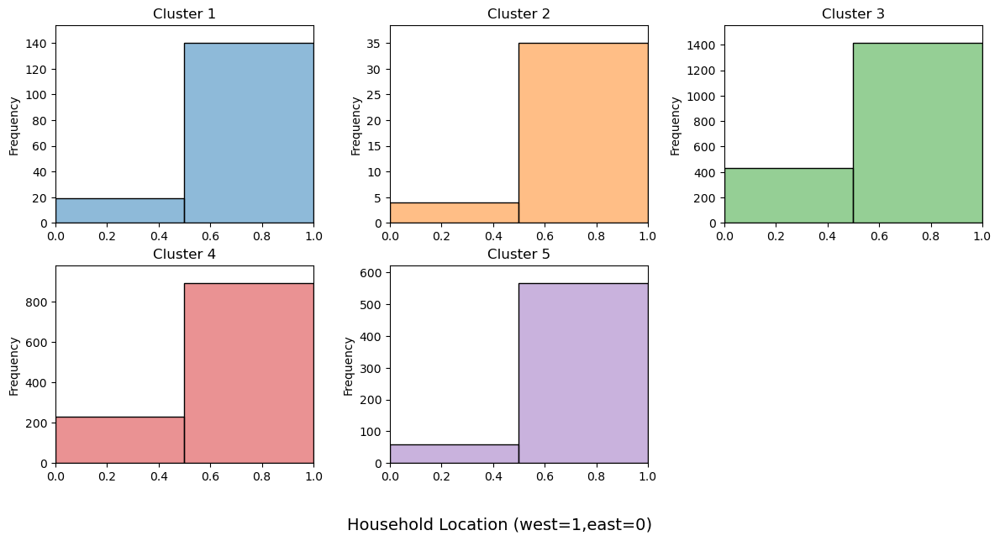

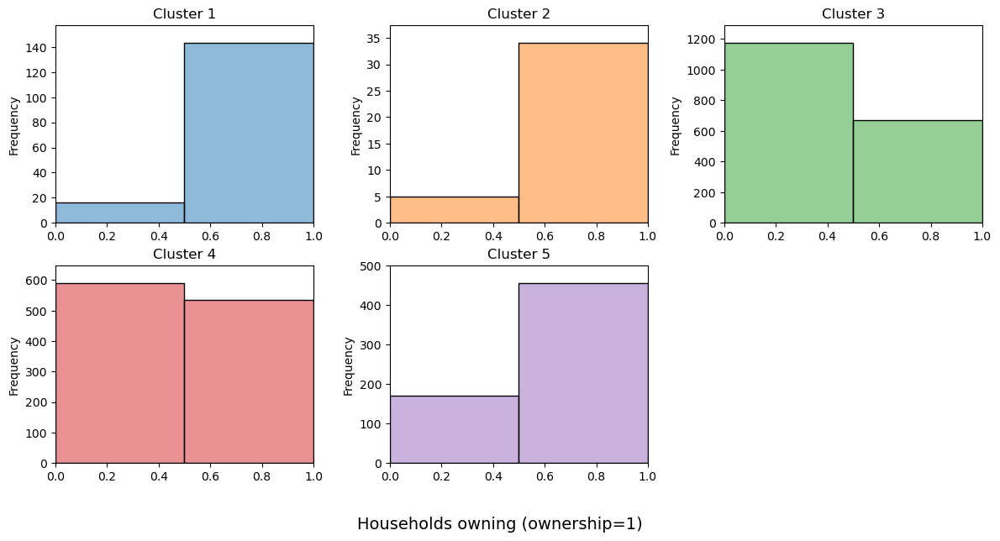

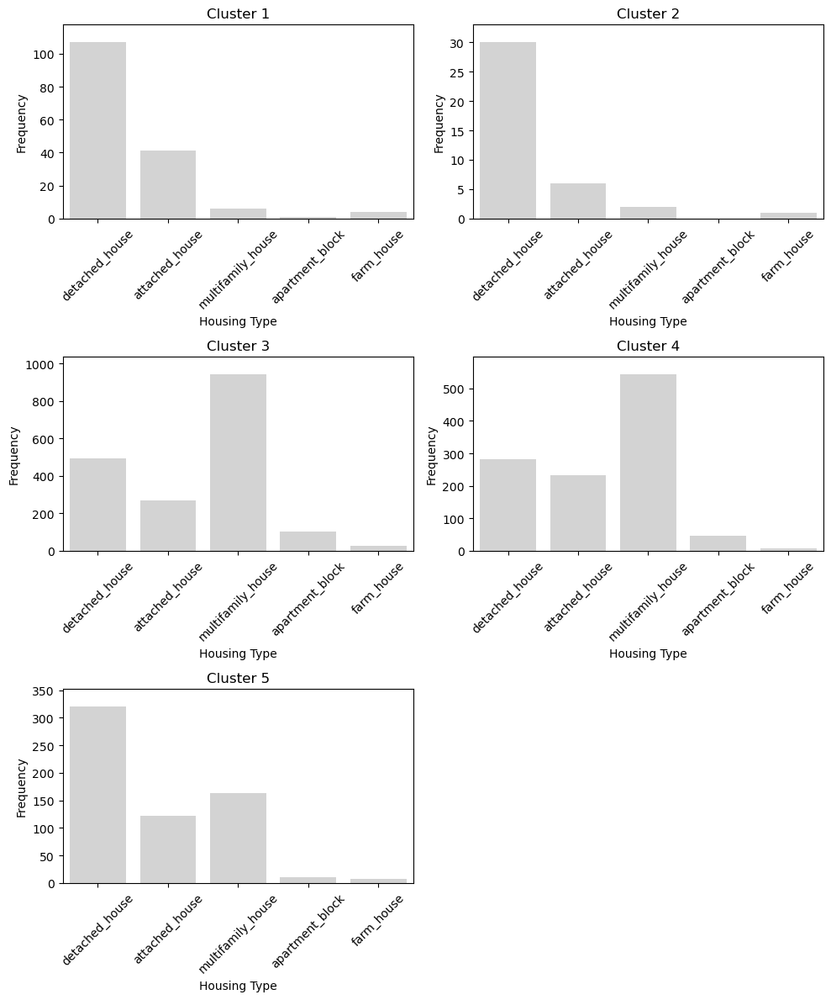

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

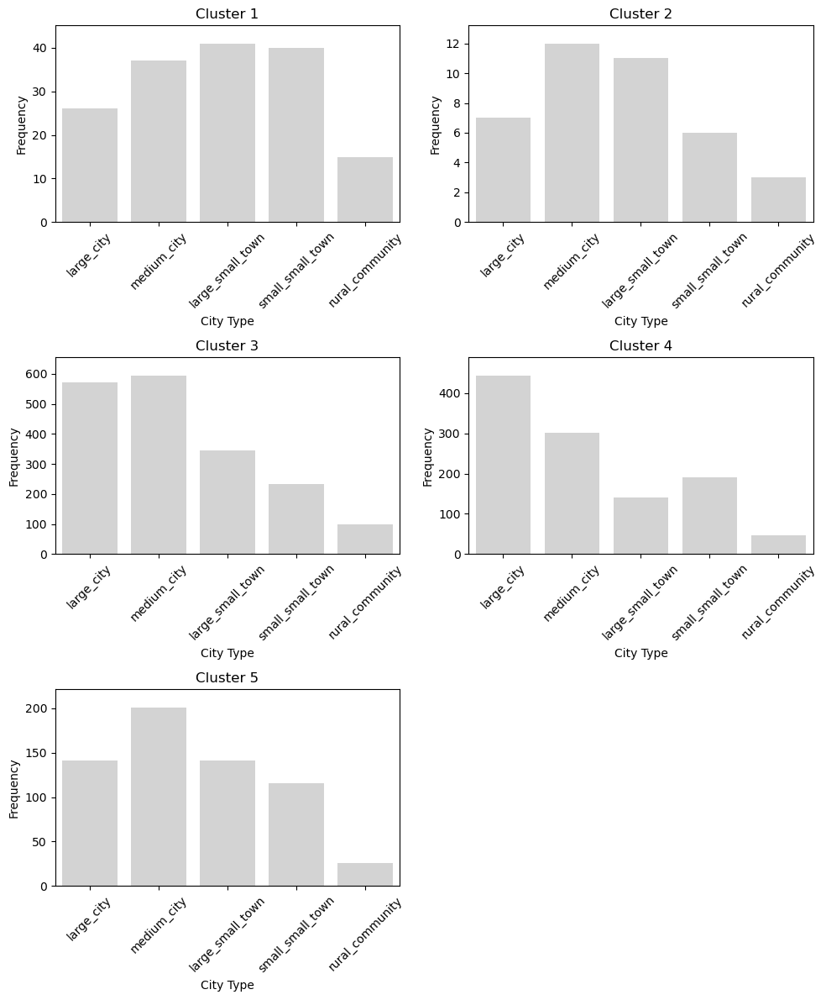

C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Python\Anaconda\envs\SpatialDataScience\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

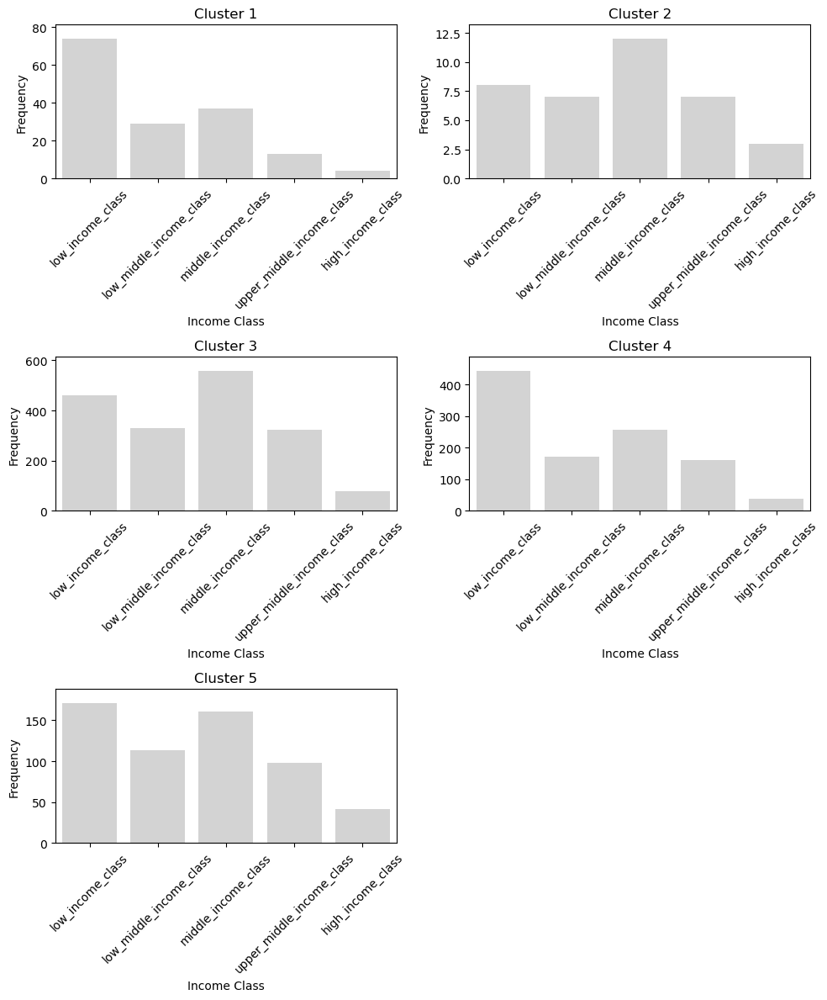

In [73]:
plotting_weighting(hier_cluster_weight40,"hier_distance53",40)

#### Final weighting 30 different distances

After analysing different weightings with different cutoff values, a weighting of 30 proves to provide the most distinct results without decreasing the variance for all other variables. In the following multiple cutoff values are investigated to understand what number of clusters is the most reasonable.

In [74]:
df_housing_stand_weight30=df_weighting_change(df_housing_stand,30)
#Creating Z linkage matrix
Z_w30=hierarch_clustering_allmergers(df_housing_stand_weight30,30)
Z_w30=pd.DataFrame(Z_w30)
#creating within variance and difference matrix to find cutoff value
within_variance_weight30=pd.DataFrame(Z_w30.iloc[:,2])
within_variance_weight30.columns=["within_variance"]
within_variance_weight30["difference"]=within_variance_weight30['within_variance'].diff()


Merger values of the last 10 agglomeration levels:
Level 1: 22.326490087176165
Level 2: 24.49933327577448
Level 3: 28.98666087316059
Level 4: 29.796693622201666
Level 5: 40.98132730513399
Level 6: 47.40238386840091
Level 7: 52.07945910692864
Level 8: 72.71879336810767
Level 9: 83.89115494802755
Level 10: 175.63819998888923


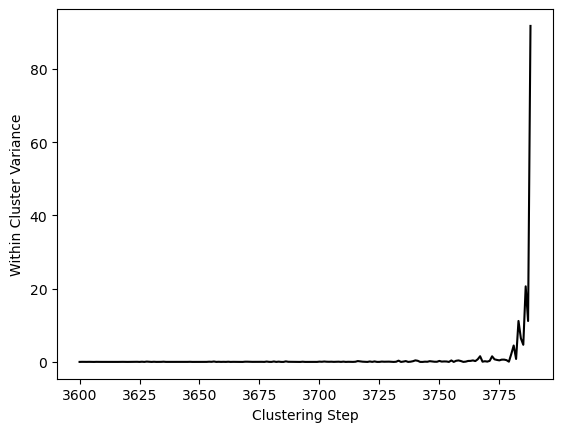

In [75]:
difference_plot(within_variance_weight30,3600,"weighting_30")

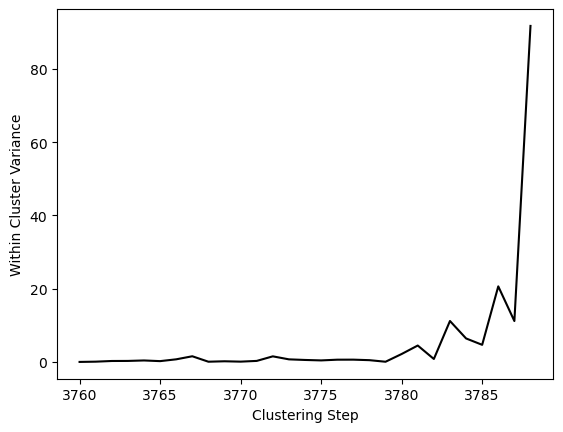

In [76]:
difference_plot(within_variance_weight30,3760,"weighting_30")

In [77]:
within_variance_weight30.iloc[-15:,:]

,within_variance,difference
3774,20.103682,0.546756
3775,20.527237,0.423555
3776,21.147431,0.620193
3777,21.777725,0.630295
3778,22.266233,0.488508
3779,22.326490,0.060257
3780,24.499333,2.172843
3781,28.986661,4.487328
3782,29.796694,0.810033
3783,40.981327,11.184634


In [78]:
variance_table30end=within_variance_weight30.iloc[-15:,:]

##### Variance cutoff 23

In [79]:
hier_cluster_weight30_v23,hier_cluster_means_weight30_v23=hier_clustering(Z_w30,df_housing,23)

In [80]:
hier_cluster_weight30_v23,hier_cluster_median_weight30_v23=hier_clustering_median(Z_w30,df_housing,23)

##### Variance cutoff 30

In [81]:
hier_cluster_weight30_v30,hier_cluster_means_weight30_v30=hier_clustering(Z_w30,df_housing,30)

In [82]:
hier_cluster_weight30_v30,hier_cluster_median_weight30_v30=hier_clustering_median(Z_w30,df_housing,30)

##### Variance cutoff 53

In [83]:
hier_cluster_weight30_v53,hier_cluster_means_weight30_v53=hier_clustering(Z_w30,df_housing,53)

In [84]:
hier_cluster_weight30_v53,hier_cluster_median_weight30_v53=hier_clustering_median(Z_w30,df_housing,53)

In [85]:
#saving tables of clustering results
hier_cluster_weight30_v53.to_csv('tables/hier_cluster_weight30_v53.csv', index=True)
hier_cluster_means_weight30_v53.to_csv('tables/hier_cluster_means_weight30_v53.csv', index=True)
hier_cluster_median_weight30_v53.to_csv('tables/hier_cluster_median_weight30_v53.csv', index=True)

##### Variance cutoff 84

In [86]:
hier_cluster_weight30_v84,hier_cluster_means_weight30_v84=hier_clustering(Z_w30,df_housing,84)

In [87]:
hier_cluster_weight30_v84,hier_cluster_median_weight30_v84=hier_clustering_median(Z_w30,df_housing,84)

To conclude, due to the ease of interpretation a cutoff value of 53 was chosen. Thus, 4 clusters are identified.